<center><H1>YouTube Podcast Video Analytics</H1></center>
<center>in-depth analysis of videos containing podcast keywords after 3 days of publishing</center>

<H2>1. Preparation</H2>

<H3>1.1 Import Required Library</H2>

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import nltk
from nltk.tokenize import word_tokenize
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from googletrans import Translator
import time
from keybert import KeyBERT
from scipy import stats
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score
from kneed import KneeLocator
from sklearn.decomposition import PCA
from wordcloud import WordCloud
import math
from sklearn.feature_extraction.text import TfidfVectorizer
import nltk
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer


<H3>1.2. Data Understanding</H3>

In [4]:
df = pd.read_csv('youtube_3days_stats.csv')

In [6]:
df.head()

,video_id,title,description,published_at,channel_id,category_id,duration,views,likes,comments,category_name
0,NyreUz7wi5w,"dr. TIRTA: GORENGAN, ES BUAH BIKIN LO CEPET M4...",login #ramadan #habibjafar #podcast #onadioleo...,2025-03-26T13:20:06Z,UCYk4LJI0Pr6RBDWowMm-KUw,24,PT58M33S,325747,12768,1341,Entertainment
1,ygcodv_xrUE,"BOBON VS WILLIE SALIM, KERAS‼️LOE &quot;SETTIN...",bobon #williesalim #rendang Join to see uncens...,2025-03-25T04:30:28Z,UCYk4LJI0Pr6RBDWowMm-KUw,24,PT1H4M57S,4668907,102736,29096,Entertainment
2,lluNjgCI1II,"JADI &quot;MANUSIA&quot; DULU, BARU BERAGAMA -...","gw baru tau banyak jenis kelompok islam, ada y...",2025-03-26T09:00:06Z,UCm4eA46c6boHmPrD0Lp2iEg,27,PT1H33M4S,274012,12894,1811,Education
3,_xLJDwp0Npc,SARGENTO CASTRO E DANILO SNIDER (POLÍCIA E SEG...,Sargento Castro é um policial com 37 anos de c...,2025-03-26T16:31:26Z,UC9LH3xFOJCCp2VFRcZjNdRQ,24,P0D,24006,5256,0,Entertainment
4,AnUs0ZvnXfk,"USTAD DERRY KRISTEN HUNTER, SIAPAPUN DI MUALAF...","Di episode ""Kristen Bertanya"" ini, kita bakal ...",2025-03-24T12:03:05Z,UCapUP1gKtGuhEkyaaHwxlpw,22,PT53M52S,1198968,19864,5799,People & Blogs


In [8]:
df.describe()

,category_id,views,likes,comments
count,1061.000000,1.061000e+03,1.061000e+03,1061.000000
mean,22.849199,1.328399e+06,4.441575e+04,1373.790763
std,3.352255,3.547879e+06,1.528964e+05,4415.634272
min,1.000000,7.360000e+02,0.000000e+00,0.000000
25%,22.000000,2.600000e+04,7.040000e+02,20.000000
50%,23.000000,1.730070e+05,4.436000e+03,223.000000
75%,24.000000,9.115690e+05,2.285100e+04,935.000000
max,29.000000,5.350225e+07,2.756323e+06,75928.000000


In [10]:
df.nunique()

video_id         1061
title            1057
description       703
published_at     1050
channel_id        637
category_id        15
duration          546
views            1060
likes             944
comments          632
category_name      14
dtype: int64

In [12]:
df.isnull().sum()

video_id           0
title              0
description      272
published_at       0
channel_id         0
category_id        0
duration           1
views              0
likes              0
comments           0
category_name    418
dtype: int64

In [14]:
df = df[pd.notnull(df['duration'])]

In [16]:
df[~pd.notnull(df['category_name'])]

,video_id,title,description,published_at,channel_id,category_id,duration,views,likes,comments,category_name
335,ZLXHUrWOyAg,"PRAZ TEGUH, Teman2 Beri gue waktu tuk menangis...",prazteguh #sedih #podcast Join to see uncensor...,2025-03-19T04:20:00Z,UCYk4LJI0Pr6RBDWowMm-KUw,24,PT48M1S,1804392,30473,2707,NaN
336,VY6kLJoWffk,"PWK – SURYA KASIAN BANGET,KALAU GA DI FRAMING,...","Hi Cuy! Balik lagi di Channel HAS Creative, na...",2025-03-15T12:00:47Z,UCio3ArXLJ_Mo8FLLGVzIC5A,24,PT1H20M16S,5039912,103861,13508,NaN
337,MpDy23SAkxM,"MASIH SALING PEDULI, NATASHA - DESTA BAKAL RUJ...","Yuhuu ada Natasha Rizky datang kesini, kalian ...",2025-03-13T12:01:10Z,UCapUP1gKtGuhEkyaaHwxlpw,22,PT1H2M10S,4366438,105395,7657,NaN
338,bqCOT1Kg7-E,"VIDI SAMPE NANGIS 😂, OM DED, OKI GALAAAK‼️FRI...",Join to see uncensored contents: https://www.y...,2025-03-22T03:20:00Z,UCYk4LJI0Pr6RBDWowMm-KUw,24,PT1H19M18S,3083610,62962,4919,NaN
339,fzKFBxJMeaI,"NUNUNG: Maaf saya cerita, Saya udah gak kuat M...",nunung #sedih #podcast Join to see uncensored ...,2025-03-10T04:20:00Z,UCYk4LJI0Pr6RBDWowMm-KUw,24,PT40M15S,5532029,145204,31902,NaN
...,...,...,...,...,...,...,...,...,...,...,...
748,WiUJcDGcWq8,M.C.N. Podcast | Ep.10. Off-Grid: Independență...,M.C.N. Podcast a revenit! În acest episod abor...,2025-03-24T08:00:26Z,UCAaqUlKbywt__K4jvlrRdbA,24,PT1H53M44S,17073,666,119,NaN
749,vf7w-VCIXmE,YOLA ARAÚJO NO FLY PODCAST &#39;&#39; VEJA A C...,YOLA ARAÚJO NO FLY PODCAST '' VEJA A CHEGADA D...,2025-03-24T19:11:33Z,UCQVYNTxcoONK6EZSv1v7iKw,24,PT2M1S,31062,735,57,NaN
750,WstiBfD8bWI,Podcast #JalanYangKupilih with Alif Satar x Jo...,NaN,2025-03-24T09:00:28Z,UCuzv14XKjB-nvVQg1NNMbVw,22,PT57M15S,13638,444,27,NaN
751,wxfSo1G3pOA,X&amp;O&#39;s CHAT PODCAST - Vassilis Spanoulis,EKSKLUZIVA – EPIZODA KOJA SE NE PROPUŠTA! Spre...,2025-03-25T17:01:10Z,UC_36OBfYhV4s1Iw3nR7jADQ,22,PT57M29S,8330,335,27,NaN


<H3>1.3. Data Preprocessing</H3>

<H4>1.3.1. Handling Missing Value in Video Category Using YouTube Data</H4>

In [20]:
category_map = {
    1: "Film & Animation",
    2: "Autos & Vehicles",
    10: "Music",
    15: "Pets & Animals",
    17: "Sports",
    20: "Gaming",
    22: "People & Blogs",
    23: "Comedy",
    24: "Entertainment",
    25: "News & Politics",
    26: "Howto & Style",
    27: "Education",
    28: "Science & Technology",
    29: "Nonprofits & Activism",
}
df["category_name"] = df["category_id"].map(category_map)


In [22]:
df["category_name"]=df["category_name"].fillna('Unknown')
df.isna().sum()

video_id           0
title              0
description      272
published_at       0
channel_id         0
category_id        0
duration           0
views              0
likes              0
comments           0
category_name      0
dtype: int64

In [24]:
df["category_name"].value_counts()

category_name
People & Blogs           397
Entertainment            365
Education                 97
Comedy                    71
News & Politics           44
Sports                    27
Music                     19
Howto & Style             13
Film & Animation           8
Gaming                     6
Science & Technology       5
Unknown                    3
Pets & Animals             2
Autos & Vehicles           2
Nonprofits & Activism      1
Name: count, dtype: int64

In [26]:
df = df[df["category_name"]!='Unknown']

<H3>1.4. Feature Engineering</H3>

<H4>1.4.1. Extract Emoji From Title</H4>

In [29]:
import re

def contains_emoji(text):
    emoji_pattern = re.compile("["
        "\U0001F600-\U0001F64F"  # Emoticons 😀-🙏
        "\U0001F300-\U0001F5FF"  # Symbols & pictographs 🌀-🗿
        "\U0001F680-\U0001F6FF"  # Transport & map symbols 🚀-🛿
        "\U0001F700-\U0001F77F"  # Alchemical symbols 🜀-🝿
        "\U0001F780-\U0001F7FF"  # Geometric shapes 🞀-🟿
        "\U0001F800-\U0001F8FF"  # Supplemental arrows 🠀-🠿
        "\U0001F900-\U0001F9FF"  # Supplemental symbols and pictographs 🤀-🧿
        "\U0001FA00-\U0001FA6F"  # Chess symbols & others 🨀-🩯
        "\U0001FA70-\U0001FAFF"  # More pictographs 🩰-🫿
        "\U00002702-\U000027B0"  # Dingbats ✂-➰
        "\U000024C2-\U0001F251"  # Enclosed characters Ⓜ-🉑
        "]+", flags=re.UNICODE)
    
    return int(emoji_pattern.search(text) is not None)


df["title_has_emoji"] = df["title"].apply(contains_emoji)

<H4>1.4.2. Extract information from title and video description such as number of words, hashtags,links, and mentions</H4>

In [36]:
def extract_features(row):
    title = row['title']
    description = row['description']
    
    if pd.isna(description):
        description = ""
    if pd.isna(title):
        title = ""
    
    title_tokens = nltk.word_tokenize(title)
    description_tokens = nltk.word_tokenize(description)
    
    title_word_count = len(title_tokens)
    description_word_count = len(description_tokens)
    
    title_has_number = int(bool(re.search(r'\d', title)))
    description_has_number = int(bool(re.search(r'\d', description)))
    
    thashtags = re.findall(r'#\w+', title)
    title_num_hashtags = len(thashtags)
    dhashtags = re.findall(r'#\w+', description)
    description_num_hashtags = len(dhashtags)
    
    links = re.findall(r'http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\\(\\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+', description)
    num_links = len(links)
    
    mentions = re.findall(r'@\w+', description)
    num_mentions = len(mentions)
    

    return {
        'title_word_count': title_word_count,
        'description_word_count': description_word_count,
        'title_has_number': title_has_number,
        'description_has_number': description_has_number,
        'title_num_hashtags': title_num_hashtags,
        'description_num_hashtags': description_num_hashtags,
        'num_links': num_links,
        'num_mentions': num_mentions
    }

df['title'].fillna('', inplace=True)
df['description'].fillna('', inplace=True)

features_df = df.apply(extract_features, axis=1, result_type='expand')

df_final = df.join(features_df)


df_final

/var/folders/fk/34t_tgpx507cwrtnrcbzx0_00000gn/T/ipykernel_13545/839688704.py:42: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['title'].fillna('', inplace=True)
/var/folders/fk/34t_tgpx507cwrtnrcbzx0_00000gn/T/ipykernel_13545/839688704.py:43: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves a

,video_id,title,description,published_at,channel_id,category_id,duration,views,likes,comments,category_name,title_has_emoji,title_word_count,description_word_count,title_has_number,description_has_number,title_num_hashtags,description_num_hashtags,num_links,num_mentions
0,NyreUz7wi5w,"dr. TIRTA: GORENGAN, ES BUAH BIKIN LO CEPET M4...",login #ramadan #habibjafar #podcast #onadioleo...,2025-03-26T13:20:06Z,UCYk4LJI0Pr6RBDWowMm-KUw,24,PT58M33S,325747,12768,1341,Entertainment,0,23,20,1,0,0,5,0,0
1,ygcodv_xrUE,"BOBON VS WILLIE SALIM, KERAS‼️LOE &quot;SETTIN...",bobon #williesalim #rendang Join to see uncens...,2025-03-25T04:30:28Z,UCYk4LJI0Pr6RBDWowMm-KUw,24,PT1H4M57S,4668907,102736,29096,Entertainment,1,22,12,0,0,0,2,0,0
2,lluNjgCI1II,"JADI &quot;MANUSIA&quot; DULU, BARU BERAGAMA -...","gw baru tau banyak jenis kelompok islam, ada y...",2025-03-26T09:00:06Z,UCm4eA46c6boHmPrD0Lp2iEg,27,PT1H33M4S,274012,12894,1811,Education,0,24,24,1,0,0,0,0,0
3,_xLJDwp0Npc,SARGENTO CASTRO E DANILO SNIDER (POLÍCIA E SEG...,Sargento Castro é um policial com 37 anos de c...,2025-03-26T16:31:26Z,UC9LH3xFOJCCp2VFRcZjNdRQ,24,P0D,24006,5256,0,Entertainment,0,16,24,1,1,0,0,0,0
4,AnUs0ZvnXfk,"USTAD DERRY KRISTEN HUNTER, SIAPAPUN DI MUALAF...","Di episode ""Kristen Bertanya"" ini, kita bakal ...",2025-03-24T12:03:05Z,UCapUP1gKtGuhEkyaaHwxlpw,22,PT53M52S,1198968,19864,5799,People & Blogs,0,15,24,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1056,5gQJ0Ci5yOU,"TEMPO, O GRANDE MISTÉRIO: SÉRGIO SACANI E CÉSA...",SÉRGIO SACANI é geofísico e CÉSAR LENZI é astr...,2024-10-22T01:59:30Z,UCWZoPPW7u2I4gZfhJBZ6NqQ,24,PT3H38M42S,1933229,41056,1183,Entertainment,0,18,25,1,0,1,0,0,0
1057,Z-xcy3Kg2S0,Aditi Sharma Spills the Chai: Relationships Go...,Watch Aditi Sharma Podcast with Paras Chhabra ...,2025-03-21T14:05:55Z,UC_-h6zsPJjqxa-Rb0k60Mxw,24,PT1H14M47S,54737,1301,146,Entertainment,0,13,23,0,0,0,0,0,0
1058,VnGFSQ79Yj4,A Terra é mais jovem do que se imagina? #dinos...,Assista + videos Sergio Sacani fala quais plan...,2025-03-20T21:00:21Z,UCDsSTDR60vaps6NP_g8-XRg,22,PT2M4S,885663,68056,1335,People & Blogs,0,16,19,0,0,3,0,1,0
1059,ZIojvbjcMXA,PODRE? NOVO CASTING DE VINGADORES É DIVULGADO!...,SUPER PROMOÇÃO Método BEWAY: https://edzz.la/P...,2025-03-26T19:59:10Z,UCjuiVJmqil8VdRen0gh3Ewg,24,P0D,4040,876,0,Entertainment,0,14,18,1,1,1,0,1,0


In [38]:
df_final.isna().sum()

video_id                    0
title                       0
description                 0
published_at                0
channel_id                  0
category_id                 0
duration                    0
views                       0
likes                       0
comments                    0
category_name               0
title_has_emoji             0
title_word_count            0
description_word_count      0
title_has_number            0
description_has_number      0
title_num_hashtags          0
description_num_hashtags    0
num_links                   0
num_mentions                0
dtype: int64

In [40]:
df_final.reset_index(drop=True)

,video_id,title,description,published_at,channel_id,category_id,duration,views,likes,comments,category_name,title_has_emoji,title_word_count,description_word_count,title_has_number,description_has_number,title_num_hashtags,description_num_hashtags,num_links,num_mentions
0,NyreUz7wi5w,"dr. TIRTA: GORENGAN, ES BUAH BIKIN LO CEPET M4...",login #ramadan #habibjafar #podcast #onadioleo...,2025-03-26T13:20:06Z,UCYk4LJI0Pr6RBDWowMm-KUw,24,PT58M33S,325747,12768,1341,Entertainment,0,23,20,1,0,0,5,0,0
1,ygcodv_xrUE,"BOBON VS WILLIE SALIM, KERAS‼️LOE &quot;SETTIN...",bobon #williesalim #rendang Join to see uncens...,2025-03-25T04:30:28Z,UCYk4LJI0Pr6RBDWowMm-KUw,24,PT1H4M57S,4668907,102736,29096,Entertainment,1,22,12,0,0,0,2,0,0
2,lluNjgCI1II,"JADI &quot;MANUSIA&quot; DULU, BARU BERAGAMA -...","gw baru tau banyak jenis kelompok islam, ada y...",2025-03-26T09:00:06Z,UCm4eA46c6boHmPrD0Lp2iEg,27,PT1H33M4S,274012,12894,1811,Education,0,24,24,1,0,0,0,0,0
3,_xLJDwp0Npc,SARGENTO CASTRO E DANILO SNIDER (POLÍCIA E SEG...,Sargento Castro é um policial com 37 anos de c...,2025-03-26T16:31:26Z,UC9LH3xFOJCCp2VFRcZjNdRQ,24,P0D,24006,5256,0,Entertainment,0,16,24,1,1,0,0,0,0
4,AnUs0ZvnXfk,"USTAD DERRY KRISTEN HUNTER, SIAPAPUN DI MUALAF...","Di episode ""Kristen Bertanya"" ini, kita bakal ...",2025-03-24T12:03:05Z,UCapUP1gKtGuhEkyaaHwxlpw,22,PT53M52S,1198968,19864,5799,People & Blogs,0,15,24,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1052,5gQJ0Ci5yOU,"TEMPO, O GRANDE MISTÉRIO: SÉRGIO SACANI E CÉSA...",SÉRGIO SACANI é geofísico e CÉSAR LENZI é astr...,2024-10-22T01:59:30Z,UCWZoPPW7u2I4gZfhJBZ6NqQ,24,PT3H38M42S,1933229,41056,1183,Entertainment,0,18,25,1,0,1,0,0,0
1053,Z-xcy3Kg2S0,Aditi Sharma Spills the Chai: Relationships Go...,Watch Aditi Sharma Podcast with Paras Chhabra ...,2025-03-21T14:05:55Z,UC_-h6zsPJjqxa-Rb0k60Mxw,24,PT1H14M47S,54737,1301,146,Entertainment,0,13,23,0,0,0,0,0,0
1054,VnGFSQ79Yj4,A Terra é mais jovem do que se imagina? #dinos...,Assista + videos Sergio Sacani fala quais plan...,2025-03-20T21:00:21Z,UCDsSTDR60vaps6NP_g8-XRg,22,PT2M4S,885663,68056,1335,People & Blogs,0,16,19,0,0,3,0,1,0
1055,ZIojvbjcMXA,PODRE? NOVO CASTING DE VINGADORES É DIVULGADO!...,SUPER PROMOÇÃO Método BEWAY: https://edzz.la/P...,2025-03-26T19:59:10Z,UCjuiVJmqil8VdRen0gh3Ewg,24,P0D,4040,876,0,Entertainment,0,14,18,1,1,1,0,1,0


In [50]:
#translate language into English
translator = Translator()

def clean_text(text):
    cleaned_text = re.sub(r'#\S+', '', text)
    cleaned_text = re.sub(r'[^\w\s]', '', cleaned_text)
    tokens = word_tokenize(cleaned_text)
    lower_tokens = [word.lower() for word in tokens]
    ready_text = ' '.join(lower_tokens)
    return ready_text

def eng_translator(text):
    cleaned = clean_text(text)
    if not cleaned.strip():
        return ""

    try:
        translated_text = translator.translate(cleaned, src='auto', dest='en').text
        return translated_text
    except Exception as e:
        return ""

<H4>1.4.3. Identify Call to Action words in Description</H4>

In [52]:
cta_patterns = [
    r'\bsubscribe\b', r'\bfollow\b', r'\bshare\b', r'\blike\b', r'\bcomment\b', 
    r'\bclick\b', r'\bjoin\b', r'\bget\b', r'\bbuy\b', r'\bregister\b', 
    r'\bdownload\b', r'\bsign\s?up\b', r'\bclaim\b', r'\bshop\b', r'\bstart\b',
    r'\btry\b', r'\blearn\b', r'\bsave\b', r'\bdiscover\b', r'\bexplore\b',
    r'\bunlock\b', r'\bcheck\b', r'\bact\b', r'\border\b', r'\bgrab\b'
]

cta_regex = re.compile('|'.join(cta_patterns), re.IGNORECASE)


def detect_cta(description):
    description_eng = eng_translator(description)
    matches = cta_regex.findall(description_eng)  
    cta_types = ', '.join(set(matches)) if matches else "No CTA"
    cta_binary = int(bool(matches)) 
    return pd.Series([cta_binary, cta_types])

df_final[['has_CTA', 'CTA_Types']] = df_final['description'].apply(detect_cta)

df_final


,video_id,title,description,published_at,channel_id,category_id,duration,views,likes,comments,...,title_word_count,description_word_count,title_has_number,description_has_number,title_num_hashtags,description_num_hashtags,num_links,num_mentions,has_CTA,CTA_Types
0,NyreUz7wi5w,"dr. TIRTA: GORENGAN, ES BUAH BIKIN LO CEPET M4...",login #ramadan #habibjafar #podcast #onadioleo...,2025-03-26T13:20:06Z,UCYk4LJI0Pr6RBDWowMm-KUw,24,PT58M33S,325747,12768,1341,...,23,20,1,0,0,5,0,0,0,No CTA
1,ygcodv_xrUE,"BOBON VS WILLIE SALIM, KERAS‼️LOE &quot;SETTIN...",bobon #williesalim #rendang Join to see uncens...,2025-03-25T04:30:28Z,UCYk4LJI0Pr6RBDWowMm-KUw,24,PT1H4M57S,4668907,102736,29096,...,22,12,0,0,0,2,0,0,1,join
2,lluNjgCI1II,"JADI &quot;MANUSIA&quot; DULU, BARU BERAGAMA -...","gw baru tau banyak jenis kelompok islam, ada y...",2025-03-26T09:00:06Z,UCm4eA46c6boHmPrD0Lp2iEg,27,PT1H33M4S,274012,12894,1811,...,24,24,1,0,0,0,0,0,0,No CTA
3,_xLJDwp0Npc,SARGENTO CASTRO E DANILO SNIDER (POLÍCIA E SEG...,Sargento Castro é um policial com 37 anos de c...,2025-03-26T16:31:26Z,UC9LH3xFOJCCp2VFRcZjNdRQ,24,P0D,24006,5256,0,...,16,24,1,1,0,0,0,0,0,No CTA
4,AnUs0ZvnXfk,"USTAD DERRY KRISTEN HUNTER, SIAPAPUN DI MUALAF...","Di episode ""Kristen Bertanya"" ini, kita bakal ...",2025-03-24T12:03:05Z,UCapUP1gKtGuhEkyaaHwxlpw,22,PT53M52S,1198968,19864,5799,...,15,24,0,0,0,0,0,0,0,No CTA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1056,5gQJ0Ci5yOU,"TEMPO, O GRANDE MISTÉRIO: SÉRGIO SACANI E CÉSA...",SÉRGIO SACANI é geofísico e CÉSAR LENZI é astr...,2024-10-22T01:59:30Z,UCWZoPPW7u2I4gZfhJBZ6NqQ,24,PT3H38M42S,1933229,41056,1183,...,18,25,1,0,1,0,0,0,1,like
1057,Z-xcy3Kg2S0,Aditi Sharma Spills the Chai: Relationships Go...,Watch Aditi Sharma Podcast with Paras Chhabra ...,2025-03-21T14:05:55Z,UC_-h6zsPJjqxa-Rb0k60Mxw,24,PT1H14M47S,54737,1301,146,...,13,23,0,0,0,0,0,0,0,No CTA
1058,VnGFSQ79Yj4,A Terra é mais jovem do que se imagina? #dinos...,Assista + videos Sergio Sacani fala quais plan...,2025-03-20T21:00:21Z,UCDsSTDR60vaps6NP_g8-XRg,22,PT2M4S,885663,68056,1335,...,16,19,0,0,3,0,1,0,0,No CTA
1059,ZIojvbjcMXA,PODRE? NOVO CASTING DE VINGADORES É DIVULGADO!...,SUPER PROMOÇÃO Método BEWAY: https://edzz.la/P...,2025-03-26T19:59:10Z,UCjuiVJmqil8VdRen0gh3Ewg,24,P0D,4040,876,0,...,14,18,1,1,1,0,1,0,0,No CTA


In [55]:
df_final['title_eng'] = df_final['title'].apply(eng_translator)
df_final['description_eng'] = df_final['description'].apply(eng_translator)

In [57]:
df_final

,video_id,title,description,published_at,channel_id,category_id,duration,views,likes,comments,...,title_has_number,description_has_number,title_num_hashtags,description_num_hashtags,num_links,num_mentions,has_CTA,CTA_Types,title_eng,description_eng
0,NyreUz7wi5w,"dr. TIRTA: GORENGAN, ES BUAH BIKIN LO CEPET M4...",login #ramadan #habibjafar #podcast #onadioleo...,2025-03-26T13:20:06Z,UCYk4LJI0Pr6RBDWowMm-KUw,24,PT58M33S,325747,12768,1341,...,1,0,0,5,0,0,0,No CTA,Dr Tirta fried fruit ice fruit makes you fast ...,Login a new point of view every day during the...
1,ygcodv_xrUE,"BOBON VS WILLIE SALIM, KERAS‼️LOE &quot;SETTIN...",bobon #williesalim #rendang Join to see uncens...,2025-03-25T04:30:28Z,UCYk4LJI0Pr6RBDWowMm-KUw,24,PT1H4M57S,4668907,102736,29096,...,0,0,0,2,0,0,1,join,Bobon and Willie Salim Kingrae Quot Quot Quot ...,bobon join to see uncensored contents
2,lluNjgCI1II,"JADI &quot;MANUSIA&quot; DULU, BARU BERAGAMA -...","gw baru tau banyak jenis kelompok islam, ada y...",2025-03-26T09:00:06Z,UCm4eA46c6boHmPrD0Lp2iEg,27,PT1H33M4S,274012,12894,1811,...,1,0,0,0,0,0,0,No CTA,so the quote of the Muslim 26 fm koiyo,I just found out that there are many types of ...
3,_xLJDwp0Npc,SARGENTO CASTRO E DANILO SNIDER (POLÍCIA E SEG...,Sargento Castro é um policial com 37 anos de c...,2025-03-26T16:31:26Z,UC9LH3xFOJCCp2VFRcZjNdRQ,24,P0D,24006,5256,0,...,1,1,0,0,0,0,0,No CTA,Sergeant Castro and Danilo Snider Police and P...,Sergeant Castro is a police officer with a 37 ...
4,AnUs0ZvnXfk,"USTAD DERRY KRISTEN HUNTER, SIAPAPUN DI MUALAF...","Di episode ""Kristen Bertanya"" ini, kita bakal ...",2025-03-24T12:03:05Z,UCapUP1gKtGuhEkyaaHwxlpw,22,PT53M52S,1198968,19864,5799,...,0,0,0,0,0,0,0,No CTA,Ustad Derry Kristen Anyone at the Christian co...,in the Christian episode asking this we will c...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1056,5gQJ0Ci5yOU,"TEMPO, O GRANDE MISTÉRIO: SÉRGIO SACANI E CÉSA...",SÉRGIO SACANI é geofísico e CÉSAR LENZI é astr...,2024-10-22T01:59:30Z,UCWZoPPW7u2I4gZfhJBZ6NqQ,24,PT3H38M42S,1933229,41056,1183,...,1,0,1,0,0,0,1,like,Time The Great Mystery Sérgio Sacani and César...,Sérgio Sacani is geophysical and César Lenzi i...
1057,Z-xcy3Kg2S0,Aditi Sharma Spills the Chai: Relationships Go...,Watch Aditi Sharma Podcast with Paras Chhabra ...,2025-03-21T14:05:55Z,UC_-h6zsPJjqxa-Rb0k60Mxw,24,PT1H14M47S,54737,1301,146,...,0,0,0,0,0,0,0,No CTA,aditi sharma spills the chai relationships gon...,watch aditi sharma podcast with paras chhabra ...
1058,VnGFSQ79Yj4,A Terra é mais jovem do que se imagina? #dinos...,Assista + videos Sergio Sacani fala quais plan...,2025-03-20T21:00:21Z,UCDsSTDR60vaps6NP_g8-XRg,22,PT2M4S,885663,68056,1335,...,0,0,3,0,1,0,0,No CTA,The earth is younger than you can imagine,Watch videos sergio sacani speaks which planet...
1059,ZIojvbjcMXA,PODRE? NOVO CASTING DE VINGADORES É DIVULGADO!...,SUPER PROMOÇÃO Método BEWAY: https://edzz.la/P...,2025-03-26T19:59:10Z,UCjuiVJmqil8VdRen0gh3Ewg,24,P0D,4040,876,0,...,1,1,1,0,1,0,0,No CTA,Rotten New Avengers casting is released Cast l...,Super Promotion Beway Method httpsedzzlap3baz5...


<H4>1.4.4. Sentiment Analyze on Title and Description</H4>

In [64]:
sia = SentimentIntensityAnalyzer()

def analyze_sentiment(text, retries=3, delay=2):
    if text and isinstance(text, str):
        attempt = 0
        while attempt < retries:
            try:
                sentiment_score = sia.polarity_scores(text)['compound']
                return sentiment_score
            except Exception as e:
                print(f"Error processing text: {text}, error: {e}")
                attempt += 1
                time.sleep(delay)
        return None
    else:
        print(f"Text is empty or None: {text}")
        return None

In [80]:
df_final.loc[df_final['title_eng'] == "", 'title_eng'] = df_final.loc[df_final['title_eng'] == "", 'title']
df_final.loc[df_final['description_eng'] == "", 'description_eng'] = df_final.loc[df_final['description_eng'] == "", 'description']


In [82]:
df_final['title_sentiment'] = df_final['title_eng'].apply(analyze_sentiment)
df_final['description_sentiment'] = df_final['description_eng'].apply(analyze_sentiment)

Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or None: 
Text is empty or

In [84]:
df_final.isna().sum()

video_id                      0
title                         0
description                   0
published_at                  0
channel_id                    0
category_id                   0
duration                      0
views                         0
likes                         0
comments                      0
category_name                 0
title_has_emoji               0
title_word_count              0
description_word_count        0
title_has_number              0
description_has_number        0
title_num_hashtags            0
description_num_hashtags      0
num_links                     0
num_mentions                  0
has_CTA                       0
CTA_Types                     0
title_eng                     0
description_eng               0
title_sentiment               0
description_sentiment       270
dtype: int64

In [90]:
df_final['description_sentiment'].fillna(0,inplace=True)

/var/folders/fk/34t_tgpx507cwrtnrcbzx0_00000gn/T/ipykernel_13545/1538668185.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_final['description_sentiment'].fillna(0,inplace=True)


In [92]:
df_final.isna().sum()

video_id                    0
title                       0
description                 0
published_at                0
channel_id                  0
category_id                 0
duration                    0
views                       0
likes                       0
comments                    0
category_name               0
title_has_emoji             0
title_word_count            0
description_word_count      0
title_has_number            0
description_has_number      0
title_num_hashtags          0
description_num_hashtags    0
num_links                   0
num_mentions                0
has_CTA                     0
CTA_Types                   0
title_eng                   0
description_eng             0
title_sentiment             0
description_sentiment       0
dtype: int64

In [94]:
# df_final = df_final.drop(columns = ['video_id','title','channel_id','category_id'])
df_final

,video_id,title,description,published_at,channel_id,category_id,duration,views,likes,comments,...,title_num_hashtags,description_num_hashtags,num_links,num_mentions,has_CTA,CTA_Types,title_eng,description_eng,title_sentiment,description_sentiment
0,NyreUz7wi5w,"dr. TIRTA: GORENGAN, ES BUAH BIKIN LO CEPET M4...",login #ramadan #habibjafar #podcast #onadioleo...,2025-03-26T13:20:06Z,UCYk4LJI0Pr6RBDWowMm-KUw,24,PT58M33S,325747,12768,1341,...,0,5,0,0,0,No CTA,Dr Tirta fried fruit ice fruit makes you fast ...,Login a new point of view every day during the...,0.0000,0.0000
1,ygcodv_xrUE,"BOBON VS WILLIE SALIM, KERAS‼️LOE &quot;SETTIN...",bobon #williesalim #rendang Join to see uncens...,2025-03-25T04:30:28Z,UCYk4LJI0Pr6RBDWowMm-KUw,24,PT1H4M57S,4668907,102736,29096,...,0,2,0,0,1,join,Bobon and Willie Salim Kingrae Quot Quot Quot ...,bobon join to see uncensored contents,0.0000,0.2960
2,lluNjgCI1II,"JADI &quot;MANUSIA&quot; DULU, BARU BERAGAMA -...","gw baru tau banyak jenis kelompok islam, ada y...",2025-03-26T09:00:06Z,UCm4eA46c6boHmPrD0Lp2iEg,27,PT1H33M4S,274012,12894,1811,...,0,0,0,0,0,No CTA,so the quote of the Muslim 26 fm koiyo,I just found out that there are many types of ...,0.0000,0.0000
3,_xLJDwp0Npc,SARGENTO CASTRO E DANILO SNIDER (POLÍCIA E SEG...,Sargento Castro é um policial com 37 anos de c...,2025-03-26T16:31:26Z,UC9LH3xFOJCCp2VFRcZjNdRQ,24,P0D,24006,5256,0,...,0,0,0,0,0,No CTA,Sergeant Castro and Danilo Snider Police and P...,Sergeant Castro is a police officer with a 37 ...,0.3400,0.5267
4,AnUs0ZvnXfk,"USTAD DERRY KRISTEN HUNTER, SIAPAPUN DI MUALAF...","Di episode ""Kristen Bertanya"" ini, kita bakal ...",2025-03-24T12:03:05Z,UCapUP1gKtGuhEkyaaHwxlpw,22,PT53M52S,1198968,19864,5799,...,0,0,0,0,0,No CTA,Ustad Derry Kristen Anyone at the Christian co...,in the Christian episode asking this we will c...,0.0000,0.4939
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1056,5gQJ0Ci5yOU,"TEMPO, O GRANDE MISTÉRIO: SÉRGIO SACANI E CÉSA...",SÉRGIO SACANI é geofísico e CÉSAR LENZI é astr...,2024-10-22T01:59:30Z,UCWZoPPW7u2I4gZfhJBZ6NqQ,24,PT3H38M42S,1933229,41056,1183,...,1,0,0,0,1,like,Time The Great Mystery Sérgio Sacani and César...,Sérgio Sacani is geophysical and César Lenzi i...,0.8020,0.3612
1057,Z-xcy3Kg2S0,Aditi Sharma Spills the Chai: Relationships Go...,Watch Aditi Sharma Podcast with Paras Chhabra ...,2025-03-21T14:05:55Z,UC_-h6zsPJjqxa-Rb0k60Mxw,24,PT1H14M47S,54737,1301,146,...,0,0,0,0,0,No CTA,aditi sharma spills the chai relationships gon...,watch aditi sharma podcast with paras chhabra ...,-0.4767,0.4588
1058,VnGFSQ79Yj4,A Terra é mais jovem do que se imagina? #dinos...,Assista + videos Sergio Sacani fala quais plan...,2025-03-20T21:00:21Z,UCDsSTDR60vaps6NP_g8-XRg,22,PT2M4S,885663,68056,1335,...,3,0,1,0,0,No CTA,The earth is younger than you can imagine,Watch videos sergio sacani speaks which planet...,0.0000,0.0000
1059,ZIojvbjcMXA,PODRE? NOVO CASTING DE VINGADORES É DIVULGADO!...,SUPER PROMOÇÃO Método BEWAY: https://edzz.la/P...,2025-03-26T19:59:10Z,UCjuiVJmqil8VdRen0gh3Ewg,24,P0D,4040,876,0,...,1,0,1,0,0,No CTA,Rotten New Avengers casting is released Cast l...,Super Promotion Beway Method httpsedzzlap3baz5...,-0.5106,0.5994


<H4>1.4.5. Extract times information when the video is published </H4>

In [108]:
df_final["published_at"] = pd.to_datetime(df_final["published_at"], utc=True)

df_final["day_of_week"] = df_final["published_at"].dt.day_name()
df_final["hour_decimal"] = df_final["published_at"].dt.hour + df_final["published_at"].dt.minute / 60
df_final["year_published"]=df_final["published_at"].dt.year
df_final


,video_id,title,description,published_at,channel_id,category_id,duration,views,likes,comments,...,num_mentions,has_CTA,CTA_Types,title_eng,description_eng,title_sentiment,description_sentiment,day_of_week,hour_decimal,year_published
0,NyreUz7wi5w,"dr. TIRTA: GORENGAN, ES BUAH BIKIN LO CEPET M4...",login #ramadan #habibjafar #podcast #onadioleo...,2025-03-26 13:20:06+00:00,UCYk4LJI0Pr6RBDWowMm-KUw,24,PT58M33S,325747,12768,1341,...,0,0,No CTA,Dr Tirta fried fruit ice fruit makes you fast ...,Login a new point of view every day during the...,0.0000,0.0000,Wednesday,13.333333,2025
1,ygcodv_xrUE,"BOBON VS WILLIE SALIM, KERAS‼️LOE &quot;SETTIN...",bobon #williesalim #rendang Join to see uncens...,2025-03-25 04:30:28+00:00,UCYk4LJI0Pr6RBDWowMm-KUw,24,PT1H4M57S,4668907,102736,29096,...,0,1,join,Bobon and Willie Salim Kingrae Quot Quot Quot ...,bobon join to see uncensored contents,0.0000,0.2960,Tuesday,4.500000,2025
2,lluNjgCI1II,"JADI &quot;MANUSIA&quot; DULU, BARU BERAGAMA -...","gw baru tau banyak jenis kelompok islam, ada y...",2025-03-26 09:00:06+00:00,UCm4eA46c6boHmPrD0Lp2iEg,27,PT1H33M4S,274012,12894,1811,...,0,0,No CTA,so the quote of the Muslim 26 fm koiyo,I just found out that there are many types of ...,0.0000,0.0000,Wednesday,9.000000,2025
3,_xLJDwp0Npc,SARGENTO CASTRO E DANILO SNIDER (POLÍCIA E SEG...,Sargento Castro é um policial com 37 anos de c...,2025-03-26 16:31:26+00:00,UC9LH3xFOJCCp2VFRcZjNdRQ,24,P0D,24006,5256,0,...,0,0,No CTA,Sergeant Castro and Danilo Snider Police and P...,Sergeant Castro is a police officer with a 37 ...,0.3400,0.5267,Wednesday,16.516667,2025
4,AnUs0ZvnXfk,"USTAD DERRY KRISTEN HUNTER, SIAPAPUN DI MUALAF...","Di episode ""Kristen Bertanya"" ini, kita bakal ...",2025-03-24 12:03:05+00:00,UCapUP1gKtGuhEkyaaHwxlpw,22,PT53M52S,1198968,19864,5799,...,0,0,No CTA,Ustad Derry Kristen Anyone at the Christian co...,in the Christian episode asking this we will c...,0.0000,0.4939,Monday,12.050000,2025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1056,5gQJ0Ci5yOU,"TEMPO, O GRANDE MISTÉRIO: SÉRGIO SACANI E CÉSA...",SÉRGIO SACANI é geofísico e CÉSAR LENZI é astr...,2024-10-22 01:59:30+00:00,UCWZoPPW7u2I4gZfhJBZ6NqQ,24,PT3H38M42S,1933229,41056,1183,...,0,1,like,Time The Great Mystery Sérgio Sacani and César...,Sérgio Sacani is geophysical and César Lenzi i...,0.8020,0.3612,Tuesday,1.983333,2024
1057,Z-xcy3Kg2S0,Aditi Sharma Spills the Chai: Relationships Go...,Watch Aditi Sharma Podcast with Paras Chhabra ...,2025-03-21 14:05:55+00:00,UC_-h6zsPJjqxa-Rb0k60Mxw,24,PT1H14M47S,54737,1301,146,...,0,0,No CTA,aditi sharma spills the chai relationships gon...,watch aditi sharma podcast with paras chhabra ...,-0.4767,0.4588,Friday,14.083333,2025
1058,VnGFSQ79Yj4,A Terra é mais jovem do que se imagina? #dinos...,Assista + videos Sergio Sacani fala quais plan...,2025-03-20 21:00:21+00:00,UCDsSTDR60vaps6NP_g8-XRg,22,PT2M4S,885663,68056,1335,...,0,0,No CTA,The earth is younger than you can imagine,Watch videos sergio sacani speaks which planet...,0.0000,0.0000,Thursday,21.000000,2025
1059,ZIojvbjcMXA,PODRE? NOVO CASTING DE VINGADORES É DIVULGADO!...,SUPER PROMOÇÃO Método BEWAY: https://edzz.la/P...,2025-03-26 19:59:10+00:00,UCjuiVJmqil8VdRen0gh3Ewg,24,P0D,4040,876,0,...,0,0,No CTA,Rotten New Avengers casting is released Cast l...,Super Promotion Beway Method httpsedzzlap3baz5...,-0.5106,0.5994,Wednesday,19.983333,2025


<h4>1.4.6. Extract video duration</h4>

In [115]:
df_final = df_final[df_final["duration"].str.startswith("PT", na=False)]
df_final.reset_index(drop=True)

,video_id,title,description,published_at,channel_id,category_id,duration,views,likes,comments,...,num_mentions,has_CTA,CTA_Types,title_eng,description_eng,title_sentiment,description_sentiment,day_of_week,hour_decimal,year_published
0,NyreUz7wi5w,"dr. TIRTA: GORENGAN, ES BUAH BIKIN LO CEPET M4...",login #ramadan #habibjafar #podcast #onadioleo...,2025-03-26 13:20:06+00:00,UCYk4LJI0Pr6RBDWowMm-KUw,24,PT58M33S,325747,12768,1341,...,0,0,No CTA,Dr Tirta fried fruit ice fruit makes you fast ...,Login a new point of view every day during the...,0.0000,0.0000,Wednesday,13.333333,2025
1,ygcodv_xrUE,"BOBON VS WILLIE SALIM, KERAS‼️LOE &quot;SETTIN...",bobon #williesalim #rendang Join to see uncens...,2025-03-25 04:30:28+00:00,UCYk4LJI0Pr6RBDWowMm-KUw,24,PT1H4M57S,4668907,102736,29096,...,0,1,join,Bobon and Willie Salim Kingrae Quot Quot Quot ...,bobon join to see uncensored contents,0.0000,0.2960,Tuesday,4.500000,2025
2,lluNjgCI1II,"JADI &quot;MANUSIA&quot; DULU, BARU BERAGAMA -...","gw baru tau banyak jenis kelompok islam, ada y...",2025-03-26 09:00:06+00:00,UCm4eA46c6boHmPrD0Lp2iEg,27,PT1H33M4S,274012,12894,1811,...,0,0,No CTA,so the quote of the Muslim 26 fm koiyo,I just found out that there are many types of ...,0.0000,0.0000,Wednesday,9.000000,2025
3,AnUs0ZvnXfk,"USTAD DERRY KRISTEN HUNTER, SIAPAPUN DI MUALAF...","Di episode ""Kristen Bertanya"" ini, kita bakal ...",2025-03-24 12:03:05+00:00,UCapUP1gKtGuhEkyaaHwxlpw,22,PT53M52S,1198968,19864,5799,...,0,0,No CTA,Ustad Derry Kristen Anyone at the Christian co...,in the Christian episode asking this we will c...,0.0000,0.4939,Monday,12.050000,2025
4,rzgUMVP5kyE,FULL HOROR!! PERJALANAN MUDIK PALING HOROR! SA...,Buat Temen2 yang punya pengalaman Horor atau m...,2025-03-24 13:30:47+00:00,UCA3VSRqmGEe1Ysy1psWHKGw,22,PT1H10S,167323,4706,925,...,0,0,No CTA,Full Horror The most horror homecoming trip wh...,for friends who have horror or mystical experi...,-0.8748,0.1779,Monday,13.500000,2025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1044,7LS_zqM9auI,transgender Khushi Shaikh talking about her Bo...,trangender #podcast #shortsfeed #youtubeshorts...,2024-04-08 14:30:02+00:00,UCk9puk4QSk94UNJewhKZ00g,22,PT48S,14823302,632653,1628,...,0,0,No CTA,transgender khushi shaikh talking about her bo...,transgender,0.0000,0.0000,Monday,14.500000,2024
1045,z5Yxk6s971E,Toto Wolff Exclusive: The Full Story Of Lewis ...,Want episodes before anyone else? Download The...,2024-11-11 06:00:35+00:00,UCT4hFq01krOatjiSG7z3iag,17,PT1H13M23S,588211,13314,779,...,0,1,download,toto wolff exclusive the full story of lewis h...,want episodes before anyone else download the ...,0.1280,0.5106,Monday,6.000000,2024
1046,5gQJ0Ci5yOU,"TEMPO, O GRANDE MISTÉRIO: SÉRGIO SACANI E CÉSA...",SÉRGIO SACANI é geofísico e CÉSAR LENZI é astr...,2024-10-22 01:59:30+00:00,UCWZoPPW7u2I4gZfhJBZ6NqQ,24,PT3H38M42S,1933229,41056,1183,...,0,1,like,Time The Great Mystery Sérgio Sacani and César...,Sérgio Sacani is geophysical and César Lenzi i...,0.8020,0.3612,Tuesday,1.983333,2024
1047,Z-xcy3Kg2S0,Aditi Sharma Spills the Chai: Relationships Go...,Watch Aditi Sharma Podcast with Paras Chhabra ...,2025-03-21 14:05:55+00:00,UC_-h6zsPJjqxa-Rb0k60Mxw,24,PT1H14M47S,54737,1301,146,...,0,0,No CTA,aditi sharma spills the chai relationships gon...,watch aditi sharma podcast with paras chhabra ...,-0.4767,0.4588,Friday,14.083333,2025


In [117]:
import re

def duration_to_minutes(duration):
    if not isinstance(duration, str):  # Pastikan input adalah string
        return None
    
    match = re.match(r'PT(\d+H)?(\d+M)?(\d+S)?', duration)
    if not match:
        return None  # Jika tidak sesuai format, kembalikan None
    
    hours = int(match.group(1)[:-1]) if match.group(1) else 0
    minutes = int(match.group(2)[:-1]) if match.group(2) else 0
    seconds = int(match.group(3)[:-1]) if match.group(3) else 0

    return hours * 60 + minutes + seconds / 60  # Hasil dalam menit

# Terapkan ke DataFrame
df_final["duration_minutes"] = df_final["duration"].apply(duration_to_minutes)


/var/folders/fk/34t_tgpx507cwrtnrcbzx0_00000gn/T/ipykernel_13545/3258168035.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_final["duration_minutes"] = df_final["duration"].apply(duration_to_minutes)


In [119]:
df_final = df_final.drop(columns=['video_id','title','published_at','channel_id','category_id','duration','description'])

In [123]:
df_final.columns

Index(['views', 'likes', 'comments', 'category_name', 'title_has_emoji',
       'title_word_count', 'description_word_count', 'title_has_number',
       'description_has_number', 'title_num_hashtags',
       'description_num_hashtags', 'num_links', 'num_mentions', 'has_CTA',
       'CTA_Types', 'title_eng', 'description_eng', 'title_sentiment',
       'description_sentiment', 'day_of_week', 'hour_decimal',
       'year_published', 'duration_minutes'],
      dtype='object')

In [140]:
from keybert import KeyBERT

kw_model = KeyBERT()

def extract_topic(text, top_n=3):
    text = clean_text(text)
    
    if not text.strip():
        return []
    
    keywords = kw_model.extract_keywords(text, keyphrase_ngram_range=(1, 2), top_n=top_n)
    return [kw[0] for kw in keywords]


In [142]:
df_final['title_topic'] = df_final['title_eng'].apply(extract_topic)
df_final['description_topic'] = df_final['description_eng'].apply(extract_topic)

In [146]:
df_final.head()

,views,likes,comments,category_name,title_has_emoji,title_word_count,description_word_count,title_has_number,description_has_number,title_num_hashtags,...,title_eng,description_eng,title_sentiment,description_sentiment,day_of_week,hour_decimal,year_published,duration_minutes,title_topic,description_topic
0,325747,12768,1341,Entertainment,0,23,20,1,0,0,...,Dr Tirta fried fruit ice fruit makes you fast ...,Login a new point of view every day during the...,0.0000,0.0000,Wednesday,13.333333,2025,58.550000,"[ice fruit, tirta fried, fruit ice]","[month ramadan, ramadan, view day]"
1,4668907,102736,29096,Entertainment,1,22,12,0,0,0,...,Bobon and Willie Salim Kingrae Quot Quot Quot ...,bobon join to see uncensored contents,0.0000,0.2960,Tuesday,4.500000,2025,64.950000,"[willie salim, claims podcast, bobon]","[join uncensored, uncensored contents, bobon j..."
2,274012,12894,1811,Education,0,24,24,1,0,0,...,so the quote of the Muslim 26 fm koiyo,I just found out that there are many types of ...,0.0000,0.0000,Wednesday,9.000000,2025,93.066667,"[quote muslim, fm koiyo, muslim 26]","[islamic groups, chatted muslim, muslim members]"
4,1198968,19864,5799,People & Blogs,0,15,24,0,0,0,...,Ustad Derry Kristen Anyone at the Christian co...,in the Christian episode asking this we will c...,0.0000,0.4939,Monday,12.050000,2025,53.866667,"[derry kristen, kristen christian, ustad derry]","[derry sulaiman, sulaiman coki, ustad derry]"
5,167323,4706,925,People & Blogs,0,18,20,0,1,0,...,Full Horror The most horror homecoming trip wh...,for friends who have horror or mystical experi...,-0.8748,0.1779,Monday,13.500000,2025,60.166667,"[horror homecoming, night pantura, trip lost]","[horror mystical, horror experiences, friends ..."


In [152]:
df_final['description_topic'].explode().nunique()

1853

<H4>1.4.7. Checking Clicbait</H4>

In [160]:
clickbait_keywords = [
    "revealed", "shocking", "unbelievable", "you wont believe", "must see", 
    "the truth about", "secret", "what happens next", "amazing", "incredible", 
    "before its too late", "this is why", "the truth behind", "you didnt know", 
    "the top secret", "find out what happens", "you never knew", "dont miss", 
    "the hidden truth", "the one thing you need to know", "uncovered", "exposed", 
    "how to", "how you can", "why you should", "this one thing", "the ultimate guide", 
    "everything you need to know", "heres what happens", "the shocking truth", 
    "what everyone is talking about", "this will change your life", "mindblowing", 
    "revolutionary", "gamechanging", "incredible find", "lifechanging", 
    "the most shocking thing", "you wont believe what happens next", "what they dont tell you", 
    "the real reason", "breaking news", "you have to see this", "why no one told you", 
    "what happens when", "how they did it", "youll be shocked", "this could be you", 
    "can you guess"
]

def is_clickbait(title, description, diff_threshold=20):
    title_lower = title.lower()
    description_lower = description.lower()
    clickbait_in_title = any(keyword in title_lower for keyword in clickbait_keywords)
    diff_length = abs(len(title) - len(description))
    if clickbait_in_title and diff_length > diff_threshold:
        return int(True)
    elif clickbait_in_title:
        return int(True)
    return int(False)


In [162]:
df_final['is_clickbait'] = df_final.apply(lambda row: is_clickbait(row['title_eng'], row['description_eng']), axis=1)


In [177]:
df_final.drop(columns=['title_eng','description_eng'])
df_final.reset_index(drop=True)

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


,views,likes,comments,category_name,title_has_emoji,title_word_count,description_word_count,title_has_number,description_has_number,title_num_hashtags,...,description_eng,title_sentiment,description_sentiment,day_of_week,hour_decimal,year_published,duration_minutes,title_topic,description_topic,is_clickbait
0,325747,12768,1341,Entertainment,0,23,20,1,0,0,...,Login a new point of view every day during the...,0.0000,0.0000,Wednesday,13.333333,2025,58.550000,"[ice fruit, tirta fried, fruit ice]","[month ramadan, ramadan, view day]",0
1,4668907,102736,29096,Entertainment,1,22,12,0,0,0,...,bobon join to see uncensored contents,0.0000,0.2960,Tuesday,4.500000,2025,64.950000,"[willie salim, claims podcast, bobon]","[join uncensored, uncensored contents, bobon j...",0
2,274012,12894,1811,Education,0,24,24,1,0,0,...,I just found out that there are many types of ...,0.0000,0.0000,Wednesday,9.000000,2025,93.066667,"[quote muslim, fm koiyo, muslim 26]","[islamic groups, chatted muslim, muslim members]",0
3,1198968,19864,5799,People & Blogs,0,15,24,0,0,0,...,in the Christian episode asking this we will c...,0.0000,0.4939,Monday,12.050000,2025,53.866667,"[derry kristen, kristen christian, ustad derry]","[derry sulaiman, sulaiman coki, ustad derry]",0
4,167323,4706,925,People & Blogs,0,18,20,0,1,0,...,for friends who have horror or mystical experi...,-0.8748,0.1779,Monday,13.500000,2025,60.166667,"[horror homecoming, night pantura, trip lost]","[horror mystical, horror experiences, friends ...",0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1044,14823302,632653,1628,People & Blogs,0,13,12,0,0,3,...,transgender,0.0000,0.0000,Monday,14.500000,2024,0.800000,"[transgender khushi, khushi shaikh, shaikh tal...",[transgender],0
1045,588211,13314,779,Sports,0,24,22,1,0,1,...,want episodes before anyone else download the ...,0.1280,0.5106,Monday,6.000000,2024,73.383333,"[toto wolff, story lewis, lewis hamilton]","[episodes download, httpshppodcoapp welcome, h...",0
1046,1933229,41056,1183,Entertainment,0,18,25,1,0,1,...,Sérgio Sacani is geophysical and César Lenzi i...,0.8020,0.3612,Tuesday,1.983333,2024,218.700000,"[ltda podcast, podcast, mystery sérgio]","[astrophysicist chat, lenzi astrophysicist, sé...",0
1047,54737,1301,146,Entertainment,0,13,23,0,0,0,...,watch aditi sharma podcast with paras chhabra ...,-0.4767,0.4588,Friday,14.083333,2025,74.783333,"[chhabra podcast, aditi sharma, chai relations...","[chhabra abraa, paras chhabra, sharma podcast]",0


<H4>1.4.8. Sentiment Labeling</H4>

In [182]:
df_final['title_sentiment_label'] = df_final['title_sentiment'].apply(lambda x: 'negative' if x < 0 else 'positive' if x > 0 else 'neutral')
df_final['description_sentiment_label'] = df_final['description_sentiment'].apply(lambda x: 'negative' if x < 0 else 'positive' if x > 0 else 'neutral')

<H4>Export dataframe to CSV</H4>

In [185]:
df_final.to_csv('youtube_3days_stats_extracted.csv',index=False)

Load the exported dataset

In [5]:
df_final = pd.read_csv('youtube_3days_stats_extracted.csv')
df_final.head()

,views,likes,comments,category_name,title_has_emoji,title_word_count,description_word_count,title_has_number,description_has_number,title_num_hashtags,...,description_sentiment,day_of_week,hour_decimal,year_published,duration_minutes,title_topic,description_topic,is_clickbait,title_sentiment_label,description_sentiment_label
0,325747,12768,1341,Entertainment,0,23,20,1,0,0,...,0.0000,Wednesday,13.333333,2025,58.550000,"['ice fruit', 'tirta fried', 'fruit ice']","['month ramadan', 'ramadan', 'view day']",0,neutral,neutral
1,4668907,102736,29096,Entertainment,1,22,12,0,0,0,...,0.2960,Tuesday,4.500000,2025,64.950000,"['willie salim', 'claims podcast', 'bobon']","['join uncensored', 'uncensored contents', 'bo...",0,neutral,positive
2,274012,12894,1811,Education,0,24,24,1,0,0,...,0.0000,Wednesday,9.000000,2025,93.066667,"['quote muslim', 'fm koiyo', 'muslim 26']","['islamic groups', 'chatted muslim', 'muslim m...",0,neutral,neutral
3,1198968,19864,5799,People & Blogs,0,15,24,0,0,0,...,0.4939,Monday,12.050000,2025,53.866667,"['derry kristen', 'kristen christian', 'ustad ...","['derry sulaiman', 'sulaiman coki', 'ustad der...",0,neutral,positive
4,167323,4706,925,People & Blogs,0,18,20,0,1,0,...,0.1779,Monday,13.500000,2025,60.166667,"['horror homecoming', 'night pantura', 'trip l...","['horror mystical', 'horror experiences', 'fri...",0,negative,positive


<H4>short video binary labeling</H4>

In [7]:
df_final['is_yt_short'] = df_final['duration_minutes'].apply(lambda x: 1 if x <= 3 else 0)

<H4>get the numerical columns and separate it from binary categories</H4>

In [9]:
binary_cat = ['title_has_emoji','title_has_number','description_has_number','has_CTA','is_clickbait','is_yt_short']
x = df_final.select_dtypes(include="number").columns
num_cols = [col for col in x if col not in binary_cat]

In [ ]:
num_cols

<H3>1.5. Exploratory Data Analysis in numerical features</H3>

<h4>1.5.1. Correlation Matrix</h4>

In [11]:
correlation = df_final[num_cols].corr()

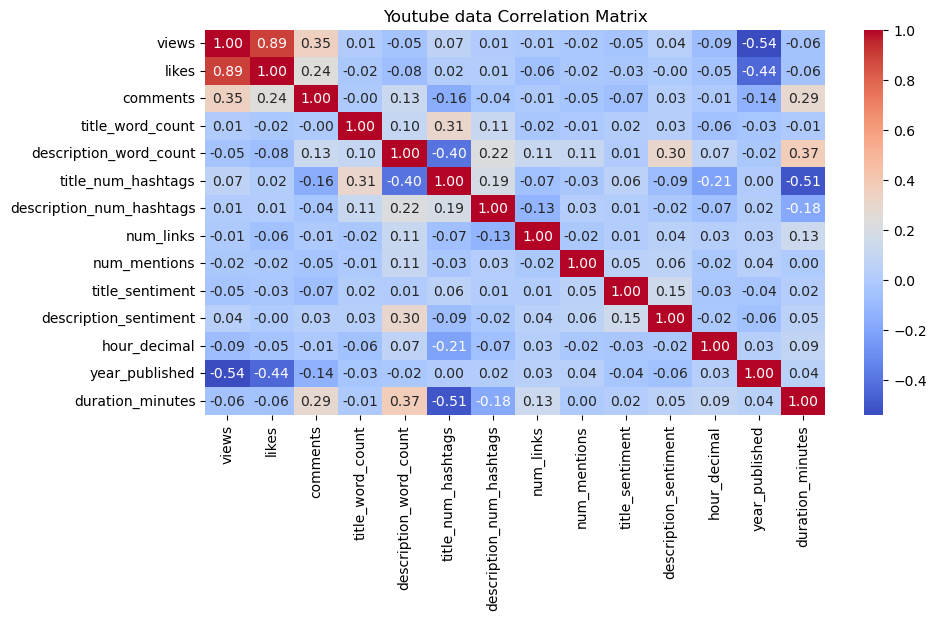

In [13]:
plt.figure(figsize=(10,5))
sns.heatmap(correlation,annot=True,cmap="coolwarm",fmt=".2f")
plt.title("Youtube data Correlation Matrix")
plt.show()

<H4>1.5.2. Detecting Outliers with Boxplot</H4>

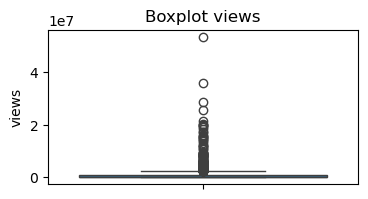

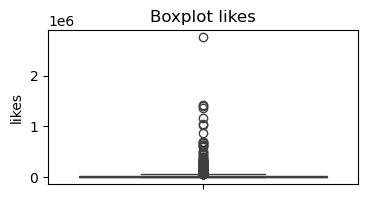

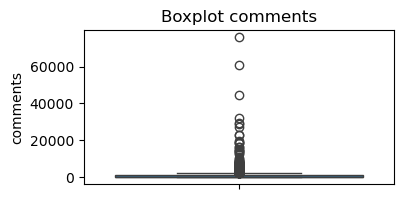

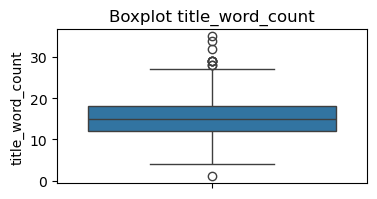

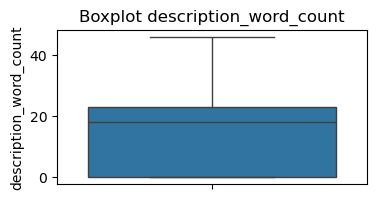

...

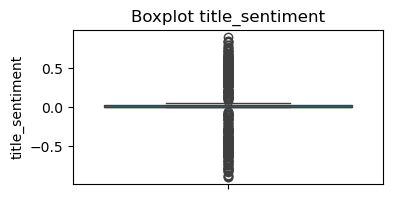

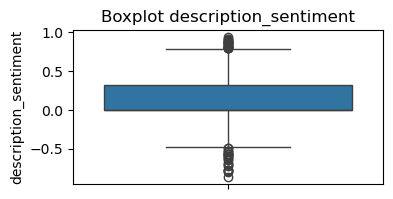

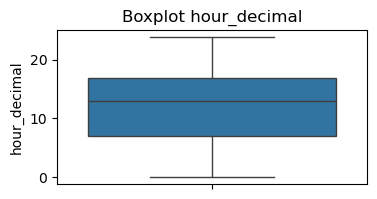

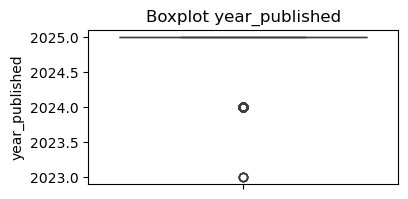

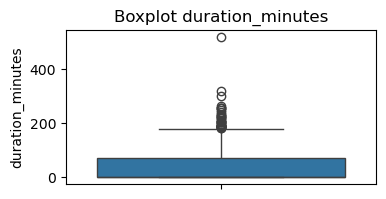

In [15]:
for col in num_cols:
    plt.figure(figsize=(4,2))
    sns.boxplot(df_final[col])
    plt.title(f"Boxplot {col}")
    plt.show()

 <H4>1.5.3. Checking Data Distribution</H4>

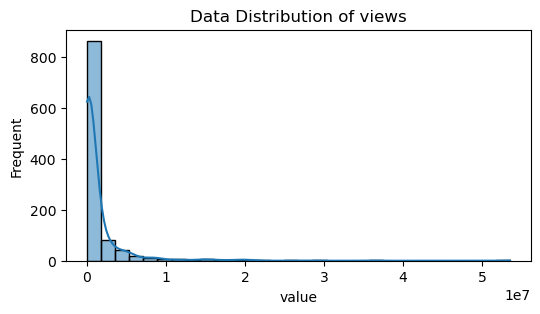

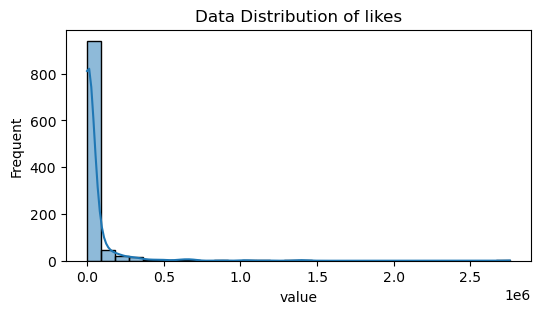

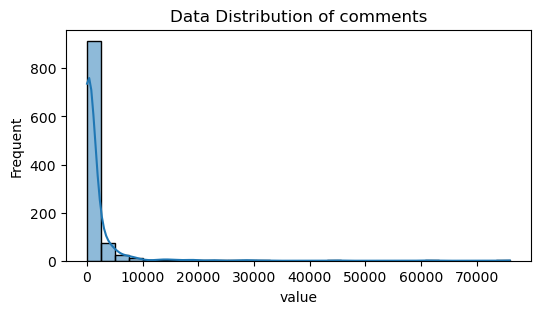

In [17]:
clustering_features = ['views','likes','comments']
for col in clustering_features:
    plt.figure(figsize=(6,3))
    sns.histplot(df_final[col],kde=True,bins=30)
    plt.title(f"Data Distribution of {col}")
    plt.xlabel("value")
    plt.ylabel("Frequent")
    plt.show()

In [19]:
df_scaled = np.log1p(df_final[clustering_features])

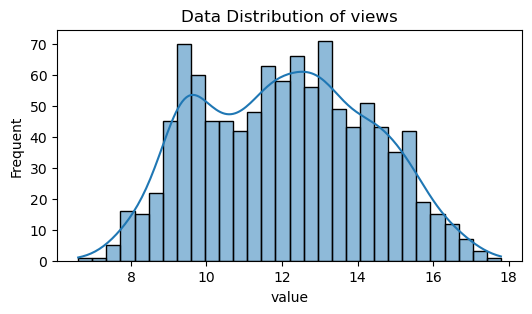

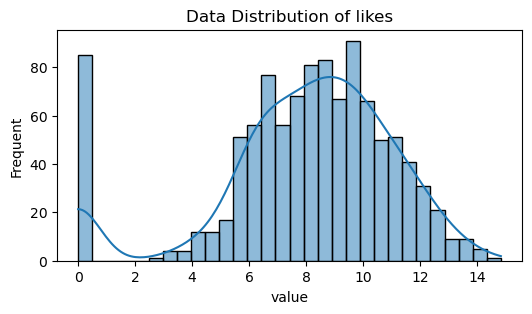

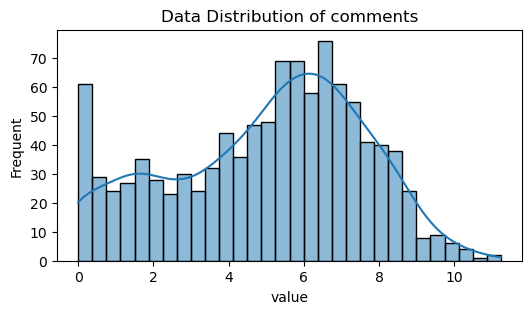

In [21]:
for col in clustering_features:
    plt.figure(figsize=(6,3))
    sns.histplot(df_scaled[col],kde=True,bins=30)
    plt.title(f"Data Distribution of {col}")
    plt.xlabel("value")
    plt.ylabel("Frequent")
    plt.show()

<H4>1.5.4. Shapiro-wilk Test for detecting data distribution</H4>

In [23]:
data = np.array(df_scaled)
for i, col in enumerate(clustering_features):
    stat, p = stats.shapiro(data[0:,i])
    skewness = stats.skew(data[0:,i])
    kurtosis = stats.kurtosis(data[0:,i])
    if p > 0.05:
        print(f"{col} Distribution is Normal\n")
    else:
        print(f"{col} Distribution is not Normal\n")
    print(f"skewness = {skewness} & kurtosis = {kurtosis}\n")

views Distribution is not Normal

skewness = 0.06854919920565335 & kurtosis = -0.8436216695738437

likes Distribution is not Normal

skewness = -0.9867964736084246 & kurtosis = 0.9798562797545927

comments Distribution is not Normal

skewness = -0.33105640994008145 & kurtosis = -0.745784589536651



<H4>1.5.5. Outliers Detection with IQR</H4>
Hence after the log transformation, the data distribution is still not normal. we considered choosing IQR for outlier detection

In [27]:
def detect_outliers(data):
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    IQR = q3-q1
    lower = q1 - (1.5*IQR)
    upper = q3 + (1.5*IQR)
    return data.apply(lambda x: True if x < lower or x > upper else False)

In [29]:
df_final[['views_log','likes_log','comments_log']] = df_scaled

In [31]:
clustering_features_log = ['views_log','likes_log','comments_log']

In [33]:
outliers = df_final[clustering_features_log].apply(detect_outliers)

In [35]:
mask = outliers.any(axis=1)

In [37]:
print(f"outliers percentation : {len([x for x in mask.values if x==True])/len(mask)*100}")

outliers percentation : 8.102955195424213


In [39]:
df_final = df_final[~mask]
df_final.reset_index(drop=True)

,views,likes,comments,category_name,title_has_emoji,title_word_count,description_word_count,title_has_number,description_has_number,title_num_hashtags,...,duration_minutes,title_topic,description_topic,is_clickbait,title_sentiment_label,description_sentiment_label,is_yt_short,views_log,likes_log,comments_log
0,325747,12768,1341,Entertainment,0,23,20,1,0,0,...,58.550000,"['ice fruit', 'tirta fried', 'fruit ice']","['month ramadan', 'ramadan', 'view day']",0,neutral,neutral,0,12.693879,9.454776,7.201916
1,4668907,102736,29096,Entertainment,1,22,12,0,0,0,...,64.950000,"['willie salim', 'claims podcast', 'bobon']","['join uncensored', 'uncensored contents', 'bo...",0,neutral,positive,0,15.356436,11.539928,10.278390
2,274012,12894,1811,Education,0,24,24,1,0,0,...,93.066667,"['quote muslim', 'fm koiyo', 'muslim 26']","['islamic groups', 'chatted muslim', 'muslim m...",0,neutral,neutral,0,12.520931,9.464595,7.502186
3,1198968,19864,5799,People & Blogs,0,15,24,0,0,0,...,53.866667,"['derry kristen', 'kristen christian', 'ustad ...","['derry sulaiman', 'sulaiman coki', 'ustad der...",0,neutral,positive,0,13.996973,9.896715,8.665613
4,167323,4706,925,People & Blogs,0,18,20,0,1,0,...,60.166667,"['horror homecoming', 'night pantura', 'trip l...","['horror mystical', 'horror experiences', 'fri...",0,negative,positive,0,12.027687,8.456806,6.830874
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
959,14823302,632653,1628,People & Blogs,0,13,12,0,0,3,...,0.800000,"['transgender khushi', 'khushi shaikh', 'shaik...",['transgender'],0,neutral,neutral,1,16.511711,13.357679,7.395722
960,588211,13314,779,Sports,0,24,22,1,0,1,...,73.383333,"['toto wolff', 'story lewis', 'lewis hamilton']","['episodes download', 'httpshppodcoapp welcome...",0,positive,positive,0,13.284843,9.496646,6.659294
961,1933229,41056,1183,Entertainment,0,18,25,1,0,1,...,218.700000,"['ltda podcast', 'podcast', 'mystery sérgio']","['astrophysicist chat', 'lenzi astrophysicist'...",0,positive,positive,0,14.474703,10.622717,7.076654
962,54737,1301,146,Entertainment,0,13,23,0,0,0,...,74.783333,"['chhabra podcast', 'aditi sharma', 'chai rela...","['chhabra abraa', 'paras chhabra', 'sharma pod...",0,negative,positive,0,10.910313,7.171657,4.990433


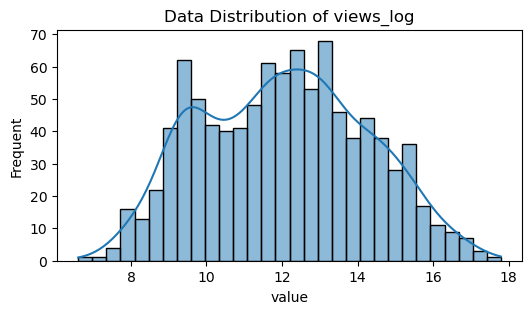

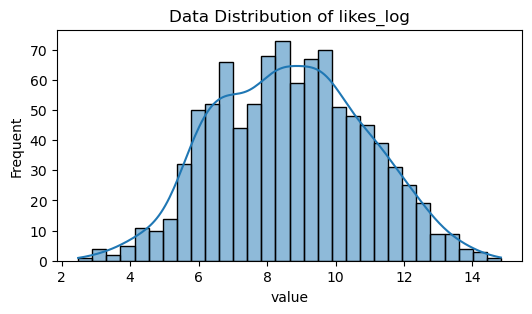

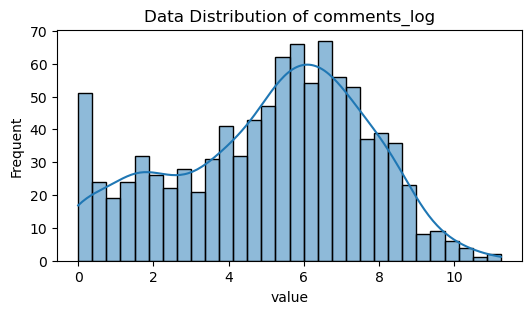

In [41]:
for col in clustering_features_log:
    plt.figure(figsize=(6,3))
    sns.histplot(df_final[col],kde=True,bins=30)
    plt.title(f"Data Distribution of {col}")
    plt.xlabel("value")
    plt.ylabel("Frequent")
    plt.show()

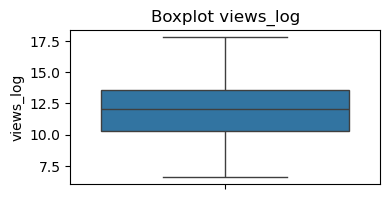

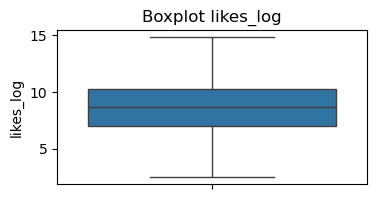

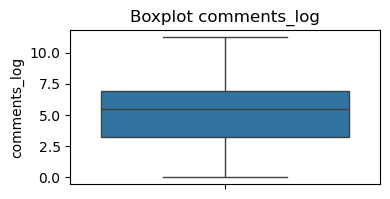

In [43]:
for col in clustering_features_log:
    plt.figure(figsize=(4,2))
    sns.boxplot(df_final[col])
    plt.title(f"Boxplot {col}")
    plt.show()

<H3>1.6. Clustering Approach</H3>

<H4>1.6.1. K-Means Clustering</H4>

<H5>1.6.1.1. Find best K Value with Elbow Method</H4>

In [48]:
X = df_final[clustering_features_log]

wcss = []
K_range = range(1, 15)
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

kl = KneeLocator(K_range, wcss, curve="convex", direction="decreasing")
optimal_k = kl.elbow

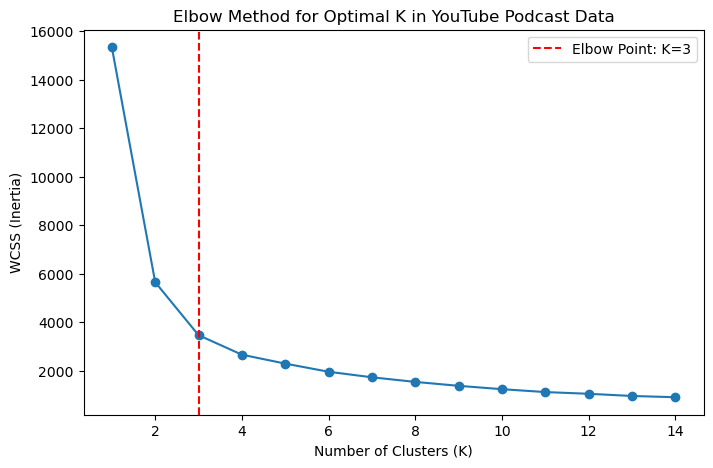

K Optimum Based on Elbow Method: 3


In [50]:
plt.figure(figsize=(8, 5))
plt.plot(K_range, wcss, marker='o', linestyle='-')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("WCSS (Inertia)")
plt.title("Elbow Method for Optimal K in YouTube Podcast Data")
plt.axvline(x=optimal_k, color='r', linestyle='--', label=f"Elbow Point: K={optimal_k}")
plt.legend()
plt.show()

print(f"K Optimum Based on Elbow Method: {optimal_k}")


<H5>1.6.1.2. Implement K value and start clusterization</H4>

In [53]:
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)

df_final['cluster'] = kmeans.fit_predict(X)

<h5>1.6.1.3. Clustering Result Visualization</h4>

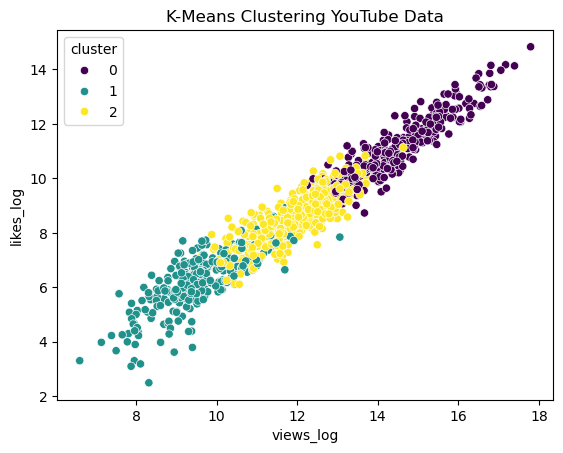

In [56]:
sns.scatterplot(x=X['views_log'], y=X['likes_log'], hue=df_final['cluster'], palette='viridis')
plt.title("K-Means Clustering YouTube Data")
plt.show()


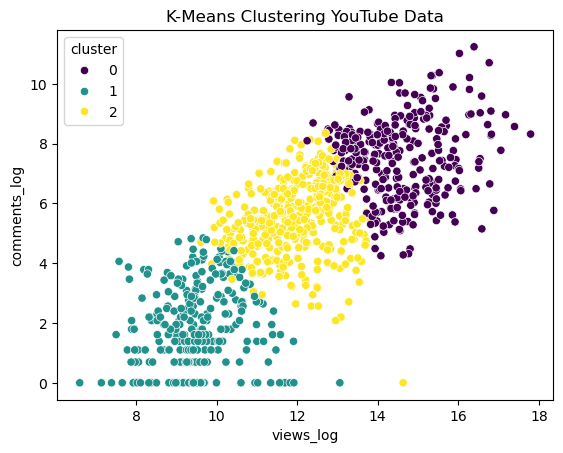

In [58]:
sns.scatterplot(x=X['views_log'], y=X['comments_log'], hue=df_final['cluster'], palette='viridis')
plt.title("K-Means Clustering YouTube Data")
plt.show()


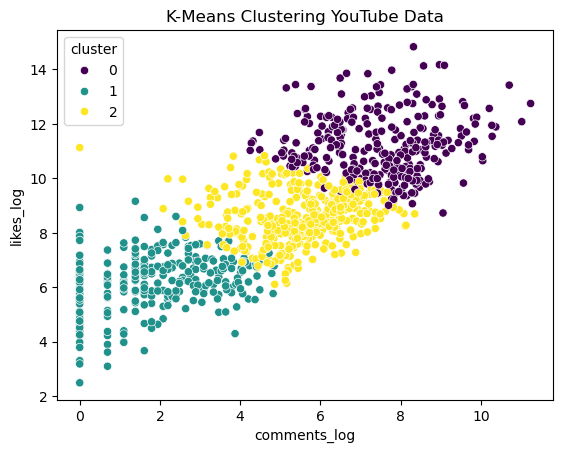

In [60]:
sns.scatterplot(x=X['comments_log'], y=X['likes_log'], hue=df_final['cluster'], palette='viridis')
plt.title("K-Means Clustering YouTube Data")
plt.show()


In [62]:
df_final['cluster'].value_counts()

cluster
2    386
0    295
1    283
Name: count, dtype: int64

<h5>1.6.1.4. Clustering Evaluation (Shilouette, PCA Projection, Box Plot Distribution)</h5>

In [65]:
#shilouette score
sscore = silhouette_score(X, df_final['cluster'])
print(f"Shilouette Score : {sscore}")

Shilouette Score : 0.4334188636569838


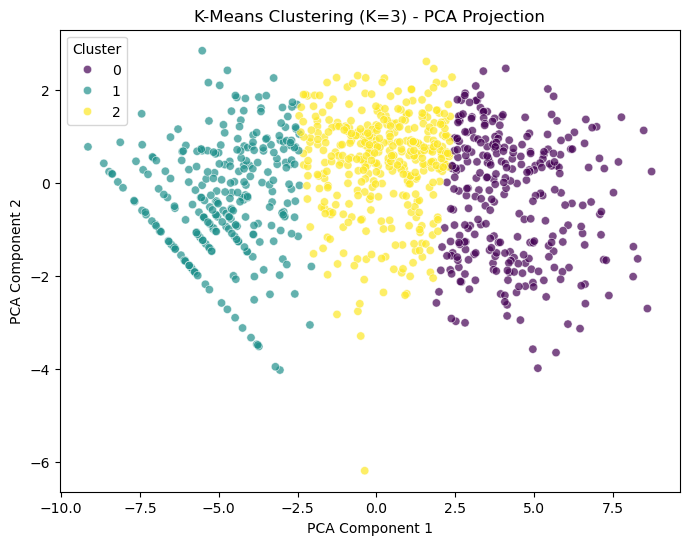

In [67]:
#PCA Projection

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X) 

plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=df_final['cluster'], palette='viridis', alpha=0.7)
plt.title("K-Means Clustering (K=3) - PCA Projection")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend(title="Cluster")
plt.show()


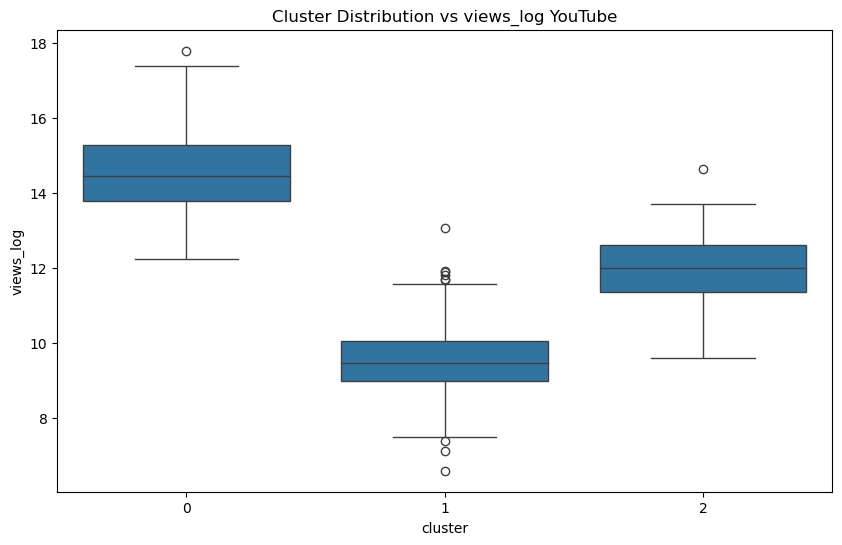

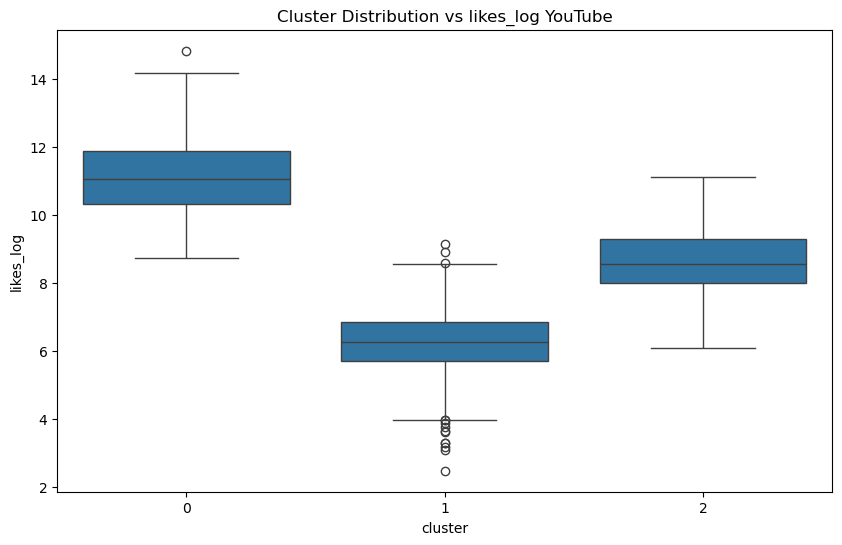

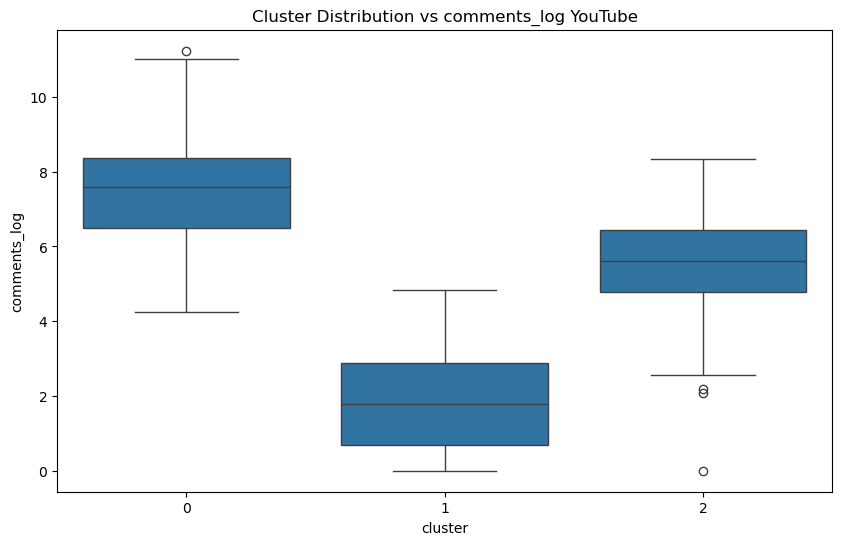

In [240]:
#Boxplot Distribution

for col in clustering_features_log:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=df_final['cluster'], y=df_final[col])
    plt.title("Cluster Distribution vs "+col+" YouTube")
    plt.show()


<H4>1.6.2. Clustering with DBSCAN</H4>

In [213]:
dbscan = DBSCAN(eps=0.5,min_samples=10)
cluster = dbscan.fit_predict(X)

In [215]:
df_final['dbscan_cluster'] = cluster

In [217]:
df_final['dbscan_cluster'].value_counts()

dbscan_cluster
-1    384
 0    337
 1     70
 4     41
 6     40
 7     30
 5     27
 2     18
 3     17
Name: count, dtype: int64

<h5>1.6.2.1. Clustering Evaluation (Shilouette, PCA Projection, Box Plot Distribution)</h5>

In [220]:
df_dbscan =  df_final[df_final['dbscan_cluster']!=-1]
X_dbscan = X[df_final['dbscan_cluster']!=-1]

In [222]:
#Shilouette Score

sscore = silhouette_score(X_dbscan, df_dbscan['dbscan_cluster'])
print(f"Shilouette Score : {sscore}")

Shilouette Score : 0.2188807055825155


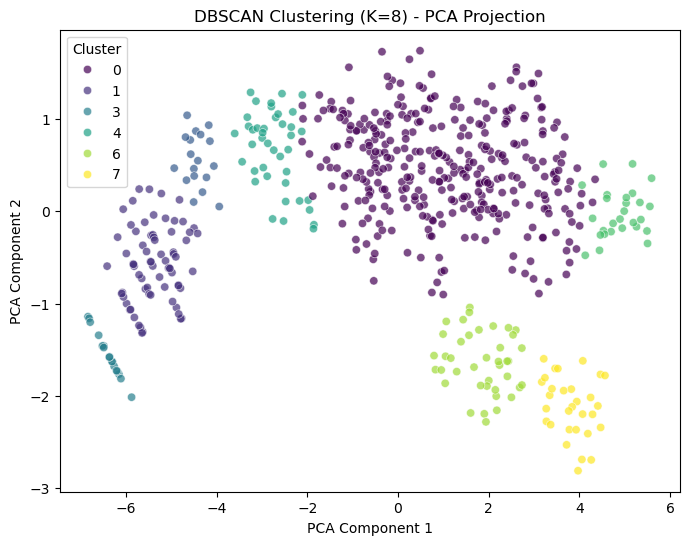

In [224]:
#PCA Projection

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_dbscan) 

plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=df_dbscan['dbscan_cluster'], palette='viridis', alpha=0.7)
plt.title("DBSCAN Clustering (K=8) - PCA Projection")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend(title="Cluster")
plt.show()


In [226]:
yt_stats = df_final.groupby('cluster')[['views', 'likes', 'comments']].mean()
yt_stats

,views,likes,comments
cluster,,,
0,3.826675e+06,148055.952542,4136.552542
1,2.217606e+04,804.865724,14.851590
2,2.304747e+05,8086.538860,474.826425


<H4>1.6.3. Marking each cluster with condition based on quantile</H4>

In [229]:
def categorize_row(row):
    if row['views'] <= q_views[0.25]:
        views_category = "Very Low"
    elif row['views'] <= q_views[0.50]:
        views_category = "Low"
    elif row['views'] <= q_views[0.75]:
        views_category = "Medium"
    else:
        views_category = "High"

    if row['likes'] <= q_likes[0.25]:
        likes_category = "Very Low"
    elif row['likes'] <= q_likes[0.50]:
        likes_category = "Low"
    elif row['likes'] <= q_likes[0.75]:
        likes_category = "Medium"
    else:
        likes_category = "High"

    if row['comments'] <= q_comments[0.25]:
        comments_category = "Very Low"
    elif row['comments'] <= q_comments[0.50]:
        comments_category = "Low"
    elif row['comments'] <= q_comments[0.75]:
        comments_category = "Medium"
    else:
        comments_category = "High"

    return f"{views_category},{likes_category},{comments_category}"


In [231]:
# Hitung quartile untuk tiap kolom
q_views = yt_stats['views'].quantile([0.25, 0.50, 0.75])
q_likes = yt_stats['likes'].quantile([0.25, 0.50, 0.75])
q_comments = yt_stats['comments'].quantile([0.25, 0.50, 0.75])


In [233]:
yt_stats.apply(categorize_row,axis=1)

cluster
0                High,High,High
1    Very Low,Very Low,Very Low
2                   Low,Low,Low
dtype: object

<H5>1.6.3.1. Labeling mark result -> (high: high, high, high), (Medium: Very Low, Very Low, Very Low), (Low: Low, Low, Low)</H5>

In [236]:
df_final['label'] = df_final['cluster'].apply(lambda x: 'High' if x == 0 else 'Medium' if x == 2  else 'Low')

In [238]:
df_final.drop(columns=['dbscan_cluster'],inplace=True)

In [240]:
df_final.reset_index(drop=True)

,views,likes,comments,category_name,title_has_emoji,title_word_count,description_word_count,title_has_number,description_has_number,title_num_hashtags,...,is_clickbait,title_sentiment_label,description_sentiment_label,is_yt_short,views_log,likes_log,comments_log,cluster,label,time_periods
0,325747,12768,1341,Entertainment,0,23,20,1,0,0,...,0,neutral,neutral,0,12.693879,9.454776,7.201916,2,Medium,afternoon
1,4668907,102736,29096,Entertainment,1,22,12,0,0,0,...,0,neutral,positive,0,15.356436,11.539928,10.278390,0,High,late night
2,274012,12894,1811,Education,0,24,24,1,0,0,...,0,neutral,neutral,0,12.520931,9.464595,7.502186,2,Medium,morning
3,1198968,19864,5799,People & Blogs,0,15,24,0,0,0,...,0,neutral,positive,0,13.996973,9.896715,8.665613,0,High,afternoon
4,167323,4706,925,People & Blogs,0,18,20,0,1,0,...,0,negative,positive,0,12.027687,8.456806,6.830874,2,Medium,afternoon
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
959,14823302,632653,1628,People & Blogs,0,13,12,0,0,3,...,0,neutral,neutral,1,16.511711,13.357679,7.395722,0,High,afternoon
960,588211,13314,779,Sports,0,24,22,1,0,1,...,0,positive,positive,0,13.284843,9.496646,6.659294,2,Medium,morning
961,1933229,41056,1183,Entertainment,0,18,25,1,0,1,...,0,positive,positive,0,14.474703,10.622717,7.076654,0,High,late night
962,54737,1301,146,Entertainment,0,13,23,0,0,0,...,0,negative,positive,0,10.910313,7.171657,4.990433,2,Medium,afternoon


<H3>1.7. Data Visualization</H3>

<h4>1.7.1. Data Correlation</h4>

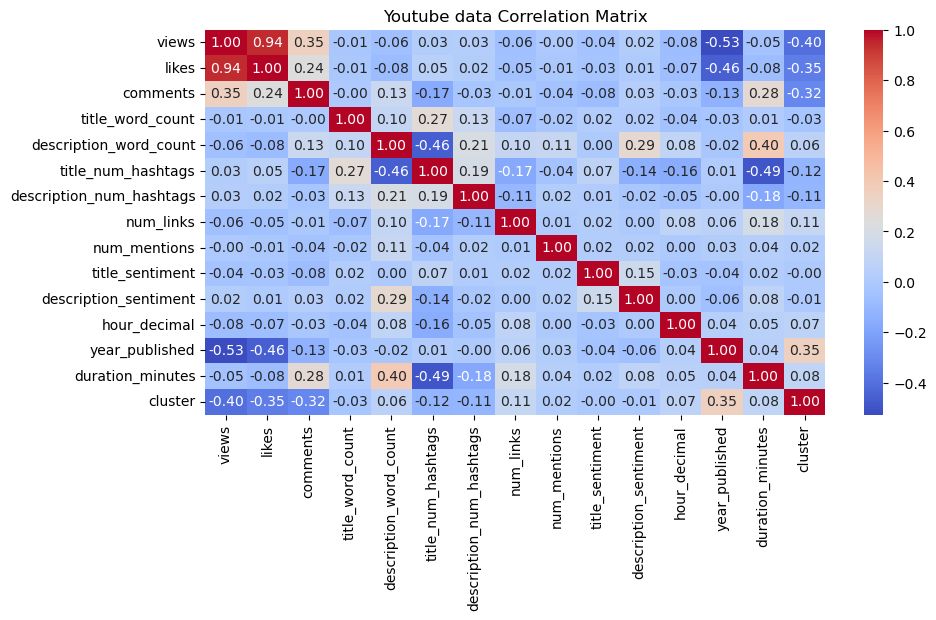

In [244]:
correlation = df_final[num_cols+['cluster']].corr()
plt.figure(figsize=(10,5))
sns.heatmap(correlation,annot=True,cmap="coolwarm",fmt=".2f")
plt.title("Youtube data Correlation Matrix")
plt.show()

<H4>1.7.2. Frequent Of Categories Data</H4>

In [247]:
all_cols = df_final.columns
cat_cols = [x for x in all_cols if x not in num_cols+['views_log',
 'likes_log',
 'comments_log',
 'cluster',
 'label','title_eng','description_eng','title_topic','description_topic']]

In [249]:
cat_cols

['category_name',
 'title_has_emoji',
 'title_has_number',
 'description_has_number',
 'has_CTA',
 'CTA_Types',
 'day_of_week',
 'is_clickbait',
 'title_sentiment_label',
 'description_sentiment_label',
 'is_yt_short',
 'time_periods']

<h5>1.7.2.1. Visualization With Countplot</h5>

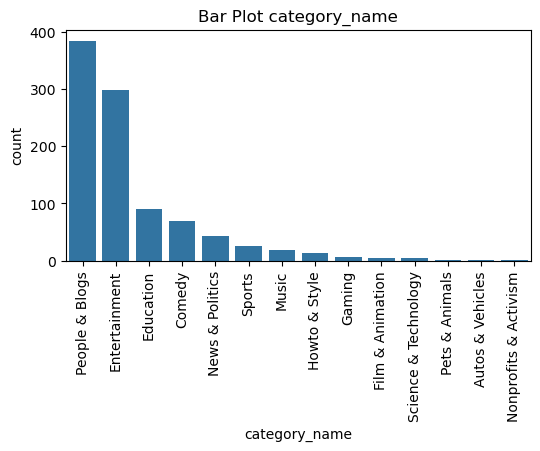

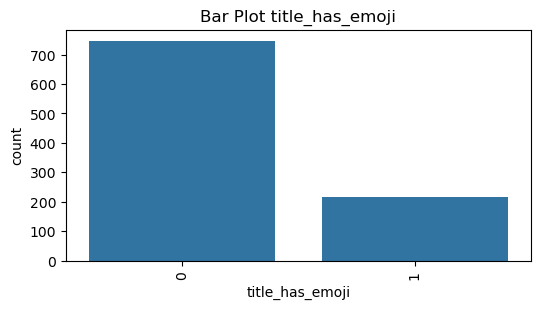

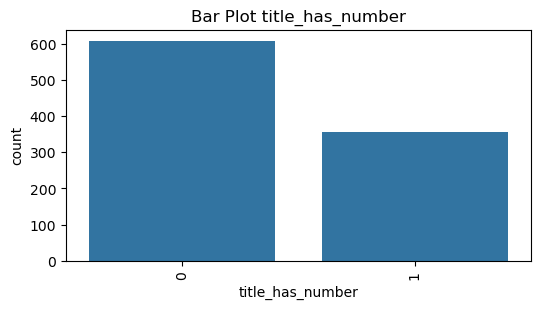

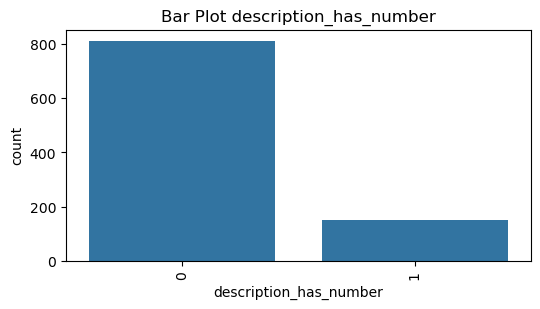

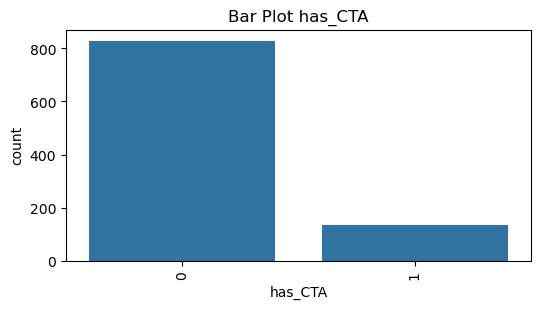

...

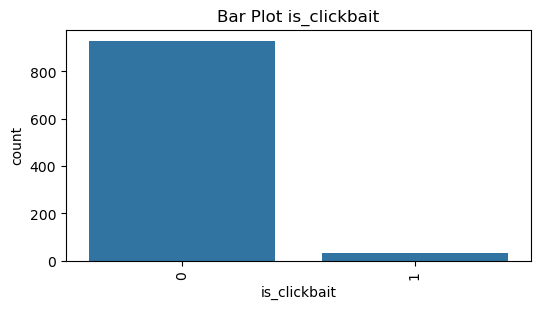

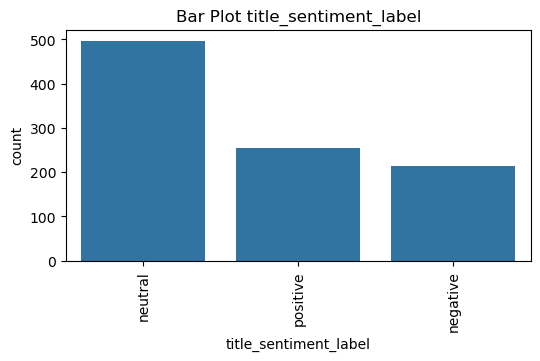

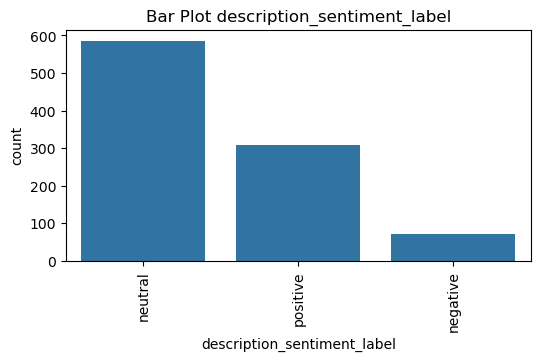

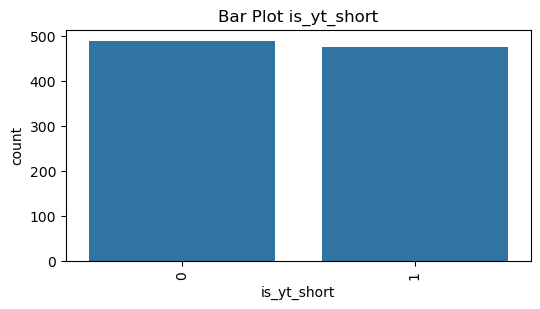

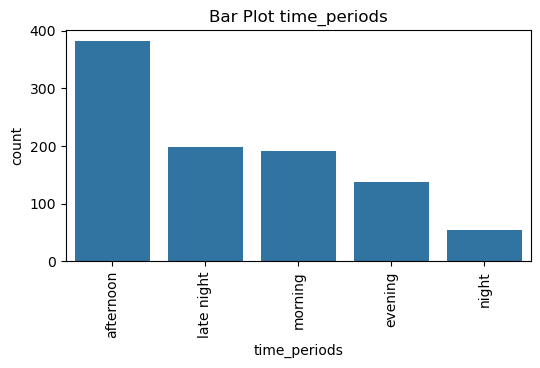

In [252]:
for col in cat_cols:
    plt.figure(figsize=(6,3))
    sns.countplot(data=df_final,x=col,order=df_final[col].value_counts().index)
    plt.xticks(rotation=90)
    plt.title(f"Bar Plot {col}")
    plt.show()

<h5>1.7.2.2. Visualization With Pie Chart</h5>

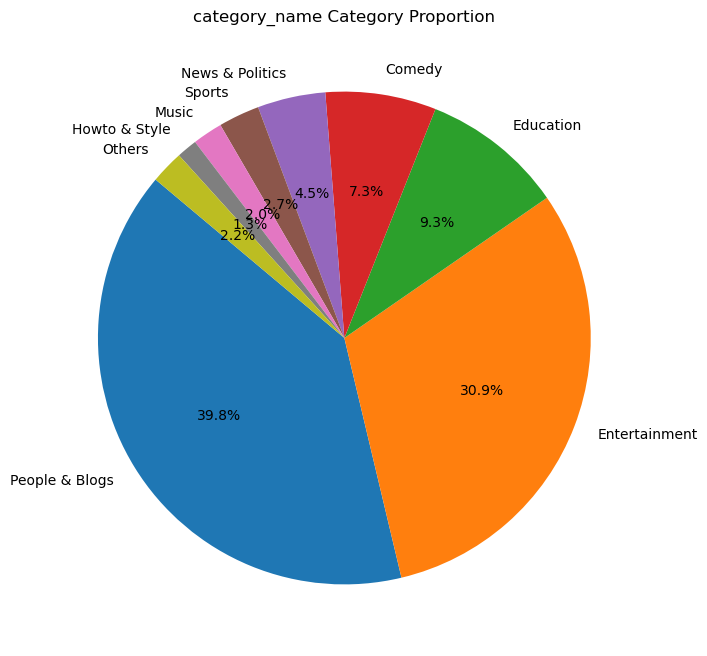

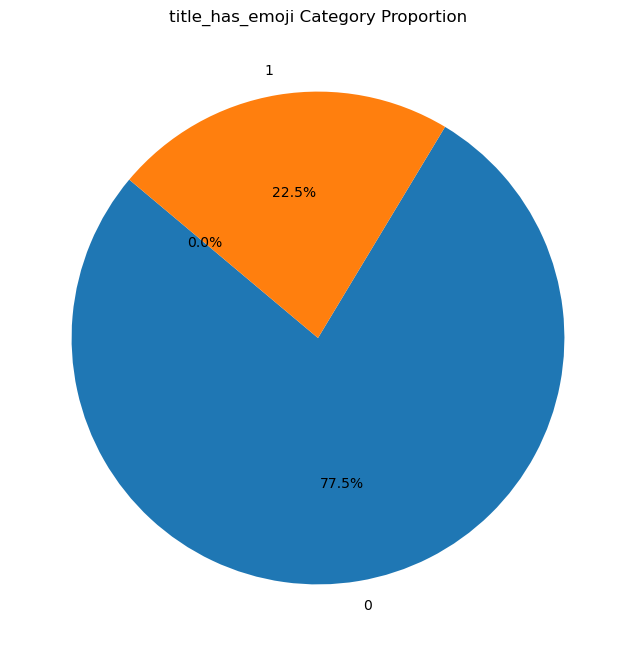

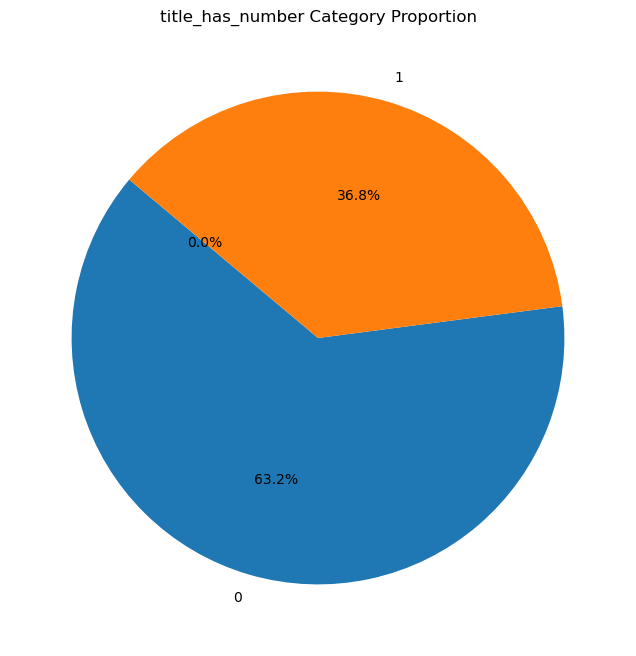

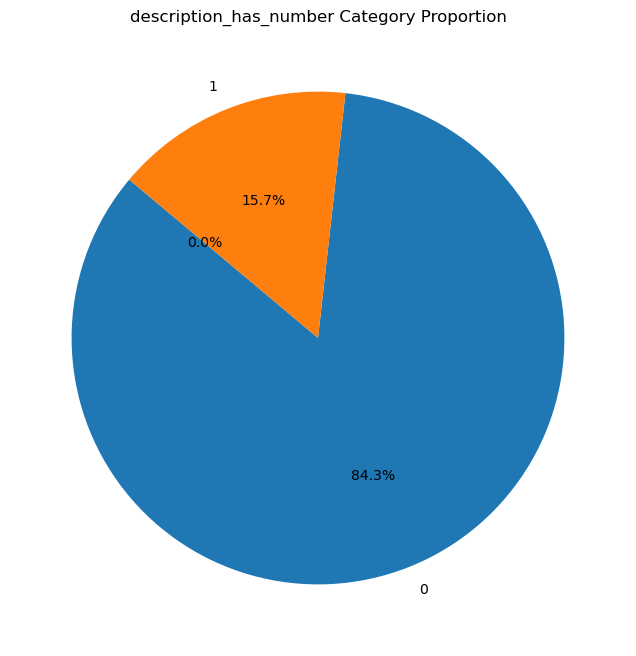

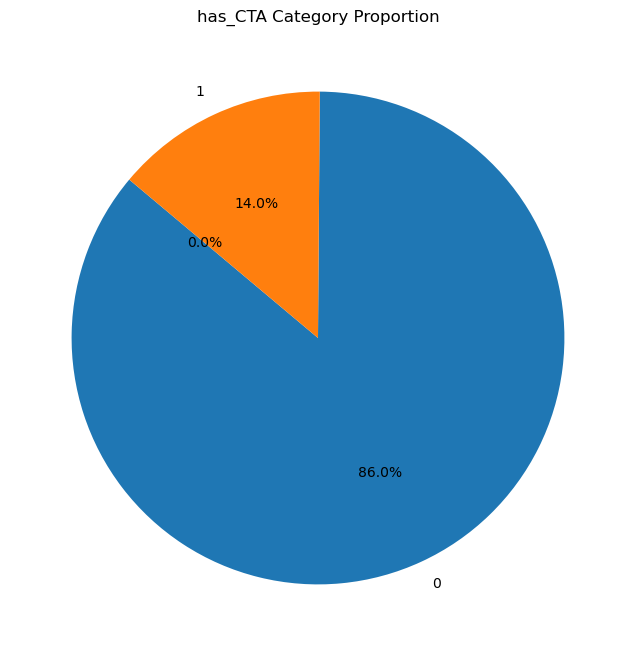

...

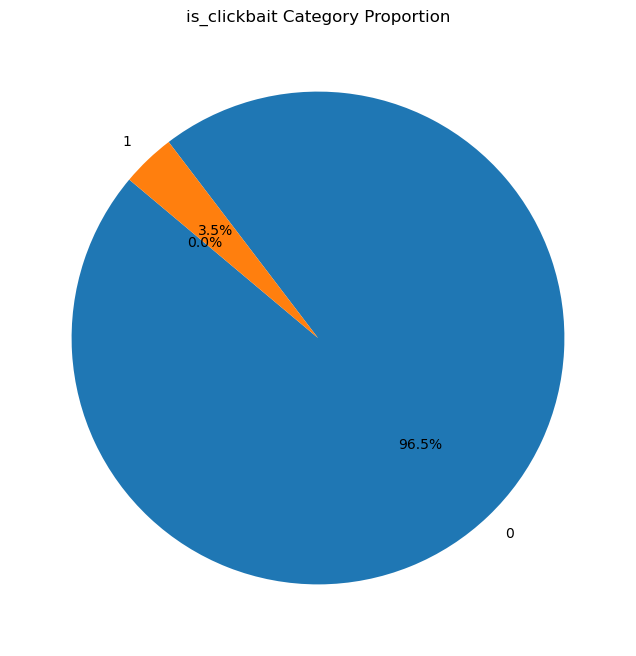

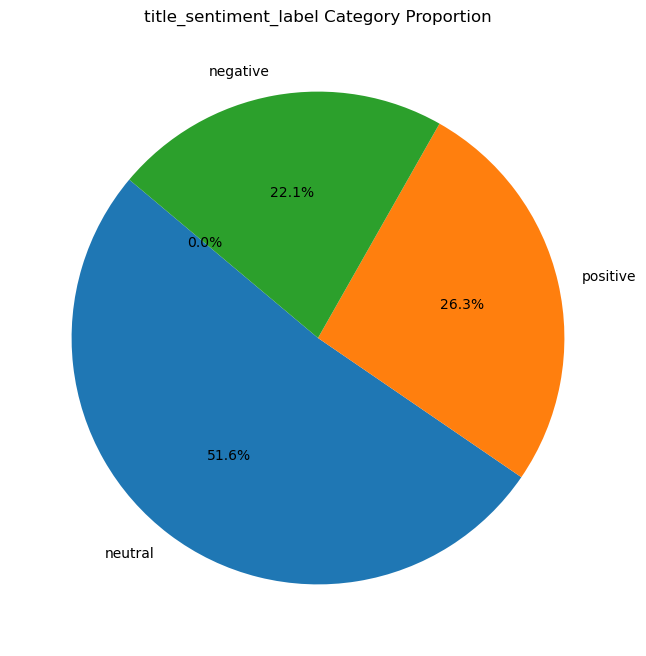

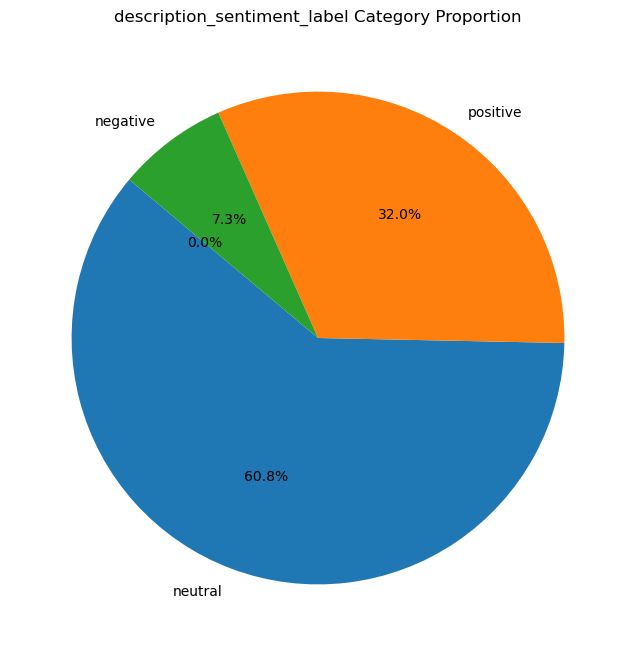

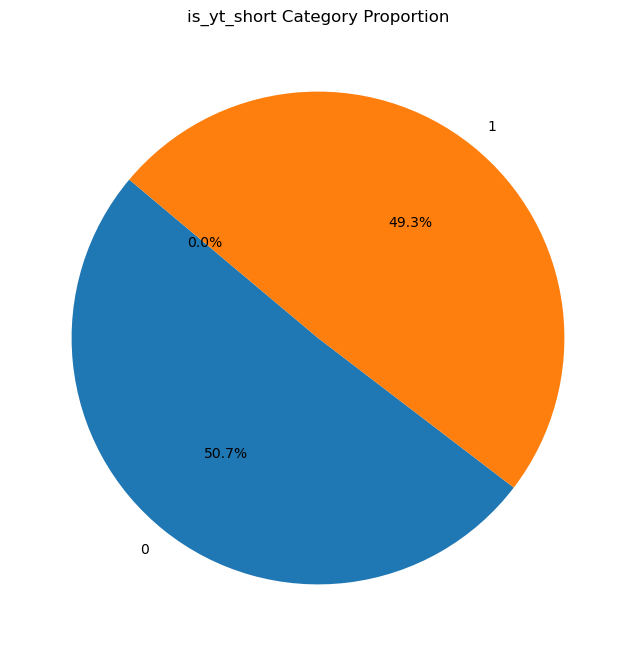

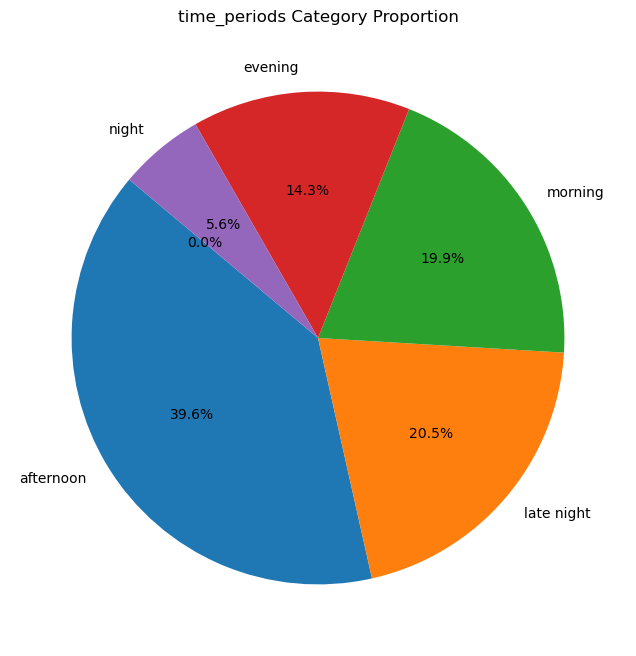

In [254]:
for col in cat_cols:
    category_counts = df_final[col].value_counts()
    top_categories = category_counts[category_counts >= 10]
    other_count = category_counts[category_counts < 10].sum()
    
    final_counts = pd.concat((top_categories,pd.Series({'Others': other_count})))
    
    plt.figure(figsize=(8, 8))
    final_counts.plot(kind='pie', autopct='%1.1f%%', startangle=140)
    plt.title(f"{col} Category Proportion")
    plt.ylabel("")
    plt.show()


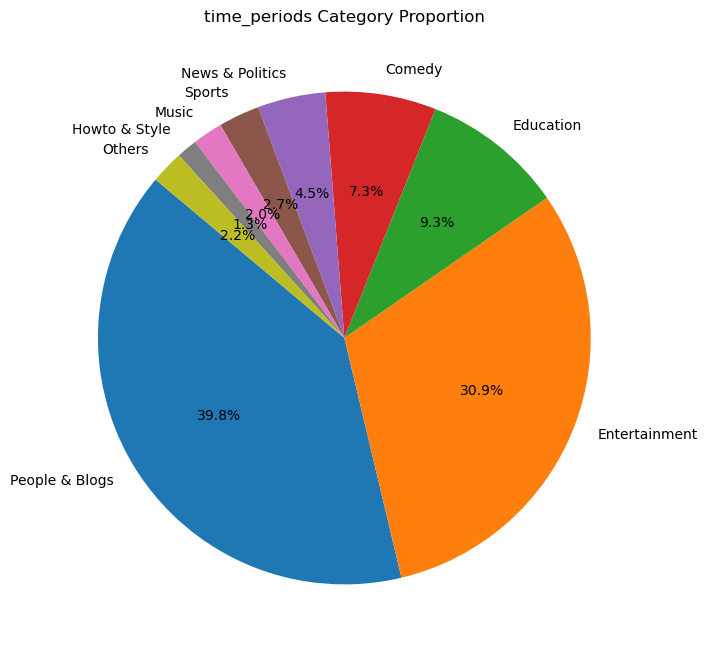

In [255]:
category_counts = df_final['category_name'].value_counts()
top_categories = category_counts[category_counts >= 10]
other_count = category_counts[category_counts < 10].sum()
    
final_counts = pd.concat((top_categories,pd.Series({'Others': other_count})))
    
plt.figure(figsize=(8, 8))
final_counts.plot(kind='pie', autopct='%1.1f%%', startangle=140)
plt.title(f"{col} Category Proportion")
plt.ylabel("")
plt.show()


<H5>Lets labeling each published our become time periods</H5>
00:00 - 05:59	Late Night

06:00 - 11:59	Morning

12:00 - 17:59	Afternoon

18:00 - 21:59	Evening

22:00 - 23:59	Night


In [257]:
df_final['time_periods'] = df_final['hour_decimal'].apply(lambda x: 'late night' if x >= 0 and x <= 5.99 else 'morning' if x >= 6 and x <=11.99 else 'afternoon' if x >= 12 and x <= 17.99 else 'evening' if x >= 18 and x <= 21.99 else 'night' )

<H4>1.7.3. Seeking any patterns or insight in Days and Time Periods data for the better video published strategy</H4>

<H5>1.7.3.1. Categorical Features Visualization</H5>

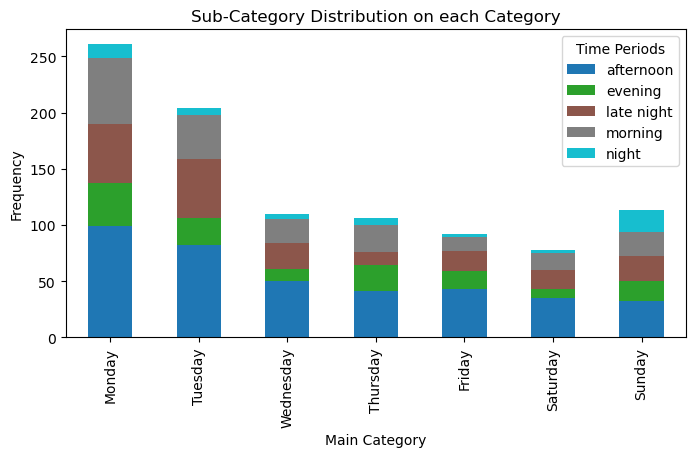

In [261]:
order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

crosstab = pd.crosstab(df_final['day_of_week'], df_final['time_periods'])

crosstab = crosstab.reindex(order)

crosstab.plot(kind='bar', stacked=True, figsize=(8, 4), colormap='tab10')
plt.title("Sub-Category Distribution on each Category")
plt.xlabel("Main Category")
plt.ylabel("Frequency")
plt.legend(title="Time Periods")
plt.show()


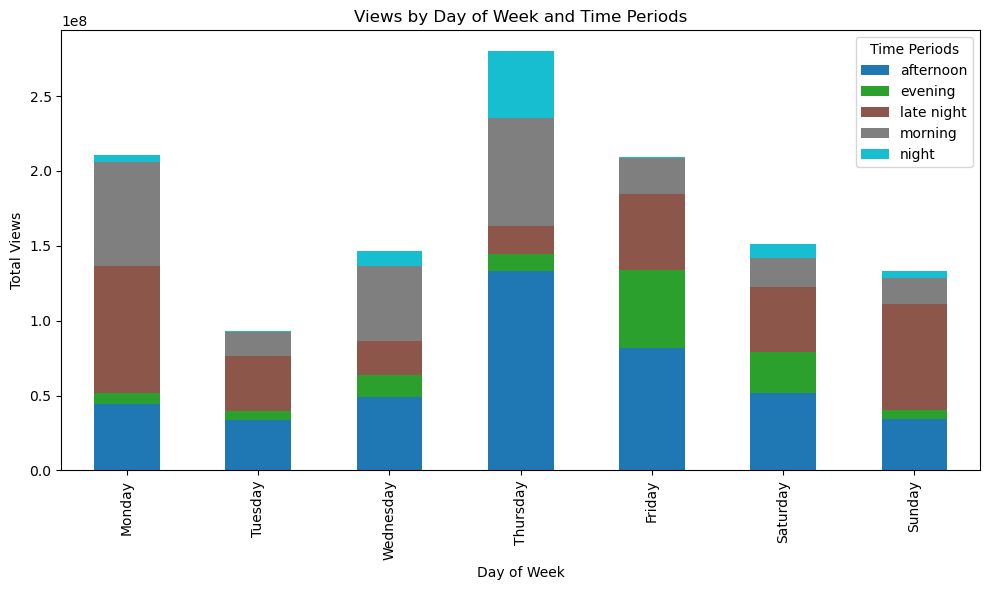

In [262]:
views_grouped = df_final.groupby(['day_of_week', 'time_periods'])['views'].sum().unstack().fillna(0)
views_grouped = views_grouped.reindex(order)
views_grouped.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='tab10')
plt.title("Views by Day of Week and Time Periods")
plt.xlabel("Day of Week")
plt.ylabel("Total Views")
plt.legend(title="Time Periods")
plt.tight_layout()
plt.show()


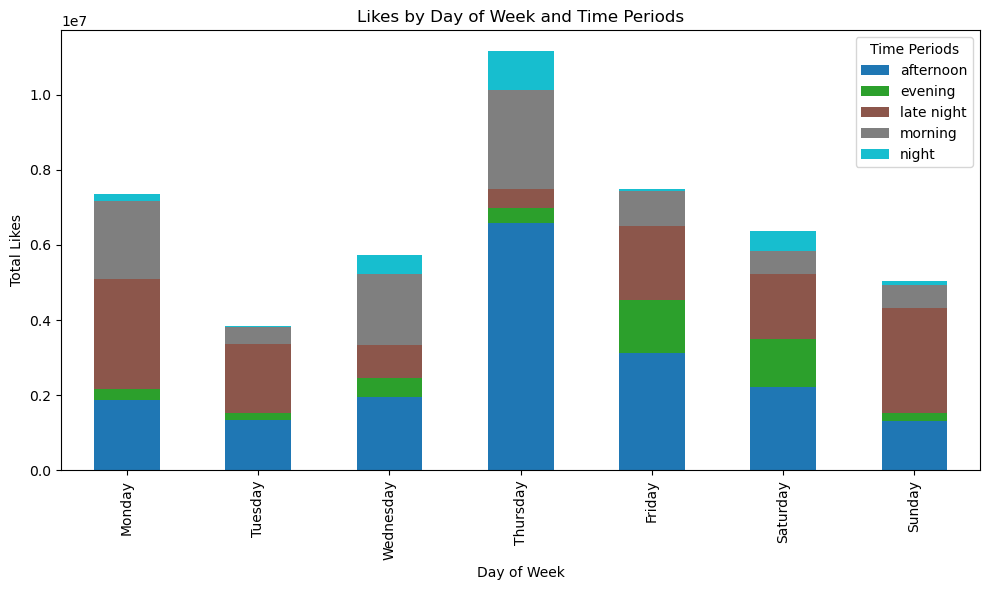

In [263]:
views_grouped = df_final.groupby(['day_of_week', 'time_periods'])['likes'].sum().unstack().fillna(0)
views_grouped = views_grouped.reindex(order)
views_grouped.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='tab10')
plt.title("Likes by Day of Week and Time Periods")
plt.xlabel("Day of Week")
plt.ylabel("Total Likes")
plt.legend(title="Time Periods")
plt.tight_layout()
plt.show()


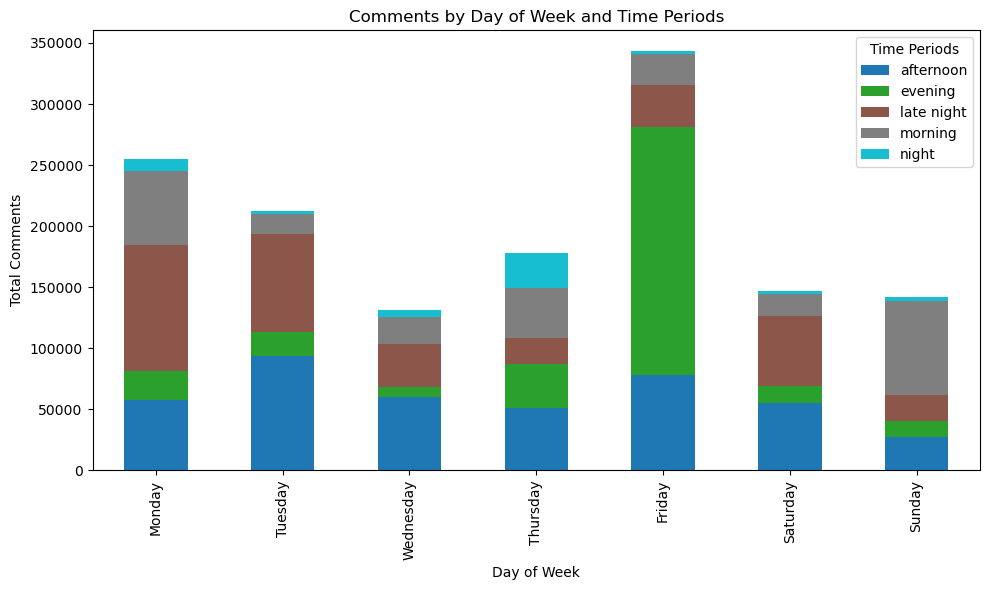

In [264]:
views_grouped = df_final.groupby(['day_of_week', 'time_periods'])['comments'].sum().unstack().fillna(0)
views_grouped = views_grouped.reindex(order)
views_grouped.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='tab10')
plt.title("Comments by Day of Week and Time Periods")
plt.xlabel("Day of Week")
plt.ylabel("Total Comments")
plt.legend(title="Time Periods")
plt.tight_layout()
plt.show()

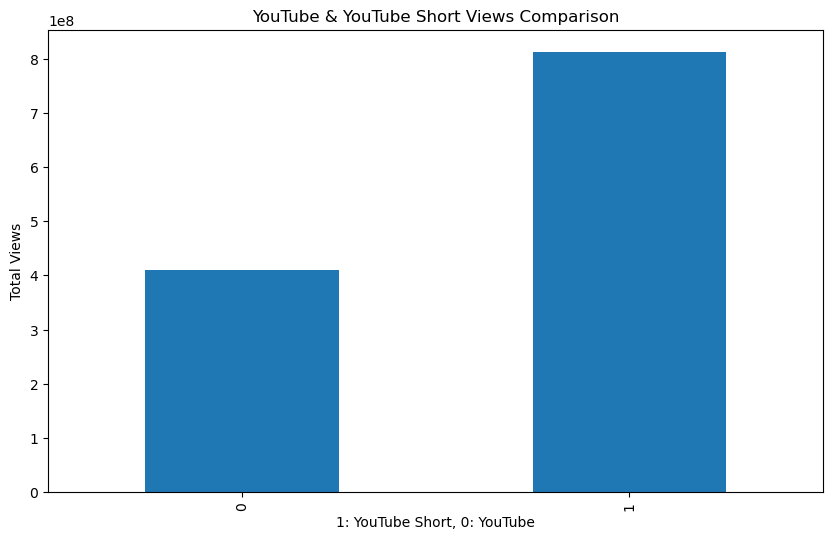

In [265]:
views_grouped = df_final.groupby(['is_yt_short'])['views'].sum()
views_grouped.plot(kind='bar', figsize=(10, 6), colormap='tab10')
plt.title("YouTube & YouTube Short Views Comparison")
plt.xlabel("1: YouTube Short, 0: YouTube")
plt.ylabel("Total Views")
plt.show()

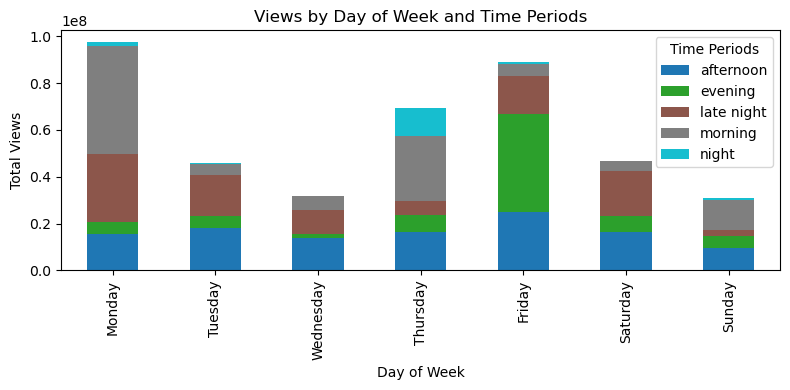

In [266]:
views_grouped = df_final[df_final['is_yt_short']==0].groupby(['day_of_week', 'time_periods'])['views'].sum().unstack().fillna(0)
views_grouped = views_grouped.reindex(order)
views_grouped.plot(kind='bar', stacked=True, figsize=(8, 4), colormap='tab10')
plt.title("Views by Day of Week and Time Periods")
plt.xlabel("Day of Week")
plt.ylabel("Total Views")
plt.legend(title="Time Periods")
plt.tight_layout()
plt.show()


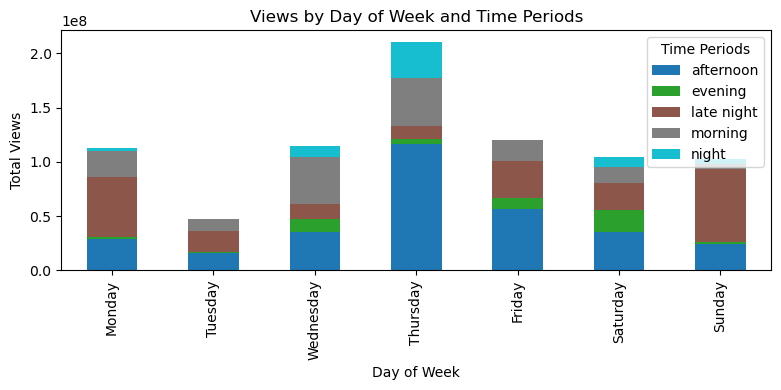

In [267]:
views_grouped = df_final[df_final['is_yt_short']==1].groupby(['day_of_week', 'time_periods'])['views'].sum().unstack().fillna(0)
views_grouped = views_grouped.reindex(order)
views_grouped.plot(kind='bar', stacked=True, figsize=(8, 4), colormap='tab10')
plt.title("Views by Day of Week and Time Periods")
plt.xlabel("Day of Week")
plt.ylabel("Total Views")
plt.legend(title="Time Periods")
plt.tight_layout()
plt.show()


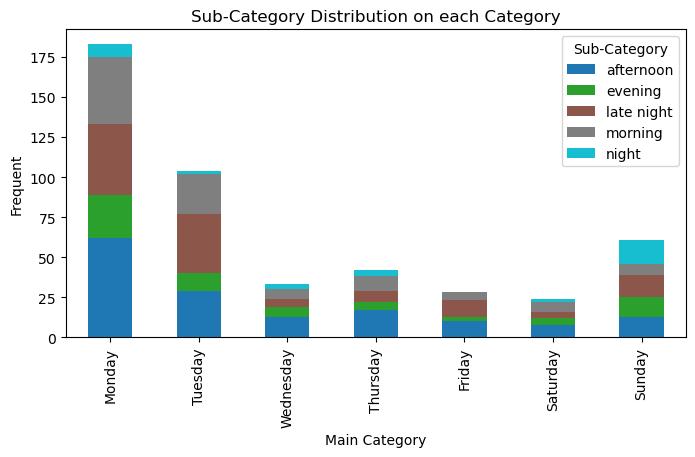

In [269]:
yt_short_grouped = df_final[df_final['is_yt_short']==1]
crosstab = pd.crosstab(yt_short_grouped['day_of_week'], yt_short_grouped['time_periods'])
crosstab = crosstab.reindex(order).plot(kind='bar', stacked=True, figsize=(8, 4),colormap='tab10')
plt.title("Sub-Category Distribution on each Category")
plt.xlabel("Main Category")
plt.ylabel("Frequent")
plt.legend(title="Sub-Category")
plt.show()


In [272]:
df_final[df_final['views']==df_final['views'].max()].unstack()

views                        815                                             53502248
likes                        815                                              2756323
comments                     815                                                 4095
category_name                815                                       People & Blogs
title_has_emoji              815                                                    1
title_word_count             815                                                   16
description_word_count       815                                                    0
title_has_number             815                                                    0
description_has_number       815                                                    0
title_num_hashtags           815                                                    5
description_num_hashtags     815                                                    0
num_links                    815                      

In [273]:
df_final['views'][df_final['views']!=df_final['views'].max()].max()

35857348

a significant number of views makes us confused, is that fair to analyze best days for publishing a video. so we can rely on label from clusterization

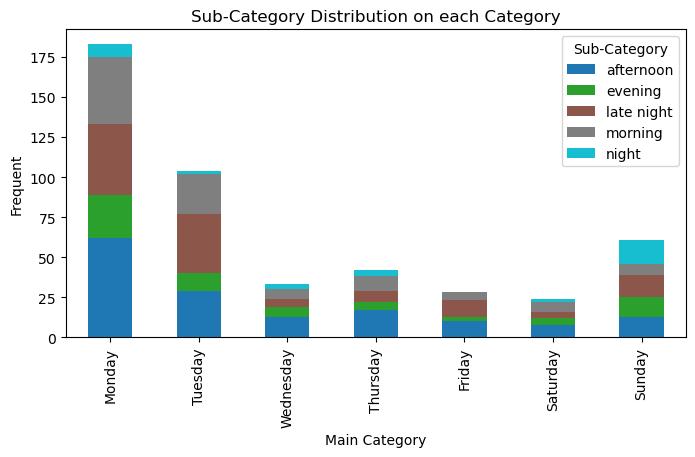

In [277]:
yt_short_grouped = df_final[df_final['is_yt_short']==1]
crosstab = pd.crosstab(yt_short_grouped['day_of_week'], yt_short_grouped['time_periods'])
crosstab = crosstab.reindex(order).plot(kind='bar', stacked=True, figsize=(8, 4),colormap='tab10')
plt.title("Sub-Category Distribution on each Category")
plt.xlabel("Main Category")
plt.ylabel("Frequent")
plt.legend(title="Sub-Category")
plt.show()


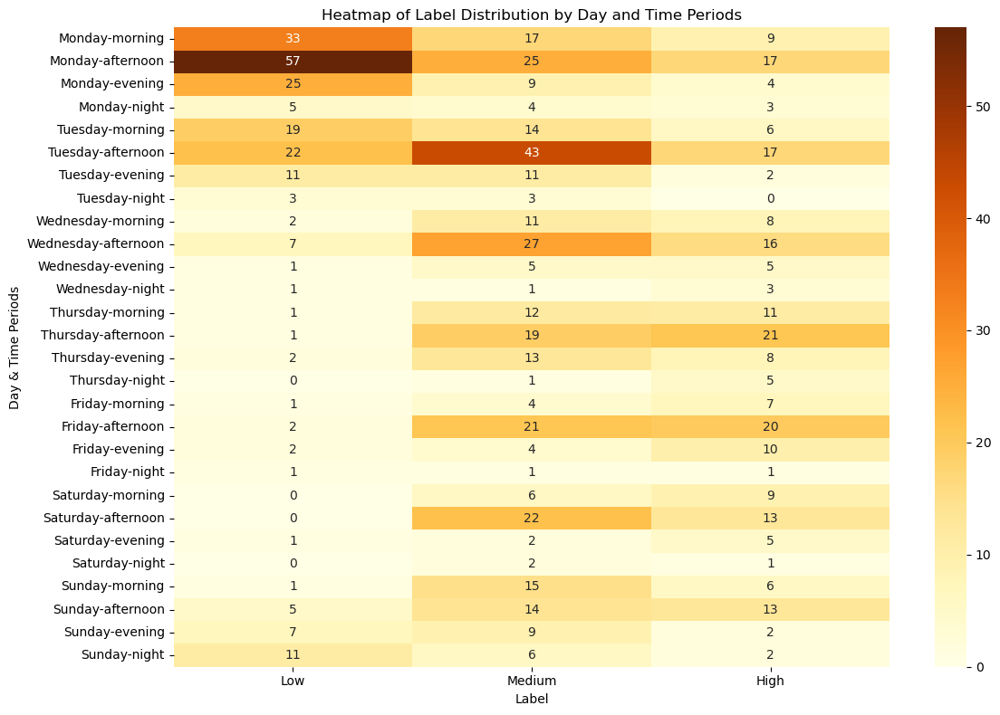

In [279]:
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
time_order = ['morning', 'afternoon', 'evening', 'night']

import itertools
multi_index = pd.MultiIndex.from_tuples(
    list(itertools.product(day_order, time_order)),
    names=['day_of_week', 'time_periods']
)

heatmap_data = pd.crosstab([df_final['day_of_week'], df_final['time_periods']], df_final['label'])

heatmap_data = heatmap_data.reindex(index=multi_index, columns=['Low', 'Medium', 'High']).fillna(0)

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, annot=True, fmt='g', cmap="YlOrBr")
plt.title("Heatmap of Label Distribution by Day and Time Periods")
plt.xlabel("Label")
plt.ylabel("Day & Time Periods")
plt.tight_layout()
plt.show()


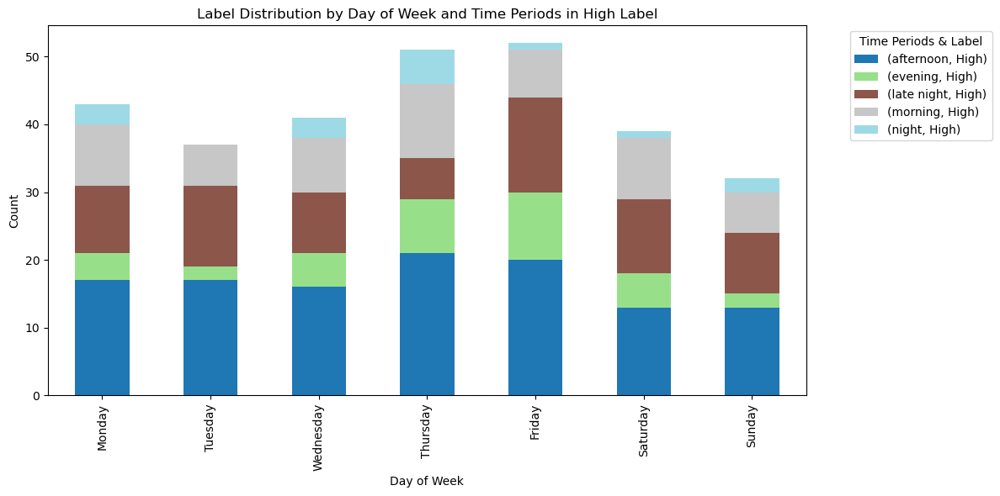

In [281]:
high_label = df_final[df_final['label']=='High']
crosstab = pd.crosstab(index=high_label['day_of_week'], 
                       columns=[high_label['time_periods'], high_label['label']])

crosstab = crosstab.reindex(order)
crosstab.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='tab20')
plt.title("Label Distribution by Day of Week and Time Periods in High Label")
plt.xlabel("Day of Week")
plt.ylabel("Count")
plt.legend(title="Time Periods & Label", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


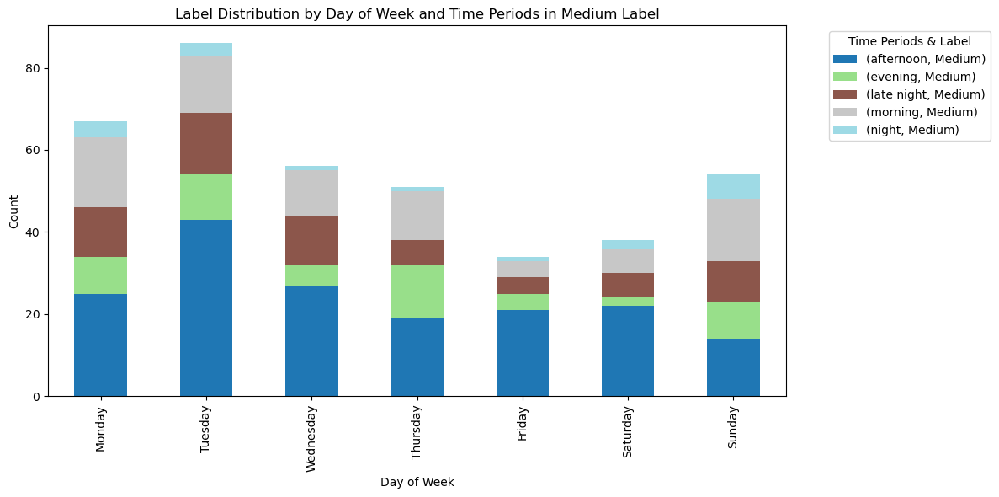

In [283]:
high_label = df_final[df_final['label']=='Medium']
crosstab = pd.crosstab(index=high_label['day_of_week'], 
                       columns=[high_label['time_periods'], high_label['label']])

crosstab = crosstab.reindex(order)
crosstab.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='tab20')
plt.title("Label Distribution by Day of Week and Time Periods in Medium Label")
plt.xlabel("Day of Week")
plt.ylabel("Count")
plt.legend(title="Time Periods & Label", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


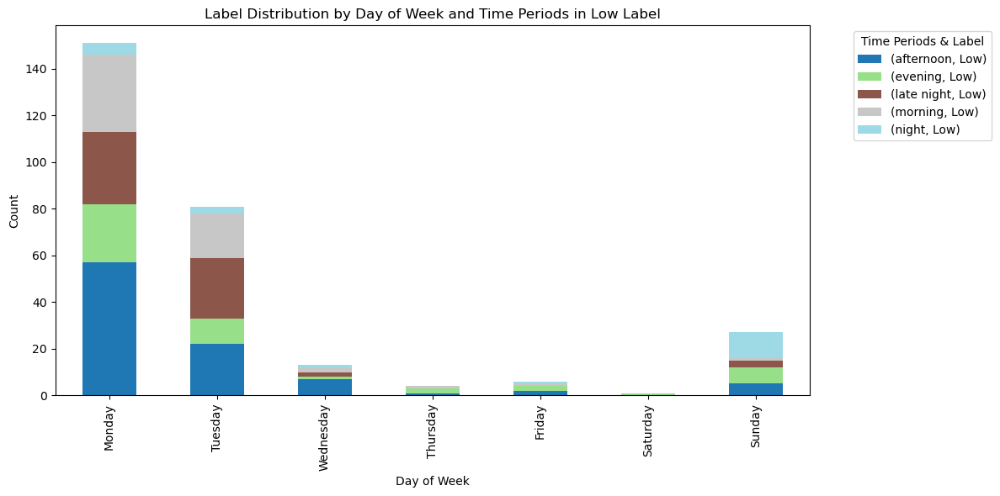

In [285]:
high_label = df_final[df_final['label']=='Low']
crosstab = pd.crosstab(index=high_label['day_of_week'], 
                       columns=[high_label['time_periods'], high_label['label']])

crosstab = crosstab.reindex(order)
crosstab.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='tab20')
plt.title("Label Distribution by Day of Week and Time Periods in Low Label")
plt.xlabel("Day of Week")
plt.ylabel("Count")
plt.legend(title="Time Periods & Label", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


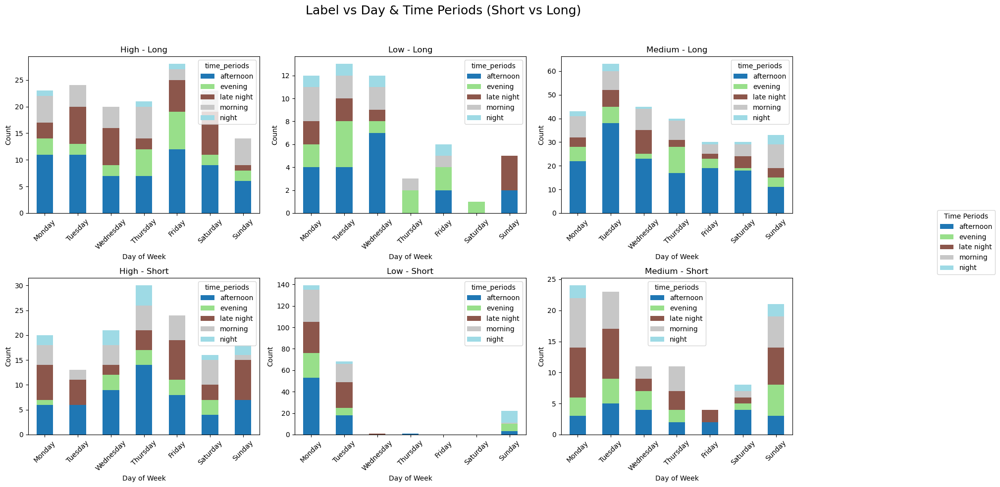

In [287]:
labels = sorted(df_final['label'].unique())
yt_types = sorted(df_final['is_yt_short'].unique())
n_rows = len(yt_types)
n_cols = len(labels)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 5*n_rows))
axes = axes.flatten()

order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

for r, types in enumerate(yt_types):  
    for c, label in enumerate(labels):  
        ax_index = r * n_cols + c
        df_subset = df_final[(df_final['label'] == label) & (df_final['is_yt_short'] == types)]
        
        crosstab = pd.crosstab(index=df_subset['day_of_week'], 
                               columns=df_subset['time_periods']).reindex(order)

        crosstab.plot(kind='bar', stacked=True, ax=axes[ax_index], colormap='tab20')
        axes[ax_index].set_title(f"{label} - {'Short' if types==1 else 'Long'}")
        axes[ax_index].set_xlabel("Day of Week")
        axes[ax_index].set_ylabel("Count")
        axes[ax_index].tick_params(axis='x', rotation=45)


handles, legend_labels = axes[0].get_legend_handles_labels()
fig.legend(handles, legend_labels, title="Time Periods", bbox_to_anchor=(1.05, 0.5), loc='center left')

plt.suptitle("Label vs Day & Time Periods (Short vs Long)", fontsize=18)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()


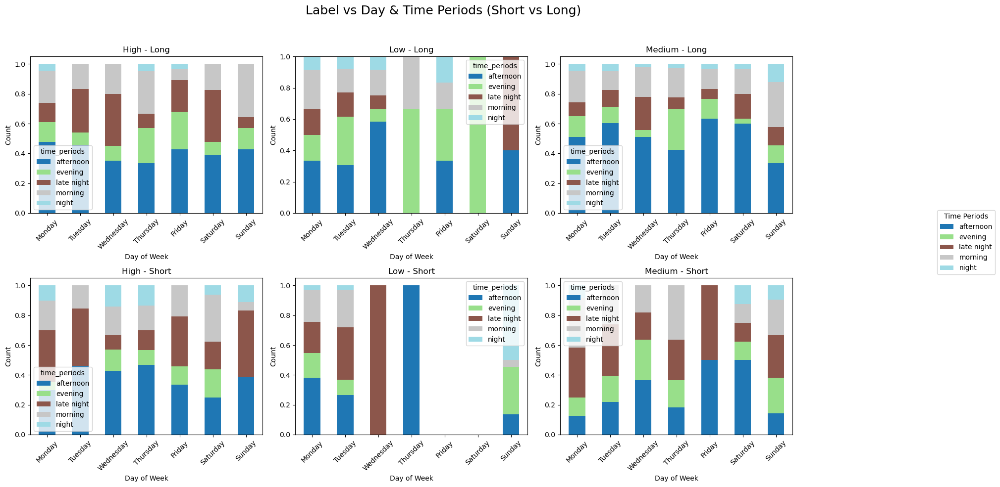

In [289]:
labels = sorted(df_final['label'].unique())
yt_types = sorted(df_final['is_yt_short'].unique())
n_rows = len(yt_types)
n_cols = len(labels)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 5*n_rows))
axes = axes.flatten()

order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

for r, types in enumerate(yt_types):  
    for c, label in enumerate(labels):  
        ax_index = r * n_cols + c
        df_subset = df_final[(df_final['label'] == label) & (df_final['is_yt_short'] == types)]
        
        crosstab = pd.crosstab(index=df_subset['day_of_week'], 
                               columns=df_subset['time_periods'],normalize='index').reindex(order)

        crosstab.plot(kind='bar', stacked=True, ax=axes[ax_index], colormap='tab20')
        axes[ax_index].set_title(f"{label} - {'Short' if types==1 else 'Long'}")
        axes[ax_index].set_xlabel("Day of Week")
        axes[ax_index].set_ylabel("Count")
        axes[ax_index].tick_params(axis='x', rotation=45)
        axes[i].set_ylim(0, 1)
                
handles, legend_labels = axes[0].get_legend_handles_labels()
fig.legend(handles, legend_labels, title="Time Periods", bbox_to_anchor=(1.05, 0.5), loc='center left')

plt.suptitle("Label vs Day & Time Periods (Short vs Long)", fontsize=18)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()


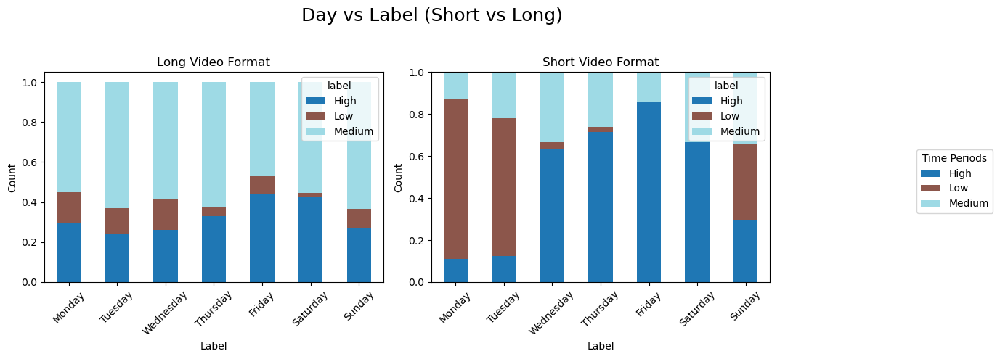

In [292]:
yt_types = sorted(df_final['is_yt_short'].unique())
n_rows = 1
n_cols = 2

fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 5*n_rows))
axes = axes.flatten()

order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

for r, types in enumerate(yt_types):  
    ax_index = r
    df_subset = df_final[(df_final['is_yt_short'] == types)]
        
    crosstab = pd.crosstab(index=df_subset['day_of_week'],columns=df_subset['label'],normalize='index').reindex(order)

    crosstab.plot(kind='bar', stacked=True, ax=axes[ax_index], colormap='tab20')
    axes[ax_index].set_title(f"{'Long Video Format' if types ==0 else 'Short Video Format'}")
    axes[ax_index].set_xlabel("Label")
    axes[ax_index].set_ylabel("Count")
    axes[ax_index].tick_params(axis='x', rotation=45)
    axes[i].set_ylim(0, 1)
                
handles, legend_labels = axes[0].get_legend_handles_labels()
fig.legend(handles, legend_labels, title="Time Periods", bbox_to_anchor=(1.05, 0.5), loc='center left')

plt.suptitle("Day vs Label (Short vs Long)", fontsize=18)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()


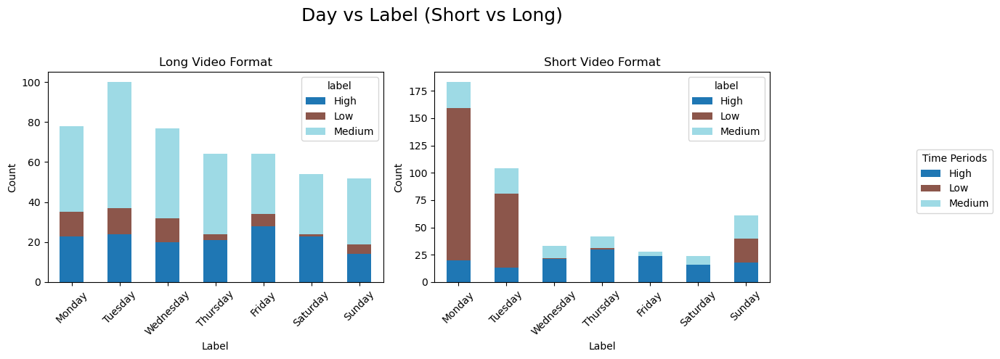

In [294]:
yt_types = sorted(df_final['is_yt_short'].unique())
n_rows = 1
n_cols = 2

fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 5*n_rows))
axes = axes.flatten()

order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

for r, types in enumerate(yt_types):  
    ax_index = r
    df_subset = df_final[(df_final['is_yt_short'] == types)]
        
    crosstab = pd.crosstab(index=df_subset['day_of_week'],columns=df_subset['label']).reindex(order)

    crosstab.plot(kind='bar', stacked=True, ax=axes[ax_index], colormap='tab20')
    axes[ax_index].set_title(f"{'Long Video Format' if types ==0 else 'Short Video Format'}")
    axes[ax_index].set_xlabel("Label")
    axes[ax_index].set_ylabel("Count")
    axes[ax_index].tick_params(axis='x', rotation=45)
                
handles, legend_labels = axes[0].get_legend_handles_labels()
fig.legend(handles, legend_labels, title="Time Periods", bbox_to_anchor=(1.05, 0.5), loc='center left')

plt.suptitle("Day vs Label (Short vs Long)", fontsize=18)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()


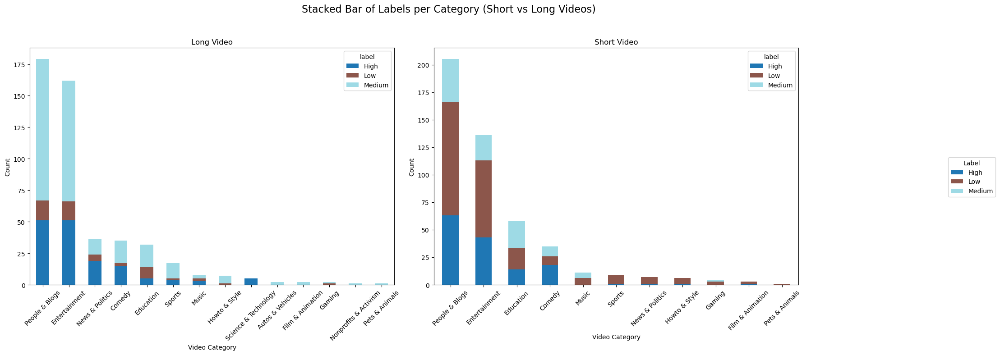

In [295]:
labels = sorted(df_final['label'].unique())
yt_types = sorted(df_final['is_yt_short'].unique())
n_rows = 1
n_cols = 2

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 8))
axes = axes.flatten()

for i, types in enumerate(yt_types):
    df_subset = df_final[df_final['is_yt_short'] == types]
    
    # Crosstab: baris = kategori, kolom = label
    crosstab = pd.crosstab(df_subset['category_name'], df_subset['label'])

    crosstab['Total'] = crosstab.sum(axis=1)
    crosstab = crosstab.sort_values('Total', ascending=False)
    crosstab = crosstab.drop(columns='Total')
    
    crosstab.plot(kind='bar', stacked=True, ax=axes[i], colormap='tab20')
    axes[i].set_title("Short Video" if types == 1 else "Long Video")
    axes[i].set_xlabel("Video Category")
    axes[i].set_ylabel("Count")
    axes[i].tick_params(axis='x', rotation=45)

handles, legend_labels = axes[0].get_legend_handles_labels()
fig.legend(handles, legend_labels, title="Label", bbox_to_anchor=(1.05, 0.5), loc='center left')

plt.suptitle("Stacked Bar of Labels per Category (Short vs Long Videos)", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()


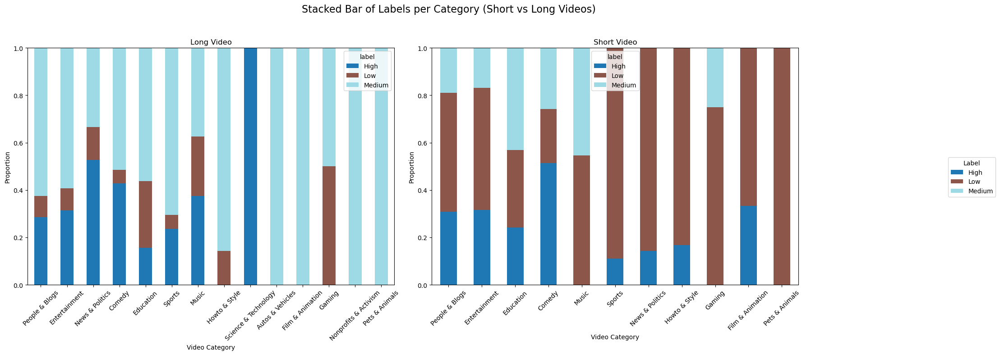

In [296]:
labels = sorted(df_final['label'].unique())
yt_types = sorted(df_final['is_yt_short'].unique())
n_rows = 1
n_cols = 2

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 8))
axes = axes.flatten()

for i, types in enumerate(yt_types):
    df_subset = df_final[df_final['is_yt_short'] == types]
    
    # Crosstab: normalisasi per kategori
    crosstab = pd.crosstab(df_subset['category_name'], df_subset['label'], normalize='index')
    
    # Sorting berdasarkan total jumlah video di tiap kategori
    count_temp = pd.crosstab(df_subset['category_name'], df_subset['label']).sum(axis=1)
    sorted_index = count_temp.sort_values(ascending=False).index
    crosstab = crosstab.loc[sorted_index]
    
    # Plot bar stack dalam bentuk proporsi (0-1)
    crosstab.plot(kind='bar', stacked=True, ax=axes[i], colormap='tab20')
    axes[i].set_title("Short Video" if types == 1 else "Long Video")
    axes[i].set_xlabel("Video Category")
    axes[i].set_ylabel("Proportion")
    axes[i].tick_params(axis='x', rotation=45)
    axes[i].set_ylim(0, 1)

handles, legend_labels = axes[0].get_legend_handles_labels()
fig.legend(handles, legend_labels, title="Label", bbox_to_anchor=(1.05, 0.5), loc='center left')

plt.suptitle("Stacked Bar of Labels per Category (Short vs Long Videos)", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()


In [298]:
df_final[(df_final['category_name']=='Science & Technology') & (df_final['is_yt_short']==0)]

,views,likes,comments,category_name,title_has_emoji,title_word_count,description_word_count,title_has_number,description_has_number,title_num_hashtags,...,is_clickbait,title_sentiment_label,description_sentiment_label,is_yt_short,views_log,likes_log,comments_log,cluster,label,time_periods
382,4519747,153801,28879,Science & Technology,0,23,26,1,0,1,...,0,negative,neutral,0,15.323967,11.943421,10.270905,0,High,morning
397,4316180,88604,9710,Science & Technology,0,15,29,1,0,1,...,0,neutral,neutral,0,15.277882,11.391944,9.181015,0,High,afternoon
628,2985614,71422,7041,Science & Technology,0,8,16,0,0,0,...,0,neutral,positive,0,14.909316,11.176375,8.859647,0,High,afternoon
951,1528569,31404,4520,Science & Technology,0,22,25,1,0,1,...,0,negative,positive,0,14.239843,10.354722,8.416488,0,High,evening
1037,681819,22851,2501,Science & Technology,0,20,23,1,0,1,...,0,positive,positive,0,13.432521,10.036794,7.824846,0,High,afternoon


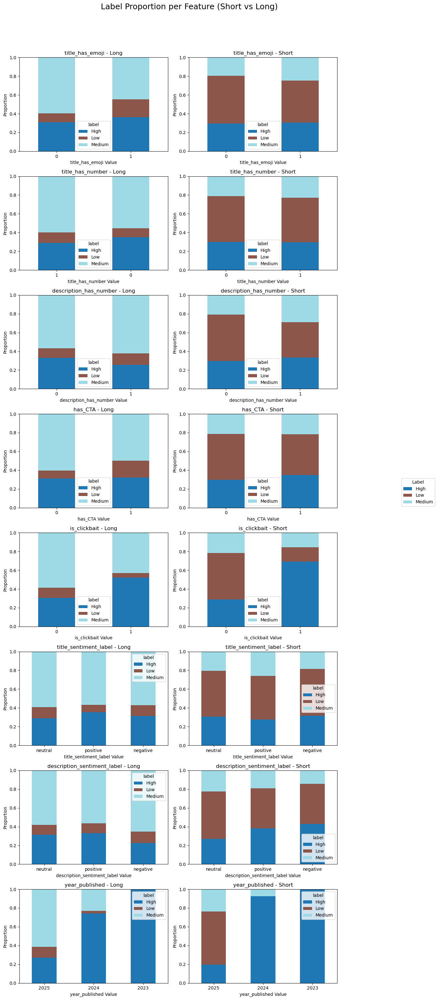

In [300]:
cat = ['title_has_emoji','title_has_number','description_has_number','has_CTA','is_clickbait', 
       'title_sentiment_label', 'description_sentiment_label','year_published']

labels = sorted(df_final['label'].unique())
yt_types = sorted(df_final['is_yt_short'].unique())

n_rows = len(cat)
n_cols = len(yt_types)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 4*n_rows))
axes = axes.flatten()

for i, types in enumerate(yt_types):
    for j, f in enumerate(cat):
        df_subset = df_final[df_final['is_yt_short'] == types]

        crosstab = pd.crosstab(df_subset[f], df_subset['label'], normalize='index')
        count_temp = pd.crosstab(df_subset[f], df_subset['label']).sum(axis=1)
        sorted_index = count_temp.sort_values(ascending=False).index
        crosstab = crosstab.loc[sorted_index]

        ax_index = j * len(yt_types) + i
        crosstab.plot(kind='bar', stacked=True, ax=axes[ax_index], colormap='tab20')
        axes[ax_index].set_title(f"{f} - {'Short' if types==1 else 'Long'}")
        axes[ax_index].set_xlabel(f"{f} Value")
        axes[ax_index].set_ylabel("Proportion")
        axes[ax_index].tick_params(axis='x', rotation=0)
        axes[ax_index].set_ylim(0, 1)

handles, legend_labels = axes[0].get_legend_handles_labels()
fig.legend(handles, legend_labels, title="Label", bbox_to_anchor=(1.05, 0.5), loc='center left')

plt.suptitle("Label Proportion per Feature (Short vs Long)", fontsize=18)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()


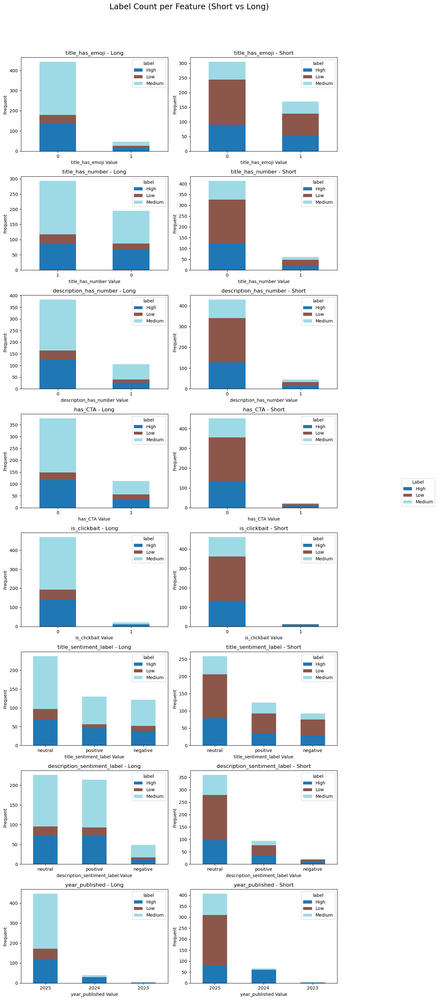

In [302]:
labels = sorted(df_final['label'].unique())
yt_types = sorted(df_final['is_yt_short'].unique())

n_rows = len(cat)
n_cols = len(yt_types)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 4*n_rows))
axes = axes.flatten()

for i, types in enumerate(yt_types):
    for j, f in enumerate(cat):
        df_subset = df_final[df_final['is_yt_short'] == types]

        crosstab = pd.crosstab(df_subset[f], df_subset['label'])
        count_temp = pd.crosstab(df_subset[f], df_subset['label']).sum(axis=1)
        sorted_index = count_temp.sort_values(ascending=False).index
        crosstab = crosstab.loc[sorted_index]

        ax_index = j * len(yt_types) + i
        crosstab.plot(kind='bar', stacked=True, ax=axes[ax_index], colormap='tab20')
        axes[ax_index].set_title(f"{f} - {'Short' if types==1 else 'Long'}")
        axes[ax_index].set_xlabel(f"{f} Value")
        axes[ax_index].set_ylabel("Frequent")
        axes[ax_index].tick_params(axis='x', rotation=0)

handles, legend_labels = axes[0].get_legend_handles_labels()
fig.legend(handles, legend_labels, title="Label", bbox_to_anchor=(1.05, 0.5), loc='center left')

plt.suptitle("Label Count per Feature (Short vs Long)", fontsize=18)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()


<H4>1.7.4. Numerical Features Visualization</H4>

<h5>1.7.4.1. Data Distribution</h5>

In [306]:
def num_plot(df, col, title, symb):
    fig, ax = plt.subplots(2, 1, sharex=True, figsize=(8,5),gridspec_kw={"height_ratios": (.2, .8)})
    ax[0].set_title(title,fontsize=18)
    sns.boxplot(x=col, data=df, ax=ax[0])
    ax[0].set(yticks=[])
    sns.histplot(x=col, data=df, ax=ax[1])
    ax[1].set_xlabel(col, fontsize=16)
    plt.axvline(df[col].mean(), color='darkgreen', linewidth=2.2, label='mean=' + str(np.round(df[col].mean(),1)) + symb)
    plt.axvline(df[col].median(), color='red', linewidth=2.2, label='median='+ str(np.round(df[col].median(),1)) + symb)
    plt.axvline(df[col].mode()[0], color='purple', linewidth=2.2, label='mode='+ str(df[col].mode()[0]) + symb)
    plt.legend(bbox_to_anchor=(1, 1.03), ncol=1, fontsize=17, fancybox=True, shadow=True, frameon=True)
    plt.tight_layout()
    plt.show()

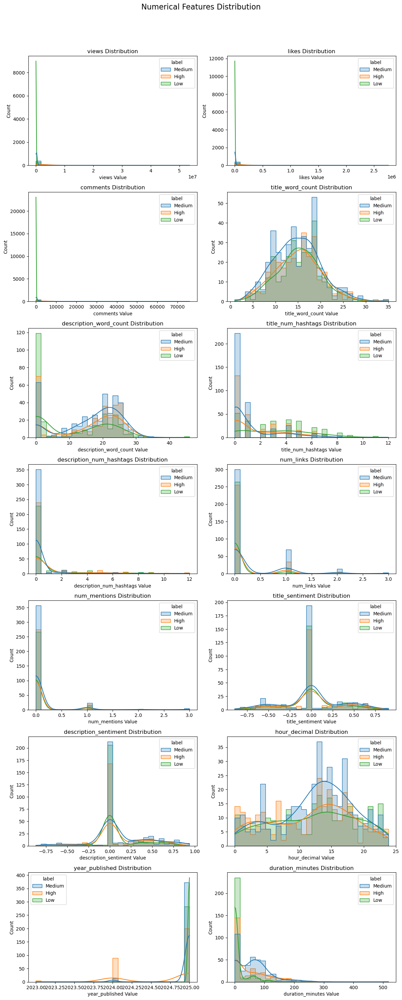

In [307]:
n_rows = (len(num_cols)+1)
n_cols = 2

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4*n_rows))
axes = axes.flatten()

for i, f in enumerate(num_cols):
    sns.histplot(data=df_final, x=f, hue='label', kde=True, bins=30, element='step', ax=axes[i])
    axes[i].set_title(f'{f} Distribution')
    axes[i].set_xlabel(f'{f} Value')
    axes[i].set_ylabel('Count')

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Numerical Features Distribution", fontsize=16, y=1.02)
plt.show()

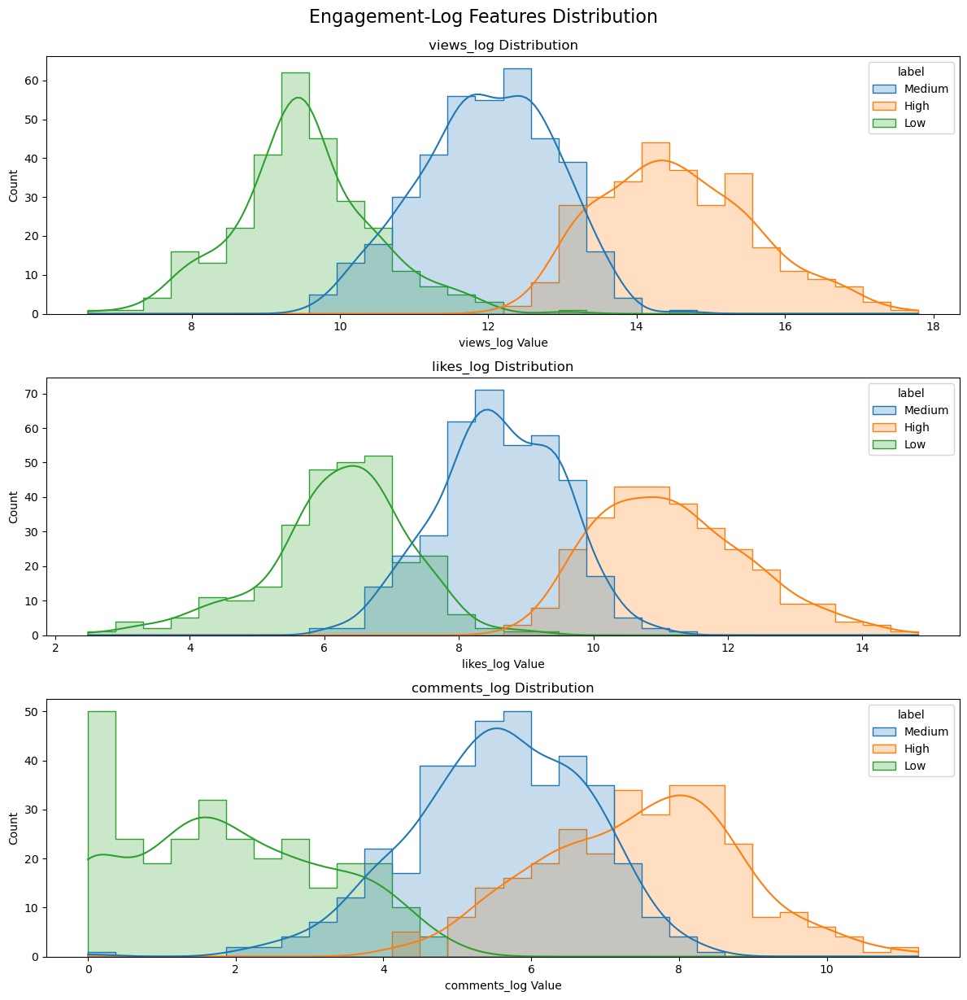

In [308]:
engagement_log = ['views_log', 'likes_log', 'comments_log']
n_rows = len(engagement_log)
n_cols = 1

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4 * n_rows))
axes = axes.flatten()

for i, f in enumerate(engagement_log):
    sns.histplot(data=df_final, x=f, hue='label', kde=True, bins=30, element='step', ax=axes[i])
    axes[i].set_title(f'{f} Distribution')
    axes[i].set_xlabel(f'{f} Value')
    axes[i].set_ylabel('Count')

plt.tight_layout()
plt.suptitle("Engagement-Log Features Distribution", fontsize=16, y=1.02)
plt.show()


Numerical Features Aggregation Visualization

In [310]:
averaging_cols = ['title_sentiment',
 'description_sentiment',
 'hour_decimal',
 'duration_minutes']
summable_cols = [x for x in num_cols if x not in averaging_cols+['year_published']]

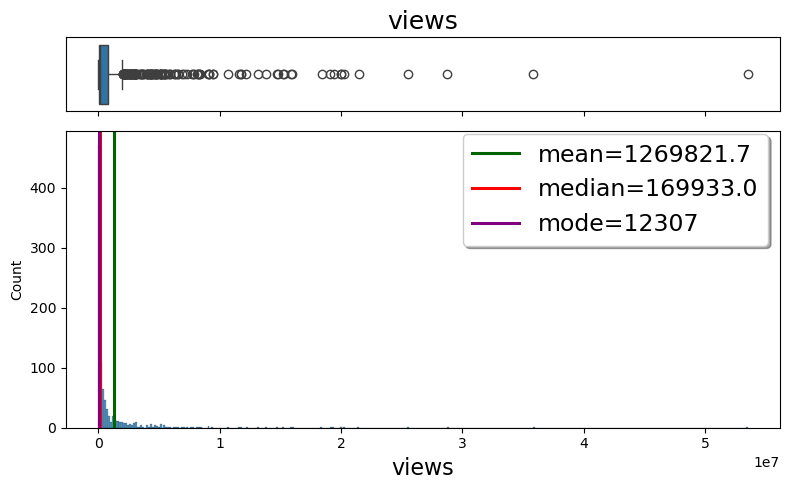

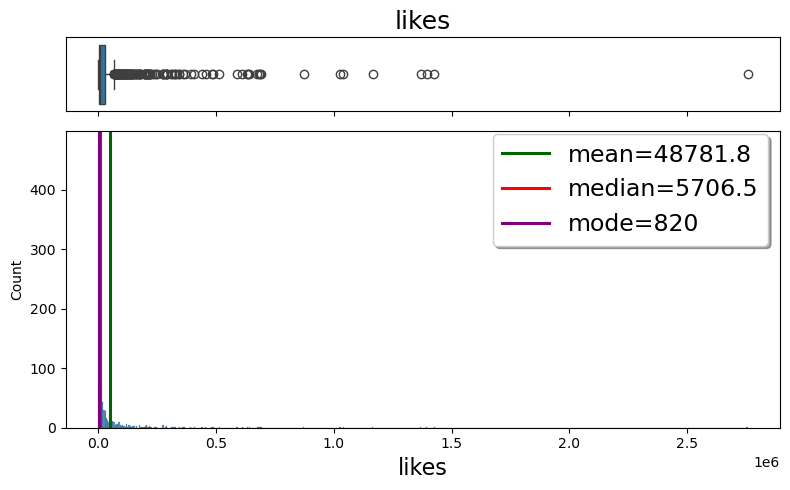

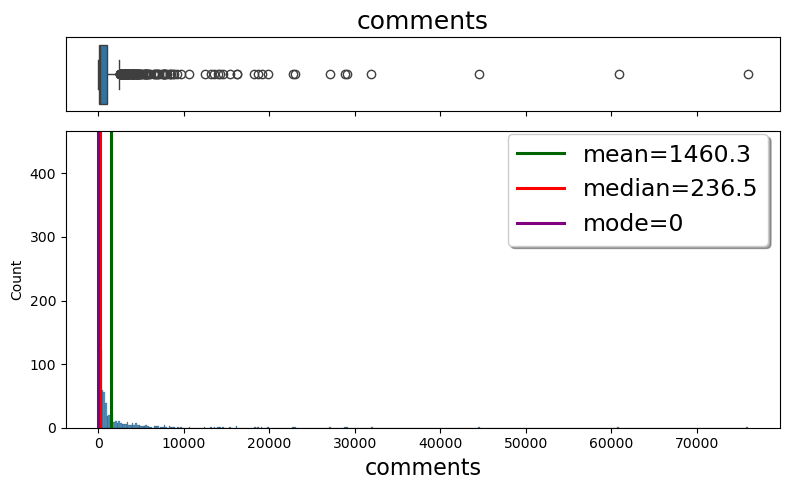

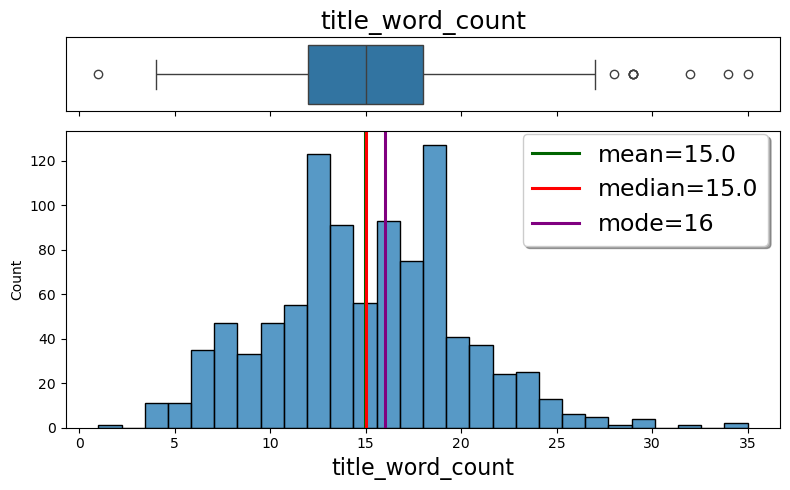

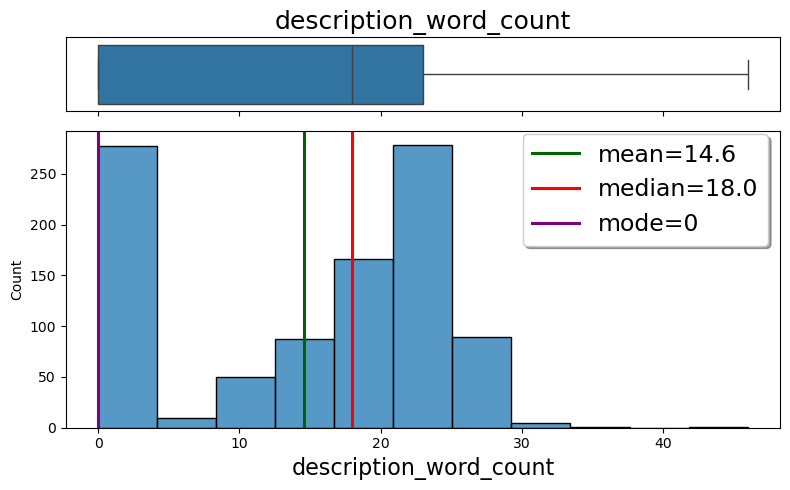

...

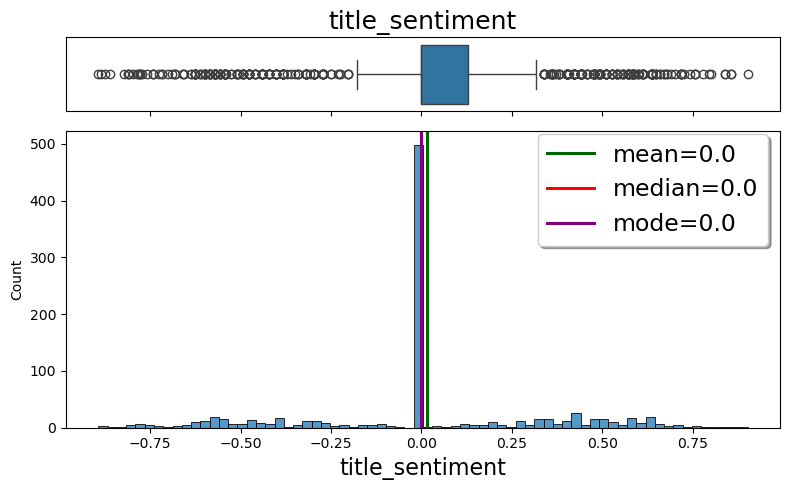

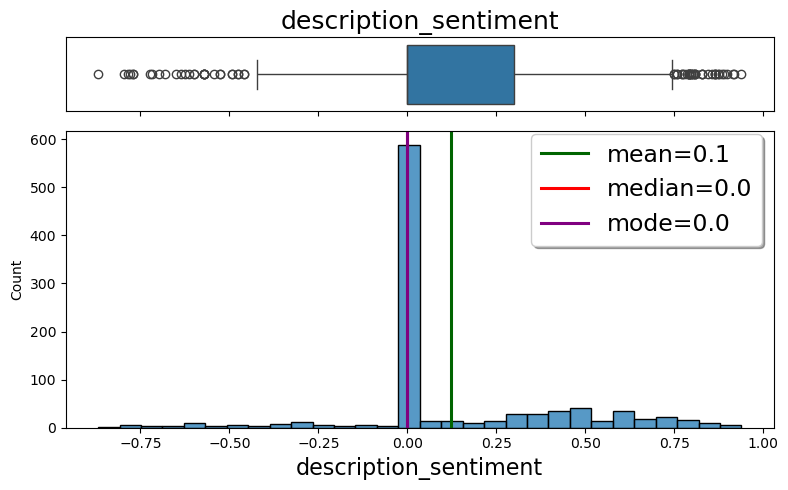

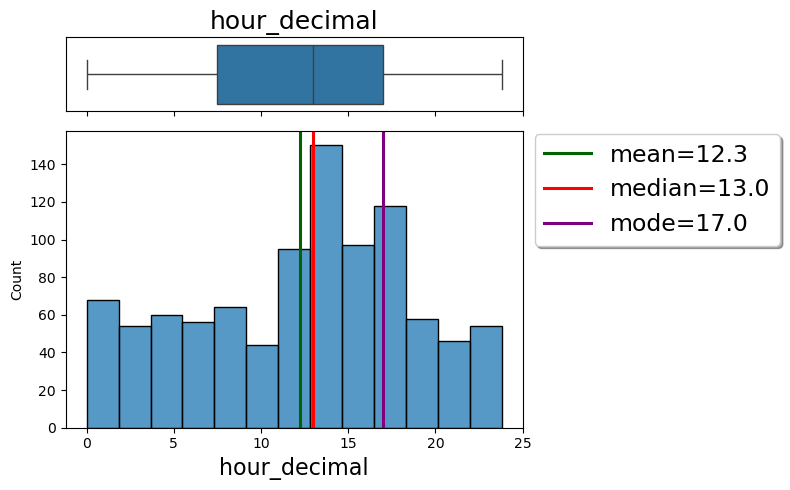

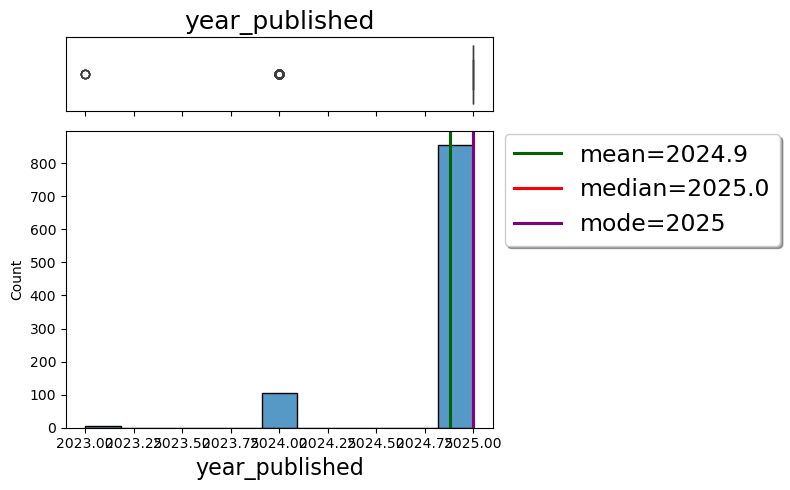

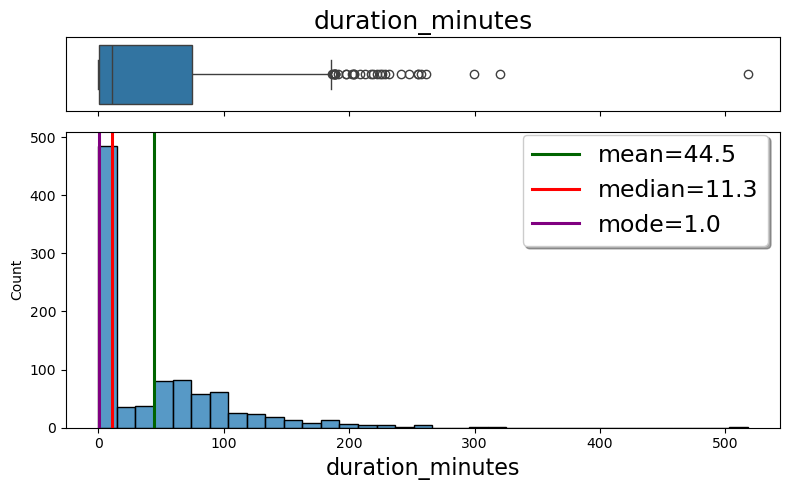

In [312]:
for col in num_cols:
    num_plot(df_final,col,col,"")

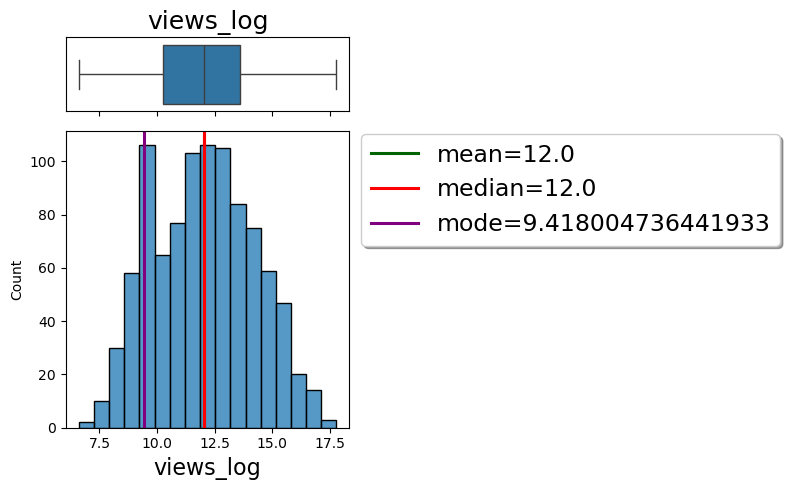

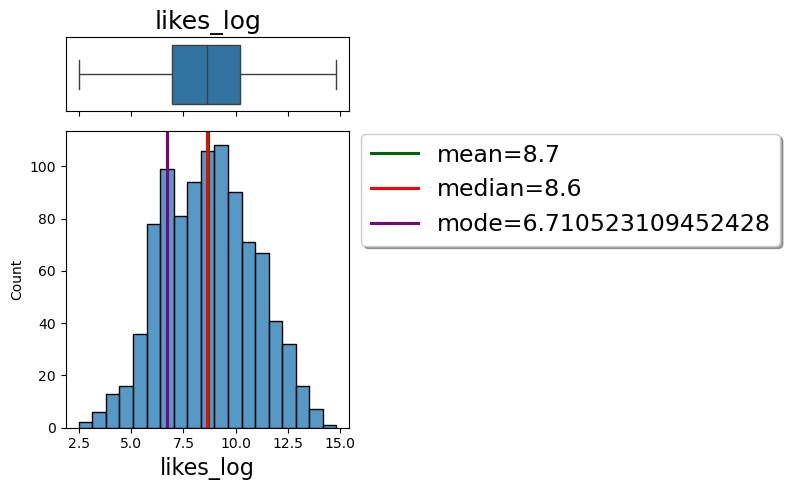

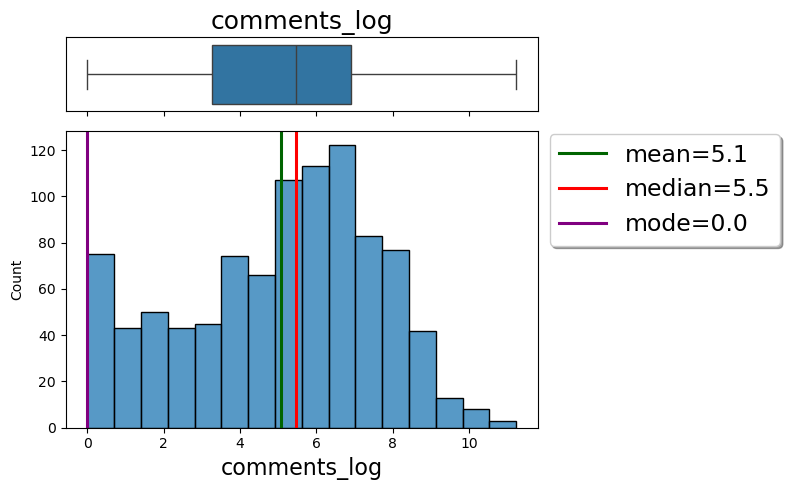

In [313]:
for col in engagement_log:
    num_plot(df_final,col,col,"")

Lets split the distribution into long and short video categories

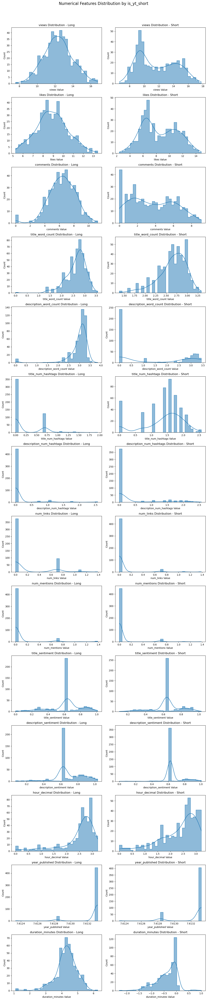

In [315]:
#we can ignore the year published

df_log = df_final.copy()

for col in num_cols:
    min_val = df_final[col].min()
    if min_val <= 0:
        shifted = df_final[col] - min_val + 1 
    else:
        shifted = df_final[col]
    
    df_log[col] = np.log(shifted) 

n_rows = len(num_cols)
n_cols = len(yt_types)
yt_types = sorted(df_final['is_yt_short'].unique())

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4 * n_rows))
axes = axes.flatten()

for i, t in enumerate(yt_types):
    for j, f in enumerate(num_cols):
        ax_idx = j * len(yt_types) + i
        subset = df_log[df_log['is_yt_short'] == t]
        sns.histplot(data=subset, x=f, hue=None, kde=True, bins=30, element='step', ax=axes[ax_idx])
        axes[ax_idx].set_title(f'{f} Distribution - {"Short" if t == 1 else "Long"}')
        axes[ax_idx].set_xlabel(f'{f} Value')
        axes[ax_idx].set_ylabel('Count')

for k in range(ax_idx + 1, len(axes)):
    fig.delaxes(axes[k])

plt.tight_layout()
plt.suptitle("Numerical Features Distribution by is_yt_short", fontsize=16, y=1.02)
plt.show()


<h5>1.7.4.2. Numerical Features Statistical Visualization</h5>

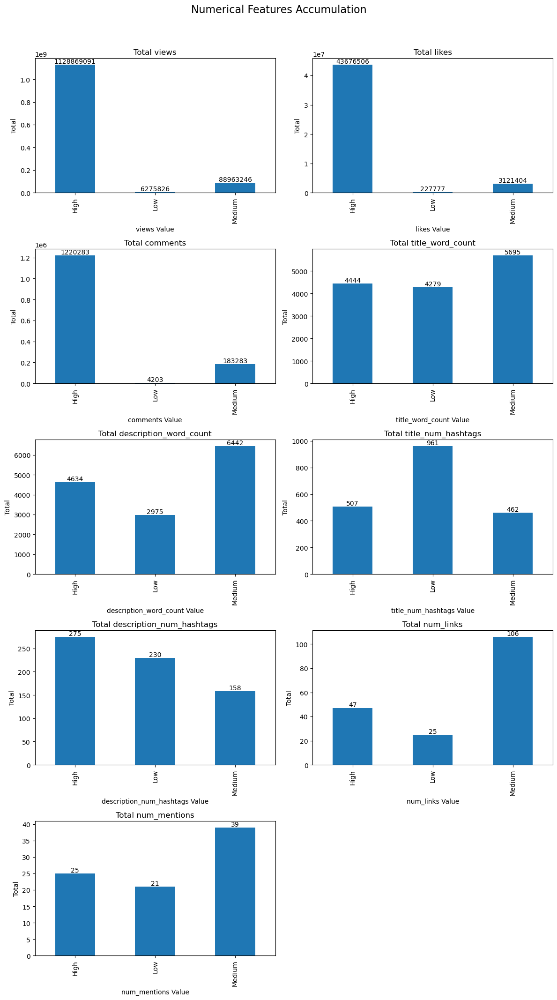

In [317]:
n_rows = (len(summable_cols)+1)
n_cols = 2

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4*n_rows))
axes = axes.flatten()

for i, f in enumerate(summable_cols):
    agg = df_final.groupby('label')[f].sum()
    ax = axes[i] 
    agg.plot(ax=ax,kind='bar', colormap='tab20')
    axes[i].set_title(f'Total {f}')
    axes[i].set_xlabel(f'{f} Value')
    axes[i].set_ylabel('Total')

    for p in ax.patches:
            height = p.get_height()
            ax.annotate(f'{height:.0f}',
                        (p.get_x() + p.get_width() / 2, height),
                        ha='center', va='bottom', fontsize=10)


for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Numerical Features Accumulation", fontsize=16, y=1.02)
plt.show()

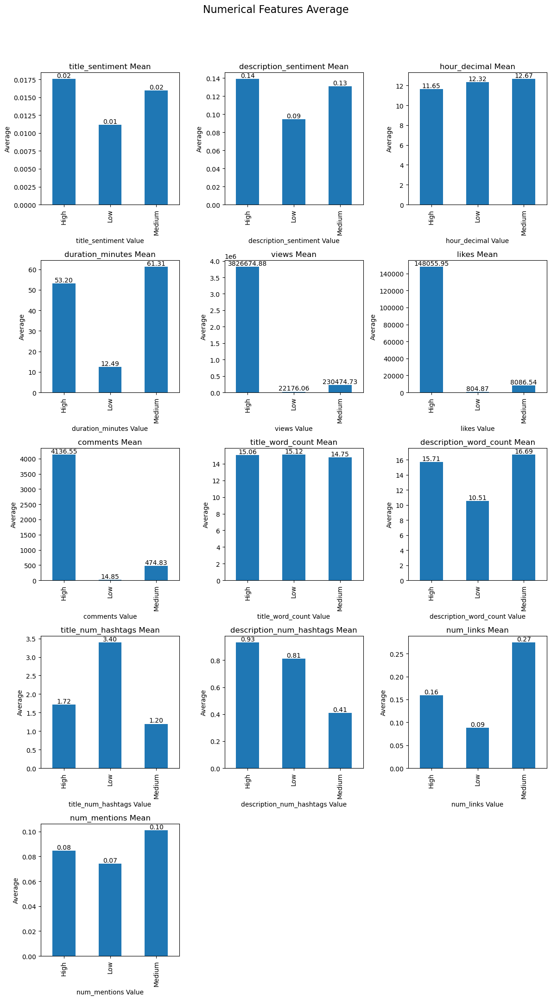

In [319]:
n_rows = (len(averaging_cols+summable_cols)+1)
n_cols = 3

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4*n_rows))
axes = axes.flatten()

for i, f in enumerate(averaging_cols+summable_cols):
    agg = df_final.groupby('label')[f].mean()
    ax = axes[i] 
    agg.plot(ax=ax,kind='bar', colormap='tab20')
    axes[i].set_title(f'{f} Mean')
    axes[i].set_xlabel(f'{f} Value')
    axes[i].set_ylabel('Average')
    
    for p in ax.patches:
            height = p.get_height()
            ax.annotate(f'{height:.2f}',
                        (p.get_x() + p.get_width() / 2, height),
                        ha='center', va='bottom', fontsize=10)


for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Numerical Features Average", fontsize=16, y=1.02)
plt.show()

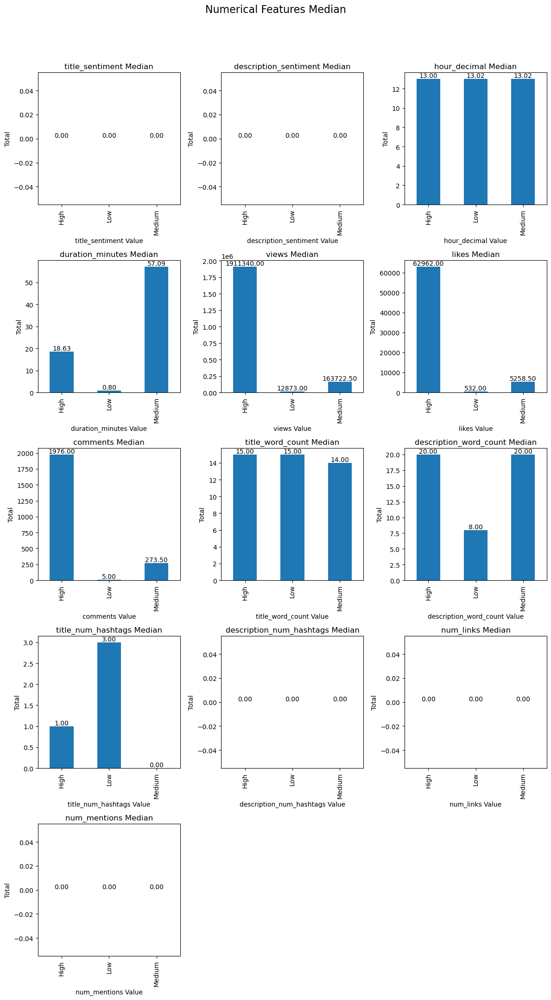

In [321]:
n_rows = (len(averaging_cols+summable_cols)+1)
n_cols = 3

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4*n_rows))
axes = axes.flatten()

for i, f in enumerate(averaging_cols+summable_cols):
    agg = df_final.groupby('label')[f].median()
    ax = axes[i] 
    agg.plot(ax=ax,kind='bar', colormap='tab20')
    axes[i].set_title(f'{f} Median')
    axes[i].set_xlabel(f'{f} Value')
    axes[i].set_ylabel('Total')
    
    for p in ax.patches:
            height = p.get_height()
            ax.annotate(f'{height:.2f}',
                        (p.get_x() + p.get_width() / 2, height),
                        ha='center', va='bottom', fontsize=10)


for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Numerical Features Median", fontsize=16, y=1.02)
plt.show()

Numerical Features Aggregation Visualization Based on YouTube Types

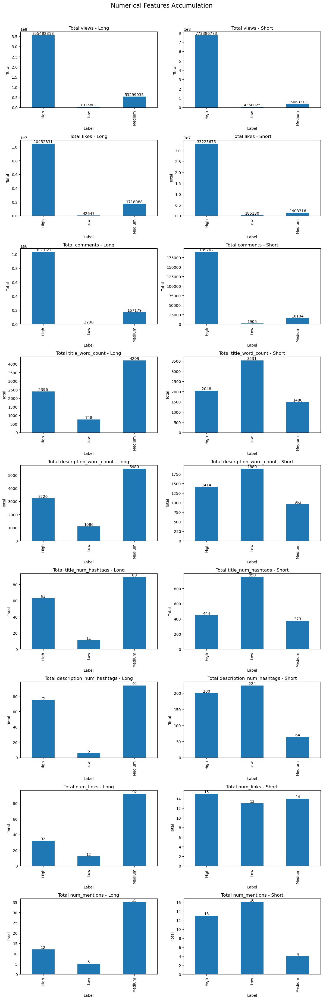

In [324]:
types = sorted(df_final['is_yt_short'].unique())
n_rows = len(summable_cols)
n_cols = len(types)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4*n_rows))
axes = axes.flatten()

for i, t in enumerate(types):
    for j, f in enumerate(summable_cols):
        
        agg = df_final[df_final['is_yt_short'] == t].groupby('label')[f].sum()
        ax_idx = j * len(types) + i
        agg.plot(ax=axes[ax_idx], kind='bar', colormap='tab20')
        
        axes[ax_idx].set_title(f"Total {f} - {'Short' if t == 1 else 'Long'}")
        axes[ax_idx].set_xlabel("Label")
        axes[ax_idx].set_ylabel("Total")

        for p in axes[ax_idx].patches:
            height = p.get_height()
            axes[ax_idx].annotate(f'{height:.0f}',
                                  (p.get_x() + p.get_width() / 2, height),
                                  ha='center', va='bottom', fontsize=10)

# Hapus subplot kosong jika ada
for k in range(ax_idx + 1, len(axes)):
    fig.delaxes(axes[k])

plt.tight_layout()
plt.suptitle("Numerical Features Accumulation", fontsize=16, y=1.02)
plt.show()


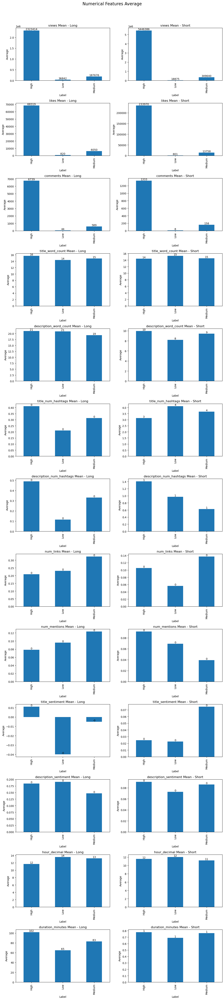

In [325]:
types = sorted(df_final['is_yt_short'].unique())
n_rows = len(summable_cols+averaging_cols)
n_cols = len(types)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4*n_rows))
axes = axes.flatten()

for i, t in enumerate(types):
    for j, f in enumerate(summable_cols+averaging_cols):
        
        agg = df_final[df_final['is_yt_short'] == t].groupby('label')[f].mean()
        ax_idx = j * len(types) + i
        agg.plot(ax=axes[ax_idx], kind='bar', colormap='tab20')
        
        axes[ax_idx].set_title(f"{f} Mean - {'Short' if t == 1 else 'Long'}")
        axes[ax_idx].set_xlabel("Label")
        axes[ax_idx].set_ylabel("Average")

        for p in axes[ax_idx].patches:
            height = p.get_height()
            axes[ax_idx].annotate(f'{height:.0f}',
                                  (p.get_x() + p.get_width() / 2, height),
                                  ha='center', va='bottom', fontsize=10)

# Hapus subplot kosong jika ada
for k in range(ax_idx + 1, len(axes)):
    fig.delaxes(axes[k])

plt.tight_layout()
plt.suptitle("Numerical Features Average", fontsize=16, y=1.02)
plt.show()


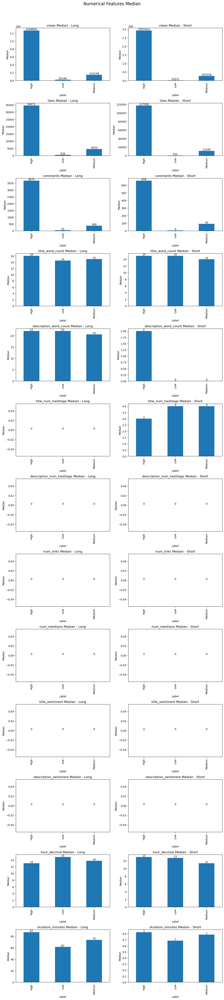

In [327]:
types = sorted(df_final['is_yt_short'].unique())
n_rows = len(summable_cols+averaging_cols)
n_cols = len(types)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4*n_rows))
axes = axes.flatten()

for i, t in enumerate(types):
    for j, f in enumerate(summable_cols+averaging_cols):
        
        agg = df_final[df_final['is_yt_short'] == t].groupby('label')[f].median()
        ax_idx = j * len(types) + i
        agg.plot(ax=axes[ax_idx], kind='bar', colormap='tab20')
        
        axes[ax_idx].set_title(f"{f} Median - {'Short' if t == 1 else 'Long'}")
        axes[ax_idx].set_xlabel("Label")
        axes[ax_idx].set_ylabel("Median")

        for p in axes[ax_idx].patches:
            height = p.get_height()
            axes[ax_idx].annotate(f'{height:.0f}',
                                  (p.get_x() + p.get_width() / 2, height),
                                  ha='center', va='bottom', fontsize=10)

# Hapus subplot kosong jika ada
for k in range(ax_idx + 1, len(axes)):
    fig.delaxes(axes[k])

plt.tight_layout()
plt.suptitle("Numerical Features Median", fontsize=16, y=1.02)
plt.show()


<H4>1.7.5. Categorical vs Numerical Features Visualization</H4>

In [331]:
cat = cat+['day_of_week','time_periods']

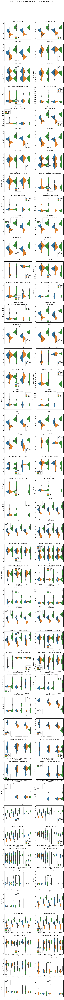

In [332]:
df_log = df_final[df_final['is_yt_short']==1].copy()

for col in num_cols:
    min_val = df_final[col].min()
    if min_val <= 0:
        shifted = df_final[col] - min_val + 1 
    else:
        shifted = df_final[col]
    
    df_log[col] = np.log(shifted) 

n_cols = 2
n_plots = len(cat) * len(summable_cols)
n_rows = math.ceil(n_plots / n_cols)


fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 4 * n_rows))
axes = axes.flatten()

plot_idx = 0

for cat_col in cat:
    for num_col in summable_cols:
        if plot_idx < len(axes):
            sns.violinplot(
                data=df_log,
                x=cat_col,
                y=num_col,
                hue='label',
                split=True,
                ax=axes[plot_idx]
            )
            axes[plot_idx].set_title(f"{num_col} vs {cat_col}")
            axes[plot_idx].set_xlabel(cat_col)
            axes[plot_idx].set_ylabel(num_col)
            plot_idx += 1

# Hapus axis sisa yang tidak terpakai
for k in range(plot_idx, len(axes)):
    fig.delaxes(axes[k])

plt.tight_layout()
plt.suptitle("Violin Plot of Numerical Features by Category and Label in YouTube Short", fontsize=16, y=1.02)
plt.show()


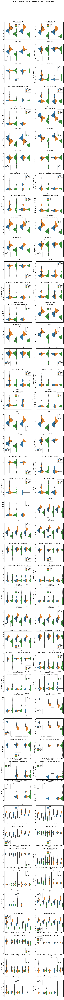

In [334]:
df_log = df_final[df_final['is_yt_short']==0].copy()

for col in num_cols:
    min_val = df_final[col].min()
    if min_val <= 0:
        shifted = df_final[col] - min_val + 1 
    else:
        shifted = df_final[col]
    
    df_log[col] = np.log(shifted) 

n_cols = 2
n_plots = len(cat) * len(summable_cols)
n_rows = math.ceil(n_plots / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 4 * n_rows))
axes = axes.flatten()

plot_idx = 0 

for cat_col in cat:
    for num_col in summable_cols:
        if plot_idx < len(axes):
            sns.violinplot(
                data=df_log,
                x=cat_col,
                y=num_col,
                hue='label',
                split=True,
                ax=axes[plot_idx]
            )
            axes[plot_idx].set_title(f"{num_col} vs {cat_col}")
            axes[plot_idx].set_xlabel(cat_col)
            axes[plot_idx].set_ylabel(num_col)
            plot_idx += 1

for k in range(plot_idx, len(axes)):
    fig.delaxes(axes[k])

plt.tight_layout()
plt.suptitle("Violin Plot of Numerical Features by Category and Label in YouTube Long", fontsize=16, y=1.02)
plt.show()


<H3>1.8. NLP Approach For extract any Information in Title and Description</H3>

<H4>1.8.1. Title & Description Topic Visulaization with Word Coud</H4>

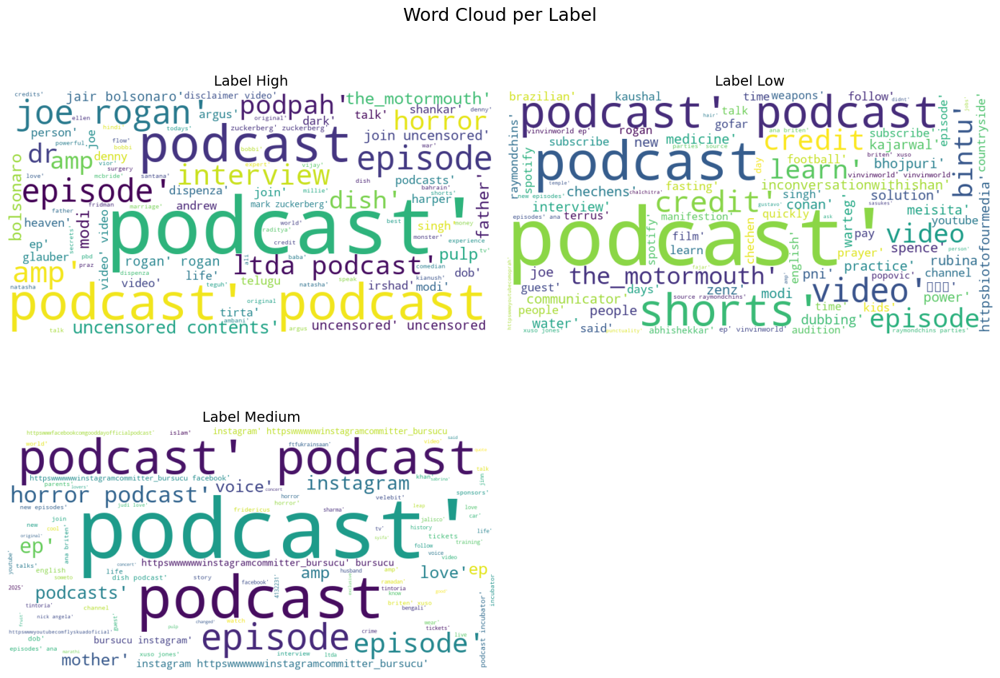

In [339]:
df_final['text_all'] = df_final['title_topic'] + ' ' + df_final['description_topic']
labels = sorted(df_final['label'].unique())
n_cols = 2
n_rows = (len(labels) + 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 5 * n_rows))

if n_rows * n_cols == 1:
    axes = [axes]

axes = axes.flatten()

for i, label in enumerate(labels):
    text = ' '.join(df_final[df_final['label'] == label]['text_all'].astype(str).tolist())
    
    wordcloud = WordCloud(width=800, height=400, background_color='white',
                          max_words=100, colormap='viridis').generate(text)
    
    axes[i].imshow(wordcloud, interpolation='bilinear')
    axes[i].axis('off')
    axes[i].set_title(f"Label {label}", fontsize=14)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Word Cloud per Label", fontsize=18, y=1.02)
plt.show()


<H4>1.8.2. TF-IDF Vectorization Approach</H4>

<h5>1.8.2.1. TF-IDF Based on Label</h5>

In [343]:
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def custom_tokenizer(text):
    text = text.lower()
    text = re.sub(r'[^a-z\s]', '', text)
    text = re.sub(r'\bamp\b', '', text)


    tokens = word_tokenize(text)

    tokens = [lemmatizer.lemmatize(word) for word in tokens if word not in stop_words and len(word) > 2]

    return tokens

[nltk_data] Downloading package punkt to /Users/afyd/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /Users/afyd/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/afyd/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [344]:
labels = sorted(df_final['label'].unique())
top_n = 10
tfidf_per_label = {}

In [345]:
for label in labels:
    subset = df_final[df_final['label'] == label]
    
    vectorizer = TfidfVectorizer(tokenizer=custom_tokenizer, lowercase=False, max_features=1000)
    tfidf_matrix = vectorizer.fit_transform(subset['text_all'])
    tfidf_sum = tfidf_matrix.sum(axis=0)
    tfidf_scores = tfidf_sum.A1

    vocab = vectorizer.get_feature_names_out()
    tfidf_df = pd.DataFrame({'term': vocab, 'score': tfidf_scores})
    tfidf_df = tfidf_df.sort_values(by='score', ascending=False).head(top_n)
    
    tfidf_per_label[label] = tfidf_df

/opt/anaconda3/lib/python3.12/site-packages/sklearn/feature_extraction/text.py:521: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


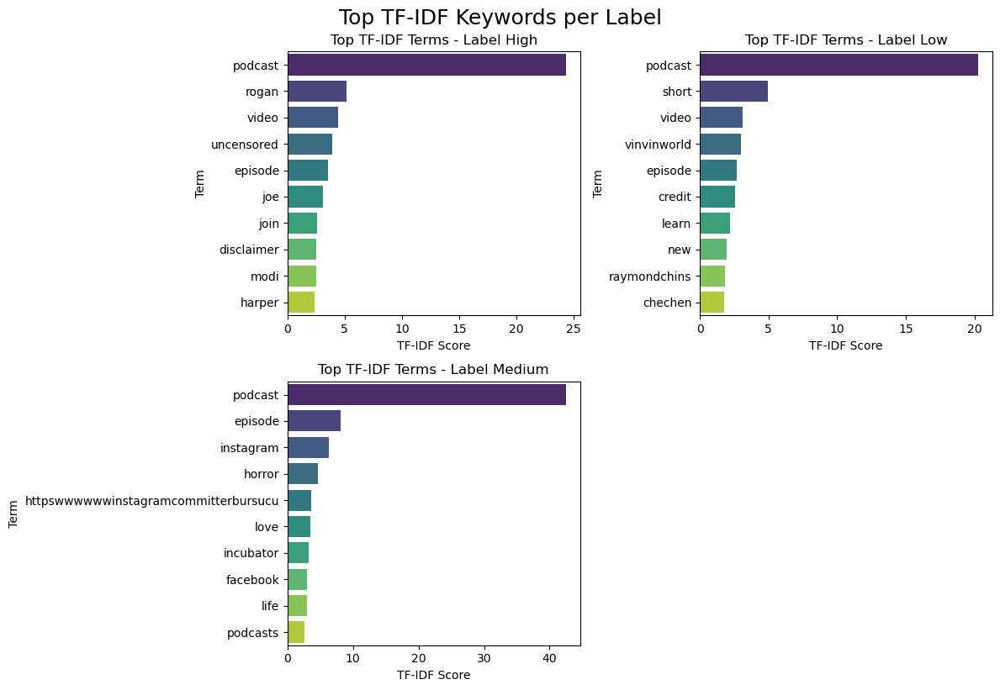

In [348]:
n_cols = 2
n_rows = (len(labels) + 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4 * n_rows))
axes = axes.flatten()

for i, label in enumerate(labels):
    df = tfidf_per_label[label]
    sns.barplot(x='score', y='term', data=df, ax=axes[i], palette='viridis')
    axes[i].set_title(f'Top TF-IDF Terms - Label {label}')
    axes[i].set_xlabel('TF-IDF Score')
    axes[i].set_ylabel('Term')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Top TF-IDF Keywords per Label", fontsize=18, y=1.02)
plt.show()


<H5>Common Words</H5>
<h6>This is a general words that appear in title or description</h6>
'podcast',
'video',
'uncensored',
'episode',
'join',
'disclaimer',
'short',
'credit',
'learn',
'new',
'horror',
'love',
'life',
'podcasts'

<h5>Spesific Words</h5>
<h6>This is a words contain entity such as name, organization, company, Channel, or Social Media Account</h6>
'rogan',           
'joe',               
'modi',              
'harper',            
'vinvinworld',       
'raymondchins',      
'chechen',           
'instagram',         
'httpswwwwwwinstagramcommitterbursucu',
'facebook',          
'incubator'  

<H6>It seems the dataset contain some video with specific channel that appear in significant frequent. This can be happened during the data api scrapping/extracting</H6>

<h5>1.8.2.2. TF-IDF Based on Long-Short Video Types</h5>

In [351]:
yt_types = sorted(df_final['is_yt_short'].unique())
top_n = 10
tfidf_per_types = {}

In [352]:
for types in yt_types:
    subset = df_final[df_final['is_yt_short'] == types]
    
    vectorizer = TfidfVectorizer(tokenizer=custom_tokenizer, lowercase=False, max_features=1000)
    tfidf_matrix = vectorizer.fit_transform(subset['text_all'])
    tfidf_sum = tfidf_matrix.sum(axis=0)
    tfidf_scores = tfidf_sum.A1

    vocab = vectorizer.get_feature_names_out()
    tfidf_df = pd.DataFrame({'term': vocab, 'score': tfidf_scores})
    tfidf_df = tfidf_df.sort_values(by='score', ascending=False).head(top_n)
    
    tfidf_per_types[types] = tfidf_df

/opt/anaconda3/lib/python3.12/site-packages/sklearn/feature_extraction/text.py:521: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


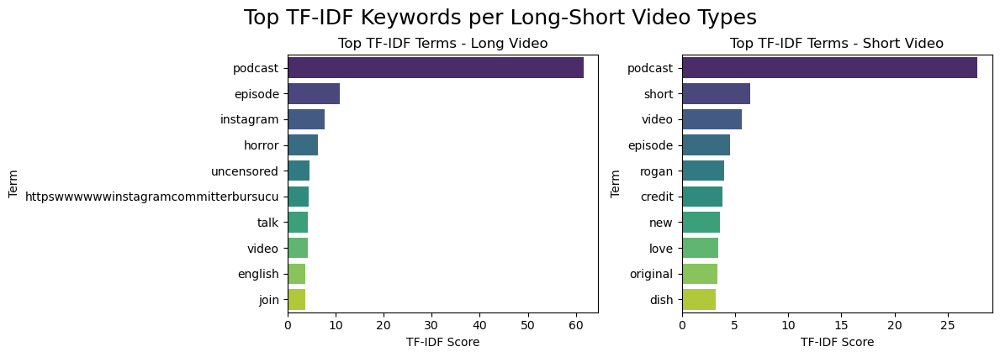

In [353]:
n_cols = 2
n_rows = (len(yt_types) + 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4 * n_rows))
axes = axes.flatten()

for i, types in enumerate(yt_types):
    df = tfidf_per_types[types]
    sns.barplot(x='score', y='term', data=df, ax=axes[i], palette='viridis')
    axes[i].set_title(f'Top TF-IDF Terms - {'Short' if types==1 else 'Long'} Video')
    axes[i].set_xlabel('TF-IDF Score')
    axes[i].set_ylabel('Term')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Top TF-IDF Keywords per Long-Short Video Types", fontsize=18, y=1.05)
plt.show()


Both types contain the term "podcast" with significant scores, indicating that the dataset is relevant to the research scope.

In second place, we find "episode" in long videos and "short" in short videos.
The term "episode" suggests that long videos are often divided into multiple parts, which is a common practice in many YouTube podcast formats.

Meanwhile, the term "short" typically appears in YouTube Shorts, indicating shorter-form content.

In third place for long videos, the term "instagram" appears, which likely refers to either the guest’s or the channel owner's Instagram handle or promotion.



<h5>1.8.2.3. TF-IDF Based on Long-Short Video Types & Labels</h5>

In [394]:
tfidf_label_types = {}

In [412]:
tfidf_label_types = {}

for label in labels:
    for types in yt_types:
        subset = df_final[(df_final['is_yt_short'] == types) & (df_final['label'] == label)]

        vectorizer = TfidfVectorizer(tokenizer=custom_tokenizer, lowercase=False, max_features=1000)
        tfidf_matrix = vectorizer.fit_transform(subset['text_all'])
        tfidf_sum = tfidf_matrix.sum(axis=0)
        tfidf_scores = tfidf_sum.A1

        vocab = vectorizer.get_feature_names_out()
        tfidf_df = pd.DataFrame({'term': vocab, 'score': tfidf_scores})
        tfidf_df = tfidf_df.sort_values(by='score', ascending=False).head(top_n)

        tfidf_label_types[(label, types)] = tfidf_df


/opt/anaconda3/lib/python3.12/site-packages/sklearn/feature_extraction/text.py:521: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


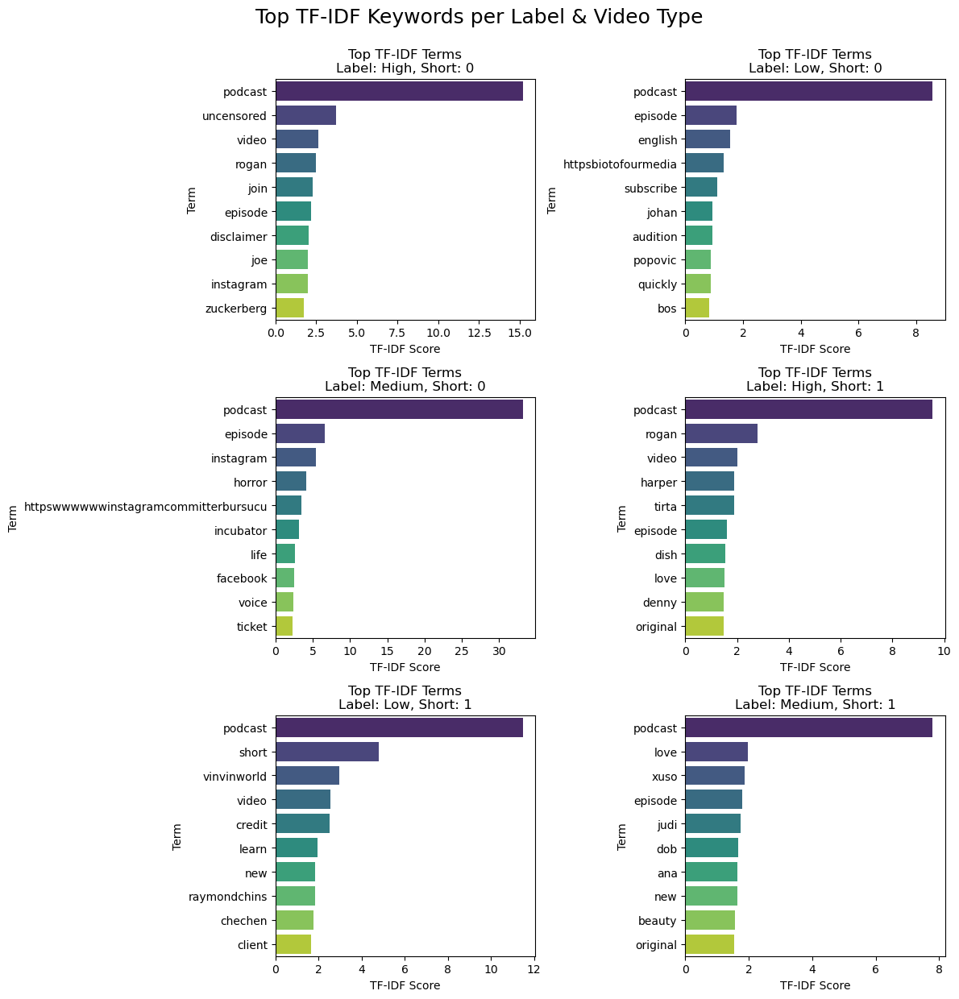

In [420]:
n_cols = 2
n_rows = 3
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4 * n_rows))
axes = axes.flatten()

plot_idx = 0  # index untuk subplot

for types in yt_types:
    for label in labels:
        key = (label, types)
        if key in tfidf_label_types:
            df = tfidf_label_types[key]
            sns.barplot(x='score', y='term', data=df, ax=axes[plot_idx], palette='viridis')
            axes[plot_idx].set_title(f'Top TF-IDF Terms\nLabel: {label}, Short: {types}')
            axes[plot_idx].set_xlabel('TF-IDF Score')
            axes[plot_idx].set_ylabel('Term')
            plot_idx += 1

# Hapus sisa subplot yang tidak terpakai
for j in range(plot_idx, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.suptitle("Top TF-IDF Keywords per Label & Video Type", fontsize=18, y=1.03)
plt.show()


In [357]:
#Transform and Export Dataset For Tableau Visialization

# df_export = df_final.copy()
# df_export.drop(columns=['title_eng', 'description_eng','title_topic',
#        'description_topic','views_log', 'likes_log',
#        'comments_log','cluster','text_all',
#        'text_all_ner'],inplace=True)

In [359]:
# df_export['title_emoji'] = df_export['title_has_emoji'].apply(lambda x: 'has emoji' if x==1 else 'doesnt has emoji')
# df_export['title_number'] = df_export['title_has_number'].apply(lambda x: 'has number' if x==1 else 'doesnt has number')
# df_export['description_number'] = df_export['description_has_number'].apply(lambda x: 'has number' if x==1 else 'doesnt has number')
# df_export['CTA'] = df_export['has_CTA'].apply(lambda x: 'has CTA' if x==1 else 'doesnt has CTA')
# df_export['clickbait_status'] = df_export['is_clickbait'].apply(lambda x: 'clickbait' if x==1 else 'not a clickbait')
# df_export['duration_types'] = df_export['is_yt_short'].apply(lambda x: 'short' if x==1 else 'long')

# df_export.drop(columns=['title_has_emoji','title_has_number','description_has_number','has_CTA','is_clickbait','is_yt_short'],inplace=True)

In [1175]:
# df_export.to_csv('youtube_analytics_for_tableau.csv',index=False)

In [410]:
tfidf_label_types

{0:                                      term      score
 583                               podcast  33.161332
 243                               episode   6.560838
 396                             instagram   5.386611
 348                                horror   4.159480
 378  httpswwwwwwinstagramcommitterbursucu   3.519564
 389                             incubator   3.209481
 440                                  life   2.607844
 259                              facebook   2.521204
 955                                 voice   2.361621
 872                                ticket   2.287254,
 1:          term     score
 222   podcast  7.797999
 178      love  1.980698
 333      xuso  1.861805
 86    episode  1.793377
 158      judi  1.749764
 77        dob  1.676238
 6         ana  1.649742
 204       new  1.633651
 21     beauty  1.557851
 211  original  1.533421}